In [5]:
pwd

'/Users/michaelfinch/CA1-interneuron-GLM/Clean_notebooks_to_date'

In [18]:
import sys
from scipy.stats import sem
sys.path.append('/Users/michaelfinch/CA1-interneuron-GLM')

from utils_TCA_clustering_scratchpad import *
from GLM_regression_plotting import *


from modelling_to_date_utils import *

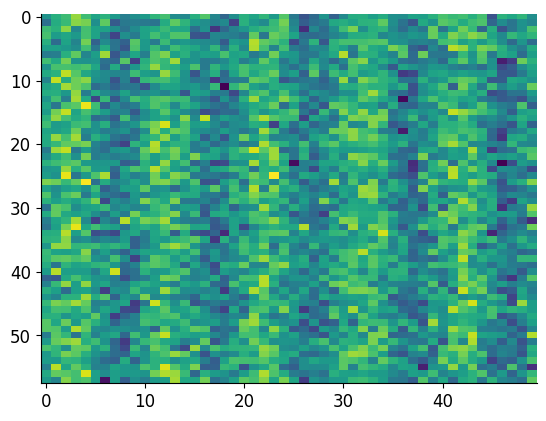

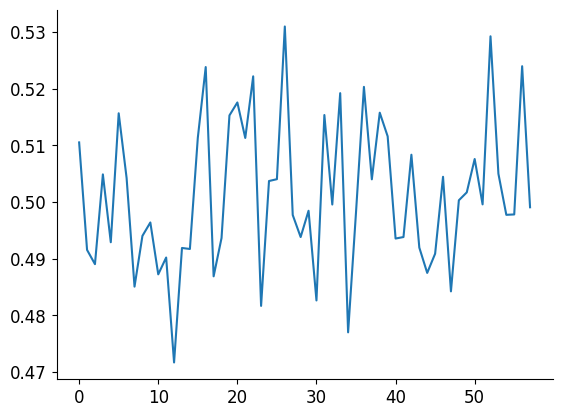

In [15]:
import numpy as np

def make_dendrite_array(n_trials=50, n_bins=50, noise_level=0.2, base_level=0.5):
    """
    Generate a synthetic 2D array of dendritic activity (trials × position bins).

    Parameters
    ----------
    n_trials : int
        Number of trials (rows in the array).
    n_bins : int
        Number of position bins (columns in the array). Default = 50.
    noise_level : float
        Standard deviation of Gaussian noise added to the activity.
    base_level : float
        Baseline activity level around which fluctuations occur.

    Returns
    -------
    dendrite_array : ndarray, shape (n_trials, n_bins)
        Simulated dendritic activity.
    """
    # Base oscillatory pattern over position bins (same for each trial)
    x = np.linspace(0, 2*np.pi, n_bins)
    base_pattern = base_level + 0.1 * np.sin(5 * x)   # wavy baseline

    # Tile this pattern across trials
    dendrite_array = np.tile(base_pattern, (n_trials, 1))

    # Add random trial-to-trial variability
    dendrite_array += np.random.normal(0, noise_level, dendrite_array.shape)

    # Clip values to [0, 1] range (like activity)
    dendrite_array = np.clip(dendrite_array, 0, 1)

    return dendrite_array

# Example usage
arr = make_dendrite_array(n_trials=58, n_bins=50, noise_level=0.1, base_level=0.5)
plt.imshow(arr, aspect='auto')
plt.show()

mean_arr = np.mean(arr, axis=1)
plt.plot(mean_arr)
plt.show()


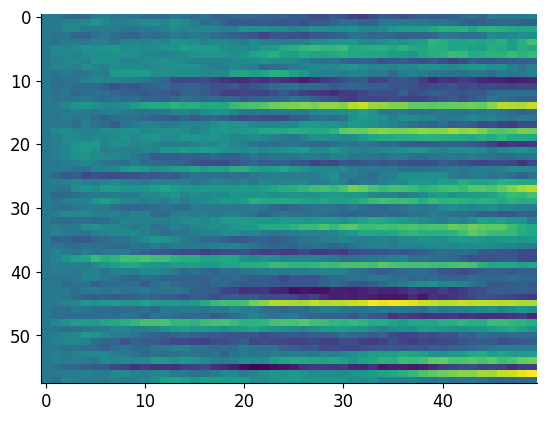

In [10]:
import random
def random_timeseries(initial_value: float, volatility: float, count: int) -> list:
    time_series = [initial_value, ]
    for _ in range(count):
        time_series.append(time_series[-1] + initial_value * random.gauss(0, 1) * volatility)
    return time_series    

ts_list = []
for i in range(58):
    ts = random_timeseries(1.0, 0.005, 49)
    ts_list.append(ts)

dend_contribution_EC = np.array(ts_list).T
plt.imshow(dend_contribution_EC.T, aspect='auto')
plt.show()

In [21]:
pwd

'/Users/michaelfinch/CA1-interneuron-GLM/Clean_notebooks_to_date'

In [27]:
# activity_dict, double_predicted_activity_dict_NDNF_new, filtered_factors_dict, double_new_NDNF_activity_dict, double_new_NDNF_velocity_dict, double_residual_activity_dict_NDNF_new = load_data_double(file_path='/Users/michaelfinch/CA1-interneuron-GLM/', name="NDNFanalC", double_track=False)
# activity_dict, filtered_factors_dict, double_new_NDNF_activity_dict_100, double_new_NDNF_velocity_dict_100, double_residual_activity_dict_NDNF_new_100 = load_data_double(name="NDNFanalC", double_track=True)

# GLM_params, activity_dict, double_predicted_activity_dict_NDNF_new, factors_dict, filtered_factors_dict, residual_activity_dict_NDNF_new = load_data_regular(name="NDNFanalC", new_NDNF=True)
# GLM_params_old_NDNF, activity_dict_old_NDNF, double_predicted_activity_dict_NDNF_old, factors_dict_old_NDNF, filtered_factors_dict_old_NDNF, residual_activity_dict_NDNF_old = load_data_regular(name="NDNFindivsomata_GLM", new_NDNF=False)
GLM_params_SST, activity_dict_SST, double_predicted_activity_dict_SST, factors_dict_SST, filtered_factors_dict_SST, residual_activity_dict_SST = load_data_regular(file_path='/Users/michaelfinch/CA1-interneuron-GLM/', name="SSTindivsomata_GLM", new_NDNF=False)
GLM_params_EC, activity_dict_EC, double_predicted_activity_dict_EC, factors_dict_EC, filtered_factors_dict_EC, residual_activity_dict_EC = load_data_regular(file_path='/Users/michaelfinch/CA1-interneuron-GLM/', name="EC_GLM", new_NDNF=False)


GLM_params_NDNF_newest, activity_dict_NDNF_newest, double_predicted_activity_dict_NDNF_newest, factors_dict_NDNF_newest, filtered_factors_dict_NDNF_newest, residual_activity_dict_NDNF_newest = load_data_regular(file_path='/Users/michaelfinch/CA1-interneuron-GLM/', name="NDNF_E1A1B", new_NDNF=True)

fixed_residual_activity_dict_NDNF_new = {}

for idx, animal in enumerate(residual_activity_dict_NDNF_newest):
    if idx > 8:  # Only include animals with idx > 8
        cell_fixed_residual_activity_dict_NDNF_new = {}
        for cell in residual_activity_dict_NDNF_newest[animal]:
            cell_fixed_residual_activity_dict_NDNF_new[cell] = residual_activity_dict_NDNF_newest[animal][cell]
        fixed_residual_activity_dict_NDNF_new[animal] = cell_fixed_residual_activity_dict_NDNF_new

        
fixed_activity_dict_NDNF = {}

for idx, animal in enumerate(activity_dict_NDNF_newest):
    if idx > 8:  # Only include animals with idx > 8
        cell_fixed_residual_activity_dict_NDNF_new = {}
        for cell in activity_dict_NDNF_newest[animal]:
            cell_fixed_residual_activity_dict_NDNF_new[cell] = activity_dict_NDNF_newest[animal][cell]
        fixed_activity_dict_NDNF[animal] = cell_fixed_residual_activity_dict_NDNF_new


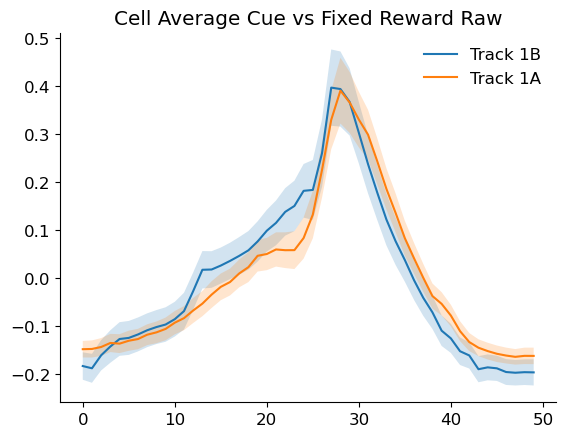

In [3]:

        
        
compare_belts(activity_dict_NDNF_newest)
            
        
    

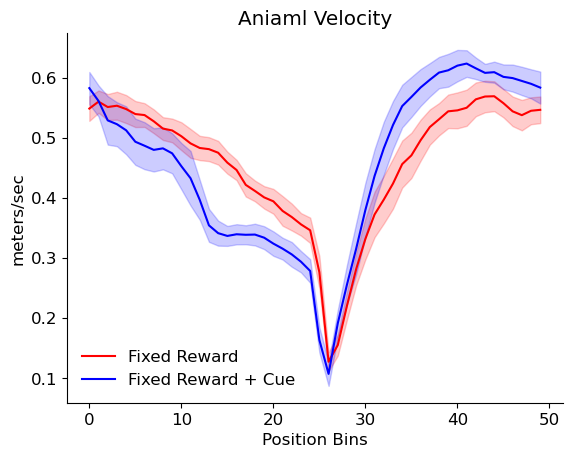

In [4]:


plot_NDNF_velocity(filtered_factors_dict_NDNF_newest)


In [29]:
def loss_fn(params):
    ndnf_sf, sst_sf = params
    summed = EC - (ndnf_sf * NDNF + sst_sf * SST)
    
    # Main loss: how well EC is canceled
    main_loss = np.mean(np.abs(summed))  # or try np.mean(summed**2)

    # Penalty for unequal scale factors
    equal_scaling_penalty = np.abs(ndnf_sf - sst_sf)

    # Total loss = main loss + lambda * penalty
    return main_loss + 50 * equal_scaling_penalty  # adjust 0.1 if needed

def get_dend_VM_cell_type(residual_activity_dict, mean_new_average_vel_array, GLM_params, dend_sf, amplitude=-5, vel=23, norm=False, add_vel_contribution=False, const_vel=True):

    dendrite = np.zeros((50, 58))
    
    dendrite_list = []

    for animal in residual_activity_dict:
        for cell in residual_activity_dict[animal]:
            data = residual_activity_dict[animal][cell]
            data = data[:,:58]

            weights = GLM_params[animal][cell]['weights']["Velocity"]
            intercept = GLM_params[animal][cell]['intercept']

            if const_vel:
                animal_velocity = np.full((50, 58), vel)
                
                data = data + (weights * animal_velocity) + intercept
                
                

            elif add_vel_contribution:
                animal_velocity = np.tile(mean_new_average_vel_array[:, np.newaxis], (1, 58))

                data = data + (weights * animal_velocity) + intercept

            else:
                data = data #+ intercept
                animal_velocity = np.tile(mean_new_average_vel_array[:, np.newaxis], (1, 58))
                
            if norm == "min_max":
                data = normalize(data, norm='min_max', per_cell=False) * 10

            dendrite += data
            dendrite_list.append(data)

    dendrite = dendrite * dend_sf
    
    return dendrite, animal_velocity, dendrite_list


def get_real_velocity_array(filtered_factors_dict_EC):
    new_average_vel = []

    for animal in filtered_factors_dict_EC:
        for cell in filtered_factors_dict_EC[animal]:
            new_average_vel.append(np.mean(filtered_factors_dict_EC[animal][cell], axis=1))

    for animal in filtered_factors_dict_SST:
        for cell in filtered_factors_dict_SST[animal]:
            new_average_vel.append(np.mean(filtered_factors_dict_SST[animal][cell], axis=1))

    for idx, animal in enumerate(filtered_factors_dict):
        if idx > 8:
            for cell in filtered_factors_dict[animal]:
                new_average_vel.append(np.mean(filtered_factors_dict[animal][cell], axis=1))


    new_average_vel_array = np.array(new_average_vel)
    mean_new_average_vel_array = np.mean(new_average_vel_array, axis=0)
    
    return mean_new_average_vel_array


mean_new_average_vel_array = get_real_velocity_array(filtered_factors_dict_EC)

Optimal NDNF_sf: 3.964395035717997
Optimal SST_sf: 3.9643950336931955


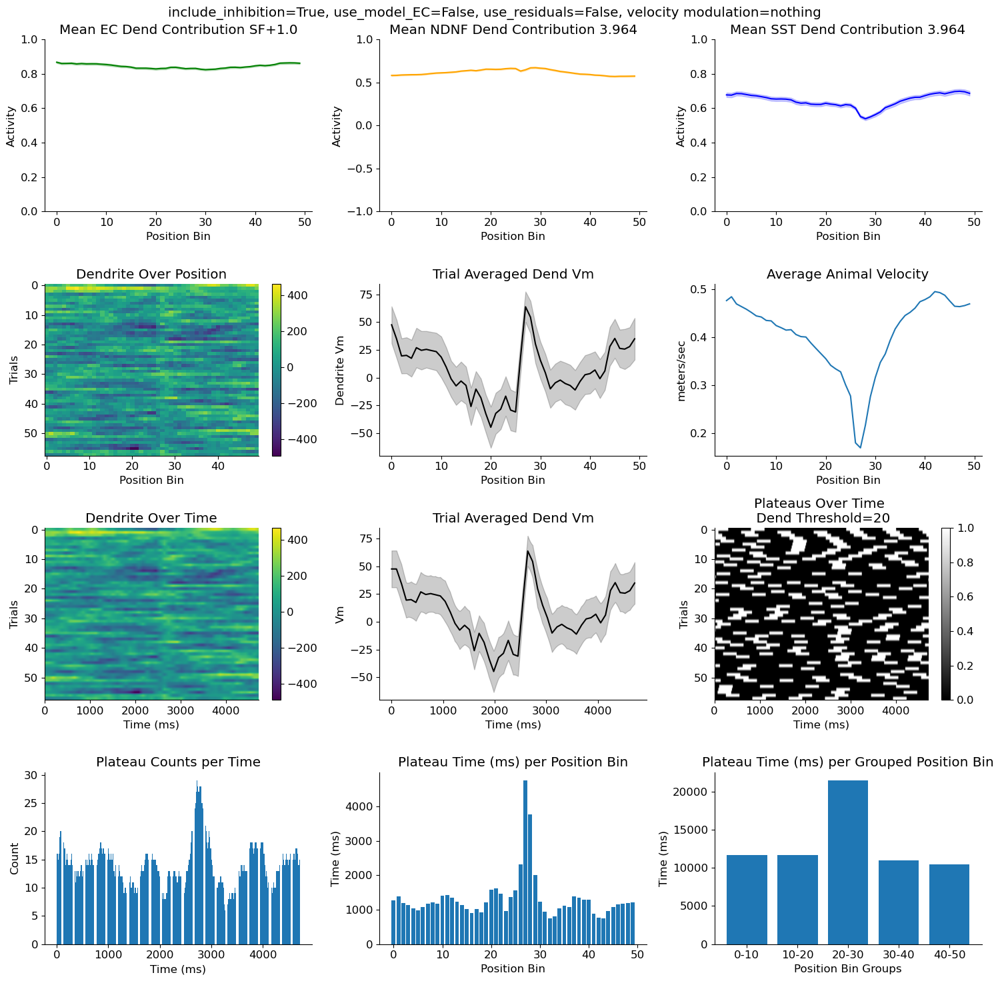

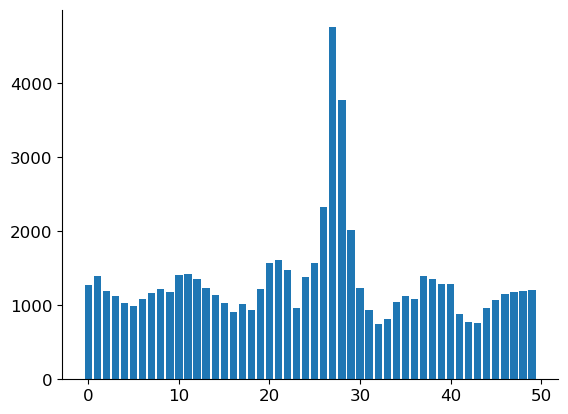

In [8]:
from scipy.optimize import minimize
# Optimal NDNF_sf: 3.9426020962469455
# Optimal SST_sf: 3.942602096880944

include_inhibition=True

use_model_EC = False

use_residuals= True

#real, nothing or constant
vel_applied = "nothing"

dx = 180/50
    
dend_threshold=20



if vel_applied=="real":

    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

elif vel_applied=="constant":
    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)
        
    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

elif vel_applied=="nothing":
    
    an_velocity = np.zeros((50,53))
    
    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)
        
    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)


        
if use_model_EC:

    dend_contribution_EC = np.zeros((summed_dendrite.shape))

    for i in range(dend_contribution_EC.shape[1]):
        for j in range(dend_contribution_EC.shape[0]):
            if j % 2 == 0:
                dend_contribution_EC[j, i] = 1

    print(dend_contribution_EC[:,0])

# NDNF_sf_opt = 3.7960282919084
# SST_sf_opt = 4.108490240597229
    
if include_inhibition:
    summed_dendrite = dend_contribution_EC - (dend_contribution_NDNF*NDNF_sf_opt + dend_contribution_SST*SST_sf_opt)
#     summed_dendrite = dend_contribution_EC - (SST_sf_opt * dend_contribution_SST*2)

else:
    summed_dendrite = dend_contribution_EC

fig, axs = plt.subplots(4, 3, figsize=(15, 15))  
plt.suptitle(f"include_inhibition={include_inhibition}, use_model_EC={use_model_EC}, use_residuals=False, velocity modulation={vel_applied}")
    
im11 = axs[1,0].imshow(summed_dendrite.T, aspect='auto')
axs[1,0].set_title("Dendrite Over Position")
axs[1,0].set_xlabel("Position Bin")
axs[1,0].set_ylabel("Trials")
fig.colorbar(im11, ax=axs[1,0])
    
if include_inhibition: 
    axs[1,2].plot(an_velocity[:,0])
    axs[1,2].set_title("Average Animal Velocity")
    axs[1,2].set_ylabel("meters/sec")
    axs[1,2].set_xlabel("Position Bin")
    
else:
    axs[0,1].plot(an_velocity[:,0])
    axs[0,1].set_title("Average Animal Velocity")
    axs[0,1].set_ylabel("meters/sec")
    axs[0,1].set_xlabel("Position Bin")




mean_dendrite = np.mean(summed_dendrite, axis=1)
sem_dendrite = sem(summed_dendrite, axis=1)

axs[1,1].plot(mean_dendrite, color='k')
axs[1,1].fill_between(range(len(mean_dendrite)), mean_dendrite+sem_dendrite, mean_dendrite-sem_dendrite, alpha=0.2, color='k')
axs[1,1].set_title("Trial Averaged Dend Vm")
axs[1,1].set_xlabel("Position Bin")
axs[1,1].set_ylabel("Dendrite Vm")




EC_normalized = dend_contribution_EC/ np.max(dend_contribution_EC)

mean_EC_dend = np.mean(EC_normalized, axis=1)
sem_EC_dend = sem(EC_normalized, axis=1)
axs[0,0].plot(mean_EC_dend, color='g', label="EC Vel")
axs[0,0].fill_between(range(len(mean_EC_dend)), mean_EC_dend+sem_EC_dend, mean_EC_dend-sem_EC_dend, alpha=0.2, color='g')
axs[0,0].set_title(f"Mean EC Dend Contribution SF+{1.0}")
axs[0,0].set_xlabel("Position Bin")
axs[0,0].set_ylabel("Activity")
axs[0,0].set_ylim(0,1)

if include_inhibition:
    
    SST_normalized = dend_contribution_SST/ np.max(dend_contribution_SST)

    mean_SST_dend = np.mean(SST_normalized, axis=1)
    sem_SST_dend = sem(SST_normalized, axis=1)
    axs[0,2].plot(mean_SST_dend, color='b', label="SST Vel")
    axs[0,2].fill_between(range(len(mean_SST_dend)), mean_SST_dend+sem_SST_dend, mean_SST_dend-sem_SST_dend, alpha=0.2, color='b')
    axs[0,2].set_title(f"Mean SST Dend Contribution {SST_sf_opt:.3f}")
    axs[0,2].set_xlabel("Position Bin")
    axs[0,2].set_ylabel("Activity")
    axs[0,2].set_ylim(0,1)
    
    NDNF_normalized = dend_contribution_NDNF/ np.max(dend_contribution_NDNF)

    mean_NDNF_dend = np.mean(NDNF_normalized, axis=1)
    sem_NDNF_dend = sem(NDNF_normalized, axis=1)
    axs[0,1].plot(mean_NDNF_dend, color='orange', label="NDNF Vel")
#     axs[0,1].plot(np.zeros(50), color='orange', label="NDNF Vel")
    axs[0,1].fill_between(range(len(mean_NDNF_dend)), mean_NDNF_dend+sem_NDNF_dend, mean_NDNF_dend-sem_NDNF_dend, alpha=0.2, color='orange')
    axs[0,1].set_title(f"Mean NDNF Dend Contribution {NDNF_sf_opt:.3f}")
    axs[0,1].set_xlabel("Position Bin")
    axs[0,1].set_ylabel("Activity")
    axs[0,1].set_ylim(-1,1)



animal_velocity_constant = np.full((summed_dendrite.shape), 23)
total_time_sec = 4.71657036 

dt=total_time_sec/50
dx=180/50

animal_velocity_constant= np.full((summed_dendrite.shape), dx/dt)

dt_constant = 0.001
dt = dx / animal_velocity_constant
time_bins = np.cumsum(dt, axis=0)
time_bins_ms = time_bins * 1

num_trials = summed_dendrite.shape[1]
trial_warped_activity = []
max_len = 0

for t in range(num_trials):
    if np.any(np.isnan(time_bins[:, t])):
        continue
    total_time = time_bins[-1, t]

    time_axis_constant = np.arange(0, total_time, dt_constant)
    
    firing = summed_dendrite[:, t]

    warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

    trial_warped_activity.append(warped_firing)
    if len(warped_firing) > max_len:
        max_len = len(warped_firing)
            
padded_warped_activity = np.full((num_trials, max_len), np.nan) 
for i, trace in enumerate(trial_warped_activity):
    padded_warped_activity[i, :len(trace)] = trace

    
    
mean_dend_time = np.mean(padded_warped_activity, axis=0)
sem_dend_time = sem(padded_warped_activity, axis=0)


x_start = 0
time_bin_size_ms=1
num_bins = len(mean_dend_time)
x_end = num_bins * time_bin_size_ms 
im = axs[2,0].imshow(padded_warped_activity, aspect='auto')
axs[2,0].set_title("Dendrite Over Time")
axs[2,0].set_xlabel("Time (ms)")
axs[2,0].set_ylabel("Trials")
fig.colorbar(im, ax=axs[2,0])



# time_bin_size_ms = 100

time_bin_size_ms = 1

num_bins = len(mean_dend_time)
x_time_ms = np.arange(num_bins) * time_bin_size_ms  # x-axis in ms

axs[2,1].plot(x_time_ms, mean_dend_time, color='k')
axs[2,1].fill_between(x_time_ms, mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, color='k', alpha=0.2)
axs[2,1].set_title("Trial Averaged Dend Vm")
axs[2,1].set_xlabel("Time (ms)")
axs[2,1].set_ylabel("Vm")


position_bins, num_trials = animal_velocity_constant.shape


flat_padded_warped_activity = padded_warped_activity.flatten()
flat_plateau_array = np.zeros_like(flat_padded_warped_activity)

i = 0
while i < len(flat_padded_warped_activity):
    if flat_padded_warped_activity[i] > dend_threshold:
        flat_plateau_array[i:i+300] = 1
        
        i += 800
    else:
        i += 100


plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)

im2 = axs[2,2].imshow(plateau_array, aspect='auto', interpolation=None, cmap="gray")
axs[2,2].set_title(f"Plateaus Over Time \n Dend Threshold={dend_threshold}")
axs[2,2].set_xlabel("Time (ms)")
axs[2,2].set_ylabel("Trials")
fig.colorbar(im2, ax=axs[2,2])

plateau_counts_per_time = np.sum(plateau_array, axis=0)
axs[3,0].bar(range(len(plateau_counts_per_time)), plateau_counts_per_time)
axs[3,0].set_xlabel("Time (ms)")
axs[3,0].set_ylabel("Count")
axs[3,0].set_title("Plateau Counts per Time")


num_time_bins = padded_warped_activity.shape[1]

plateau_positions_counter = np.zeros(50)

time_in_bin_counter = np.zeros(50)

animal_velocity = an_velocity * 100

if vel_applied=="nothing":
    animal_velocity= mean_new_average_vel_array[:, None] * np.ones((1, summed_dendrite.shape[1])) *100
    

for trial in range(plateau_array.shape[0]):
    
    velocity_trial = animal_velocity[:, trial]  
    
  
    dt_trial = dx / velocity_trial  # in seconds
    time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])
    
    time_bins = np.arange(num_time_bins) * dt_constant  

    for t_idx, time_bin in enumerate(time_bins):
        if plateau_array[trial, t_idx] == 1:
            for pos_idx in range(50):
                if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                    plateau_positions_counter[pos_idx] += 1
                    break

     
    for t_idx, time_bin in enumerate(time_bins):
        for pos_idx in range(50):
            if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                time_in_bin_counter[pos_idx] += 1
                break
                            

axs[3,1].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
axs[3,1].set_title("Plateau Time (ms) per Position Bin")
axs[3,1].set_ylabel("Time (ms)")
axs[3,1].set_xlabel("Position Bin")

bin_size = 10
grouped_counts = [np.sum(plateau_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_positions_counter), bin_size)]

axs[3,2].bar(range(len(grouped_counts)), grouped_counts)
axs[3,2].set_xticks(np.arange(5), ["0-10", "10-20", "20-30", "30-40", "40-50"])
axs[3,2].set_xlabel(f"Position Bin Groups")
axs[3,2].set_ylabel("Time (ms)")
axs[3,2].set_title("Plateau Time (ms) per Grouped Position Bin")


plt.tight_layout()
plt.show()

plt.bar(range(len(plateau_positions_counter)), plateau_positions_counter)
plt.show()

In [38]:
###################################good ###############################





from scipy.optimize import minimize
import random
# Optimal NDNF_sf: 3.9426020962469455
# Optimal SST_sf: 3.942602096880944


def random_timeseries(initial_value: float, volatility: float, count: int) -> list:
    time_series = []
    for _ in range(count+1):
        initial_value += random.gauss(0, 1) * volatility
        time_series.append(initial_value)
    return time_series

def get_dend_contribution_single_dend(residual_activity_dict_EC, activity_dict_EC, fixed_residual_activity_dict_NDNF_new, fixed_activity_dict_NDNF, residual_activity_dict_SST, activity_dict_SST, mean_new_average_vel_array, GLM_params_EC, GLM_params, GLM_params_SST, vel_applied="constant", use_residuals=True):

    if vel_applied=="real":

        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

    elif vel_applied=="constant":
        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

    elif vel_applied=="nothing":

        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)
            
    return dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt
        

def setup_single_dendrite(dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt, use_model_EC=False, include_inhibition=False, use_residuals=False, dend_threshold=0.75):
        
    if use_model_EC:
     

        ts_list = []
        for i in range(58):
            ts = random_timeseries(1.0, 0.005, 49)
            ts_list.append(ts)

        dend_contribution_EC = np.array(ts_list).T
        print(dend_contribution_EC.shape)
        

        pos_bins = 50
        trials = 58
        dend_contribution_EC = np.zeros((pos_bins, trials))

        # Fixed Gaussian centers
        base_centers = np.arange(2, pos_bins, 5)  # bin 2, 7, 12, ..., 47
        width = 2.0

        for i in range(trials):
            for center in base_centers:
                # Add jitter to the center (±1 bin)
                jittered_center = center + np.random.choice([-1, 0, 1])

                # Make sure jittered center stays within bounds
                jittered_center = np.clip(jittered_center, 0, pos_bins - 1)

                amplitude = np.random.uniform(0.8, 1.2)  # still jitter amplitude too
                gaussian = norm.pdf(np.arange(pos_bins), loc=jittered_center, scale=width)
                gaussian /= np.max(gaussian)
                dend_contribution_EC[:, i] += amplitude * gaussian

        # Normalize globally if needed
        dend_contribution_EC /= np.max(dend_contribution_EC)


    # NDNF_sf_opt = 3.7960282919084
    # SST_sf_opt = 4.108490240597229

    if include_inhibition:
        summed_dendrite = dend_contribution_EC - (dend_contribution_NDNF*NDNF_sf_opt + dend_contribution_SST*SST_sf_opt)
    #     summed_dendrite = dend_contribution_EC - (SST_sf_opt * dend_contribution_SST*2)

    else:
        summed_dendrite = dend_contribution_EC



#     animal_velocity_constant = np.full((summed_dendrite.shape), 23)
    total_time_sec = 4.71657036 

    dt=total_time_sec/50
    dx=180/50

#     animal_velocity_constant= np.full((summed_dendrite.shape), dx/dt)

    print(np.mean(an_velocity))



    dt_constant = 0.001
    # dt = dx / animal_velocity_constant
    dt = dx / (an_velocity*100)

    # if vel_applied == "nothing":
    #     dt = dx / animal_velocity_constant
    time_bins = np.cumsum(dt, axis=0)
    time_bins_ms = time_bins * 1

    num_trials = summed_dendrite.shape[1]
    trial_warped_activity = []
    max_len = 0

    for t in range(num_trials):
        if np.any(np.isnan(time_bins[:, t])):
            continue
        total_time = time_bins[-1, t]

        time_axis_constant = np.arange(0, total_time, dt_constant)

        firing = summed_dendrite[:, t]
        
        warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

        trial_warped_activity.append(warped_firing)
        if len(warped_firing) > max_len:
            max_len = len(warped_firing)

    padded_warped_activity = np.full((num_trials, max_len), np.nan) 
    for i, trace in enumerate(trial_warped_activity):
        padded_warped_activity[i, :len(trace)] = trace

    time_bin_size_ms = 1

    num_bins = len(mean_dend_time)
    x_time_ms = np.arange(num_bins) * time_bin_size_ms  # x-axis in ms


    position_bins, num_trials = an_velocity.shape


    flat_padded_warped_activity = padded_warped_activity.flatten()
    flat_plateau_array = np.zeros_like(flat_padded_warped_activity)

    i = 0
    while i < len(flat_padded_warped_activity):
        if flat_padded_warped_activity[i] > dend_threshold:
            flat_plateau_array[i:i+300] = 1

            i += 800
        else:
            i += 100


    plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)

    num_time_bins = padded_warped_activity.shape[1]

    plateau_positions_counter = np.zeros(50)

    time_in_bin_counter = np.zeros(50)

    animal_velocity = an_velocity * 100

    if vel_applied=="nothing":
        animal_velocity= mean_new_average_vel_array[:, None] * np.ones((1, summed_dendrite.shape[1])) *100

    

    plateau_start_positions_counter = np.zeros(50)  
    
    plateau_start_times_list = []

    for trial in range(plateau_array.shape[0]):
        velocity_trial = animal_velocity[:, trial]
        #         velocity_trial = proper_velocity
        dt_trial = dx / velocity_trial  # in seconds
        time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

        plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]
        plateau_start_times = plateau_start_indices * dt_constant  # in seconds
        plateau_start_times_list.append(plateau_start_times)

        for pt_start_time in plateau_start_times:
            if pt_start_time != 0.0:
                for pos_idx in range(50):
                    if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                        plateau_start_positions_counter[pos_idx] += 1
                        break


    

    for trial in range(plateau_array.shape[0]):

        velocity_trial = animal_velocity[:, trial]  


        dt_trial = dx / velocity_trial  # in seconds

    #     print(f"np.cumsum(dt_trial) {np.cumsum(dt_trial)}")

        time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

        time_binss = np.arange(num_time_bins) * dt_constant  

        for t_idx, time_bin in enumerate(time_binss):
            if plateau_array[trial, t_idx] == 1:
                for pos_idx in range(50):
                    if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                        plateau_positions_counter[pos_idx] += 1
                        break


        for t_idx, time_bin in enumerate(time_binss):
            for pos_idx in range(50):
                if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                    time_in_bin_counter[pos_idx] += 1
                    break



    return summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, plateau_start_times_list, time_each_pos_bin_starts, x_time_ms



def plot_single_dend(dend_contribution_EC, dend_contribution_SST, dend_contribution_NDNF, summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, x_time_ms, plateau_start_times_list):

    fig, axs = plt.subplots(5, 3, figsize=(15, 15))  
#     plt.suptitle(f"include_inhibition={include_inhibition}, use_model_EC={use_model_EC}, use_residuals={use_residuals}, velocity modulation={vel_applied}")


    EC_normalized = dend_contribution_EC/ np.max(dend_contribution_EC)

    mean_EC_dend = np.mean(EC_normalized, axis=1)
    sem_EC_dend = sem(EC_normalized, axis=1)
    axs[0,0].plot(mean_EC_dend, color='g', label="EC Vel")
    axs[0,0].fill_between(range(len(mean_EC_dend)), mean_EC_dend+sem_EC_dend, mean_EC_dend-sem_EC_dend, alpha=0.2, color='g')
    axs[0,0].set_title(f"Mean EC Dend Contribution SF+{1.0}")
    axs[0,0].set_xlabel("Position Bin")
    axs[0,0].set_ylabel("Activity")
    axs[0,0].set_ylim(0,1)

    if include_inhibition:

        SST_normalized = dend_contribution_SST/ np.max(dend_contribution_SST)

        mean_SST_dend = np.mean(SST_normalized, axis=1)
        sem_SST_dend = sem(SST_normalized, axis=1)
        axs[0,2].plot(mean_SST_dend, color='b', label="SST Vel")
        axs[0,2].fill_between(range(len(mean_SST_dend)), mean_SST_dend+sem_SST_dend, mean_SST_dend-sem_SST_dend, alpha=0.2, color='b')
        axs[0,2].set_title(f"Mean SST Dend Contribution {SST_sf_opt:.3f}")
        axs[0,2].set_xlabel("Position Bin")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_ylim(0,1)

        NDNF_normalized = dend_contribution_NDNF/ np.max(dend_contribution_NDNF)

        mean_NDNF_dend = np.mean(NDNF_normalized, axis=1)
        sem_NDNF_dend = sem(NDNF_normalized, axis=1)
        axs[0,1].plot(mean_NDNF_dend, color='orange', label="NDNF Vel")
    #     axs[0,1].plot(np.zeros(50), color='orange', label="NDNF Vel")
        axs[0,1].fill_between(range(len(mean_NDNF_dend)), mean_NDNF_dend+sem_NDNF_dend, mean_NDNF_dend-sem_NDNF_dend, alpha=0.2, color='orange')
        axs[0,1].set_title(f"Mean NDNF Dend Contribution {NDNF_sf_opt:.3f}")
        axs[0,1].set_xlabel("Position Bin")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_ylim(0,1)   



    im11 = axs[1,0].imshow(summed_dendrite.T, aspect='auto')
    axs[1,0].set_title("Dendrite Over Position")
    axs[1,0].set_xlabel("Position Bin")
    axs[1,0].set_ylabel("Trials")
    fig.colorbar(im11, ax=axs[1,0])

    if include_inhibition: 
        axs[1,2].plot(an_velocity[:,0])
        axs[1,2].set_title("Average Animal Velocity")
        axs[1,2].set_ylabel("meters/sec")
        axs[1,2].set_xlabel("Position Bin")

    else:
        axs[0,1].plot(an_velocity[:,0])
        axs[0,1].set_title("Average Animal Velocity")
        axs[0,1].set_ylabel("meters/sec")
        axs[0,1].set_xlabel("Position Bin")




    mean_dendrite = np.mean(summed_dendrite, axis=1)
    sem_dendrite = sem(summed_dendrite, axis=1)

    axs[1,1].plot(mean_dendrite, color='k')
    axs[1,1].fill_between(range(len(mean_dendrite)), mean_dendrite+sem_dendrite, mean_dendrite-sem_dendrite, alpha=0.2, color='k')
    axs[1,1].set_title("Trial Averaged Dend Vm")
    axs[1,1].set_xlabel("Position Bin")
    axs[1,1].set_ylabel("Dendrite Vm")


    x_start = 0
    time_bin_size_ms=1
    num_bins = len(mean_dend_time)
    x_end = num_bins * time_bin_size_ms 
    im = axs[2,0].imshow(padded_warped_activity, aspect='auto')
    axs[2,0].set_title("Dendrite Over Time")
    axs[2,0].set_xlabel("Time (ms)")
    axs[2,0].set_ylabel("Trials")
    fig.colorbar(im, ax=axs[2,0])
    
    
    mean_dend_time = np.mean(padded_warped_activity, axis=0)
    sem_dend_time = sem(padded_warped_activity, axis=0)

    axs[2,1].plot(x_time_ms, mean_dend_time, color='k')
    axs[2,1].fill_between(x_time_ms, mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, color='k', alpha=0.2)
    axs[2,1].set_title("Trial Averaged Dend Vm")
    axs[2,1].set_xlabel("Time (ms)")
    axs[2,1].set_ylabel("Vm")

    im2 = axs[2,2].imshow(plateau_array, aspect='auto', interpolation=None, cmap="gray")
    axs[2,2].set_title(f"Plateaus Over Time \n Dend Threshold={dend_threshold}")
    axs[2,2].set_xlabel("Time (ms)")
    axs[2,2].set_ylabel("Trials")
    fig.colorbar(im2, ax=axs[2,2])


    sum_plateaus = np.nansum(plateau_array, axis=0)
    axs[3,2].bar(range(len(sum_plateaus)),sum_plateaus)
    axs[3,2].set_xlim(0, plateau_array.shape[1])  # full time range
    axs[3,2].set_xlabel("Time (ms)")
    axs[3,2].set_ylabel("Count")
    axs[3,2].set_title("Plateau Counts per Time")

    axs[3,0].bar(range(len(plateau_start_positions_counter)), plateau_start_positions_counter)
    axs[3,0].set_xlabel("Position Bins")
    axs[3,0].set_ylabel("Plateau Count")
    axs[3,0].set_title("Plateau Count per Position Bin")

    bin_size = 5
    grouped_counts = [np.sum(plateau_start_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_start_positions_counter), bin_size)]

    axs[4,0].bar(range(len(grouped_counts)), grouped_counts)
    axs[4,0].set_xticks(np.arange(10), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"])
    axs[4,0].set_xlabel(f"Position Bin Groups")
    axs[4,0].set_ylabel("Plateau Count")
    axs[4,0].set_title("Plateau Count per Grouped Position Bin")


    axs[3,1].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
    axs[3,1].set_title("Plateau Time (ms) per Position Bin")
    axs[3,1].set_ylabel("Time (ms)")
    axs[3,1].set_xlabel("Position Bin")

    bin_size = 5
    grouped_counts = [np.sum(plateau_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_positions_counter), bin_size)]

    axs[4,1].bar(range(len(grouped_counts)), grouped_counts)
    axs[4,1].set_xticks(np.arange(10), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"])
    axs[4,1].set_xlabel(f"Position Bin Groups")
    axs[4,1].set_ylabel("Time (ms)")
    axs[4,1].set_title("Plateau Time (ms) per Grouped Position Bin")


    plt.tight_layout()
    plt.show()
    
    final_bin = time_each_position_bin_starts[-1] *1000
    timecourse = np.zeros(int(final_bin))
    timecourse_bins = np.zeros(int(final_bin))

    plateau_start_times_list_cleaned = []
    for trial in range(len(plateau_start_times_list)):
        if np.any(plateau_start_times_list[trial]!=0):
            for i in plateau_start_times_list[trial]:
                plateau_start_times_list_cleaned.append(int(i*1000))


    for plateau in plateau_start_times_list_cleaned:
        timecourse[plateau] = 1

    # for bins in time_each_position_bin_starts:
    #     if bins < time_each_position_bin_starts[-1]:
    #         bins_scaled = int(bins*1000)
    #         timecourse_bins[bins_scaled] = 2

    plt.figure(figsize=(12,3))

    # Plot dashed vertical red lines at bin starts
    for bins in time_each_position_bin_starts:
        bins_scaled = int(bins * 1000)
        plt.vlines(bins_scaled, ymin=0, ymax=2, color='r', linestyle='--', alpha=0.6)
    plt.plot(timecourse, alpha=0.6)
    plt.title("Red=Position Bin in Time, Blue=Plateau Time")
    plt.show()


    
# trial_unwarped_activity = [] 
    
# for t in range(num_trials):
#     if np.any(np.isnan(time_bins[:, t])):
#         continue
#     total_time = time_bins[-1, t]

#     time_axis_constant = np.arange(0, total_time, dt_constant)
    
#     warped_firing = padded_warped_activity[t,:]

#     unwarped_firing = np.interp(time_bins_ms[:,t], time_axis_constant, warped_firing)

#     trial_unwarped_activity.append(unwarped_firing)
#     if len(unwarped_firing) > max_len:
#         max_len = len(unwarped_firing)
            
# padded_unwarped_activity = np.full((num_trials, max_len), np.nan) 
# for i, trace in enumerate(trial_unwarped_activity):
#     padded_unwarped_activity[i, :len(trace)] = trace

    
            

# mean_dend_time = np.mean(padded_unwarped_activity, axis=0)
# sem_dend_time = sem(padded_unwarped_activity, axis=0)
# plt.plot(mean_dend_time)
# plt.fill_between(range(len(mean_dend_time)), mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, alpha=0.2)
# plt.show()

In [37]:
dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt = get_dend_contribution_single_dend(residual_activity_dict_EC, activity_dict_EC, fixed_residual_activity_dict_NDNF_new, fixed_activity_dict_NDNF, residual_activity_dict_SST, activity_dict_SST, mean_new_average_vel_array, GLM_params_EC, GLM_params_NDNF_newest, GLM_params_SST, vel_applied="real", use_residuals=True)

summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, plateau_start_times_list, time_each_position_bin_starts, x_time_ms = setup_single_dendrite(dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt, use_model_EC=True, include_inhibition=False, use_residuals=False, dend_threshold=1)
        
plot_single_dend(dend_contribution_EC, dend_contribution_SST, dend_contribution_NDNF, summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, x_time_ms, plateau_start_times_list)


NameError: name 'EC' is not defined

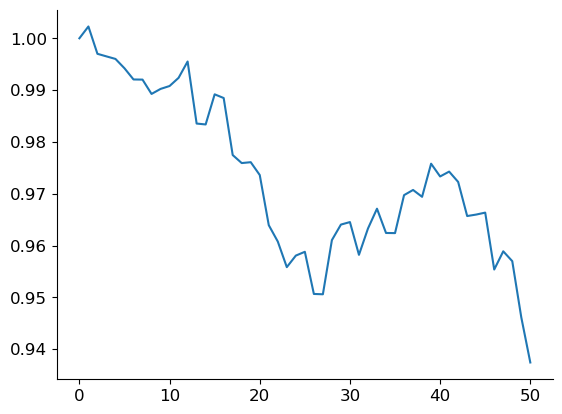

In [11]:
def random_timeseries(initial_value: float, volatility: float, count: int) -> list:
    time_series = [initial_value, ]
    for _ in range(count):
        time_series.append(time_series[-1] + initial_value * random.gauss(0, 1) * volatility)
    return time_series

# ts_list = []
# for i in range(50):
#     ts = random_timeseries(1.0, 0.005, 50)
#     ts_list.append(ts)
    
# ts_array = np.array(ts_list)

# plt.imshow(ts_array, aspect='auto')
# plt.colorbar()
# plt.show()


ts = random_timeseries(1.0, 0.005, 50)
plt.plot(ts)

EC_input_matrix (792, 50, 58)
EC_input_matrix.shape (792, 50, 58)
NDNF_sf_opt: 0.21000760953605563
SST_sf_opt: 0.21000760928714646
means 0.9998622113480128 mean_dend_activity 79.98703377198783
variance_array.shape (100,)


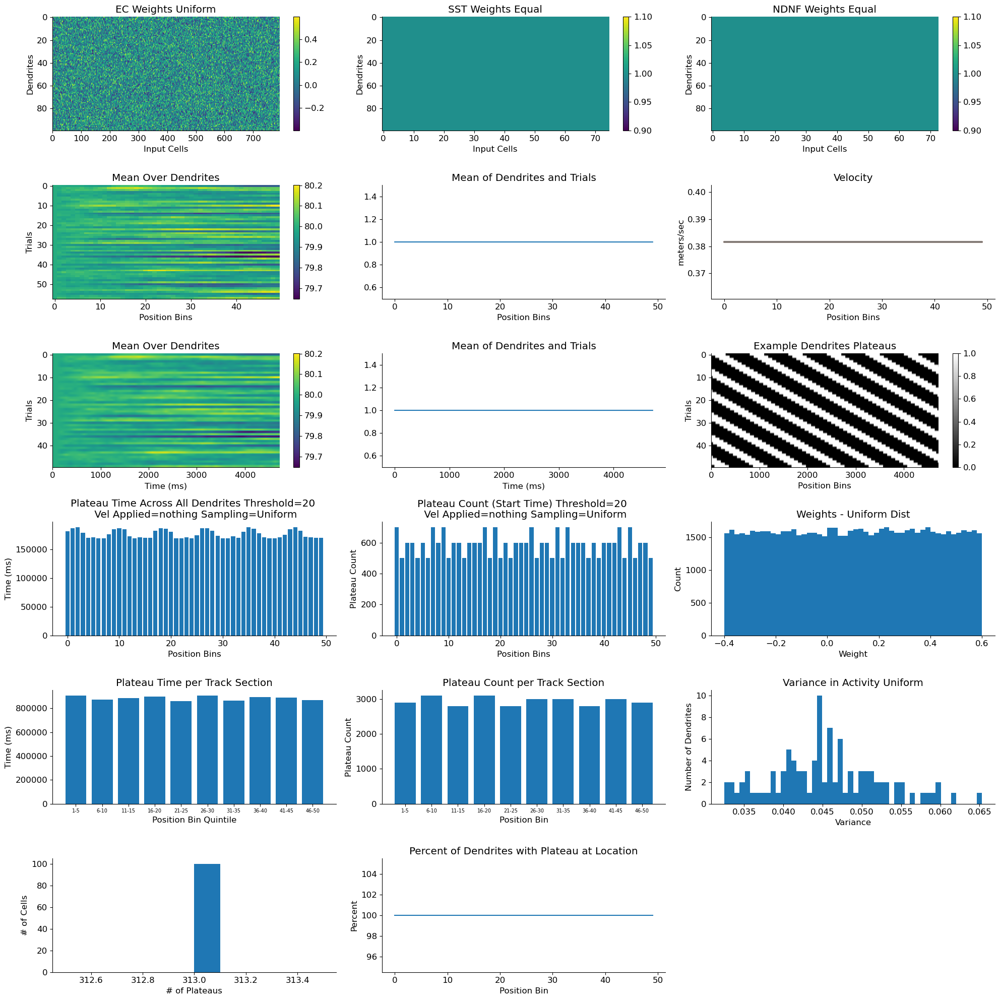

first bin 0.0
final_bin 4716.570359290522
plateau_start_times_list_cleaned 4701


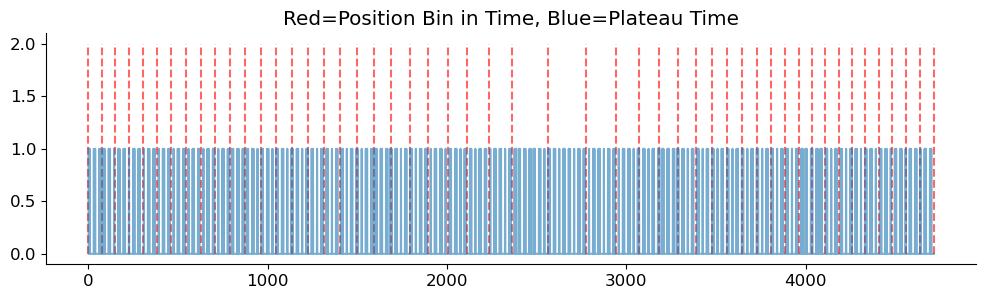

NameError: name 'activity_EC' is not defined

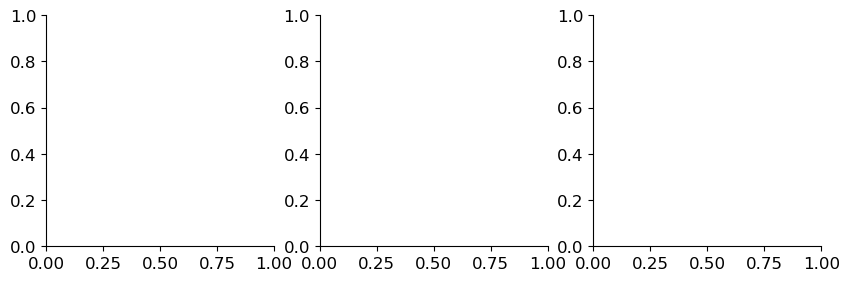

In [31]:


def sample_equal_weights(mask, value=1.0):
    weights = np.zeros_like(mask, dtype=float)
    weights[mask] = value
    return weights

def sample_weights(distribution, mask, rng, mean=0.1, std=0.5):
    weights = np.zeros_like(mask, dtype=float)
    n_samples = np.sum(mask)

    if distribution == "Uniform":
        samples = rng.uniform(low=mean - std, high=mean + std, size=n_samples)
    elif distribution == "Normal":
        samples = rng.normal(loc=mean, scale=std, size=n_samples)
        samples = np.clip(samples, 0, None)
    elif distribution == "Lognormal":
        samples = rng.lognormal(mean=np.log(mean), sigma=std, size=n_samples)
    else:
        raise ValueError("Invalid distribution")

    weights[mask] = samples
    return weights


def get_dendrite_activity(weights, EC_input_matrix, n_dendrites, n_EC):
    EC_flat = EC_input_matrix.reshape(n_EC, -1)
    dendrite_flat = weights @ EC_flat
    return dendrite_flat.reshape(n_dendrites, 50, 58)

    
def loss_fn_multi(params, activity_EC, activity_SST, activity_NDNF):
    ndnf_sf, sst_sf = params
    summed = activity_EC - (sst_sf * activity_SST + ndnf_sf * activity_NDNF)
    
    summed_mean = np.mean(summed, axis=0)
    summed_means = np.mean(summed_mean, axis=1)
    summed_overall_means = np.mean(summed_means)
    
    main_loss = (summed_overall_means ** 2)  # This penalizes all deviations from 0

    return main_loss #+ 0.1 * equal_scaling_penalty
    



def get_activity_multidendrite(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, dend_threshold=20, vel_applied="real", example_cell=15, dist="Uniform", n_dendrites=100, n_SST=75, n_EC=792, n_NDNF=73, include_inhibition=True, use_model_EC=False):

    SEED = 42
    np.random.seed(SEED)
    random.seed(SEED)
    rng = np.random.default_rng(SEED)
    
    if vel_applied=="real":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        print(f"dend_contribution_EC.shape {dend_contribution_EC.shape}")
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        velocity_to_return = an_velocity.copy()
        
    elif vel_applied=="constant":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        velocity_to_return = an_velocity.copy()
        
    elif vel_applied=="nothing":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        velocity_to_return = an_velocity.copy()
    
    
    EC_input_matrix = np.stack(EC_pop_list[:n_EC], axis=0)
    print(f"EC_input_matrix {EC_input_matrix.shape}")
    SST_input_matrix = np.stack(SST_pop_list[:n_SST], axis=0)
    NDNF_input_matrix = np.stack(NDNF_pop_list[:n_NDNF], axis=0)

    
    if use_model_EC:
        
        dend_list = []
        for j in range(792):
            ts_list = []
            for i in range(58):
                ts = random_timeseries(1.0, 0.005, 49)
                ts_list.append(ts)

            dend_contribution_EC = np.array(ts_list).T
            dend_list.append(dend_contribution_EC)
            
        EC_input_matrix = np.array(dend_list)
        print(f"EC_input_matrix.shape {EC_input_matrix.shape}")


    connection_mask_EC = np.ones((n_dendrites, n_EC), dtype=bool)
    connection_mask_SST = np.ones((n_dendrites, n_SST), dtype=bool)
    connection_mask_NDNF = np.ones((n_dendrites, n_NDNF), dtype=bool)

    weights_EC = sample_weights(dist, connection_mask_EC, rng=rng)
    weights_SST = sample_equal_weights(connection_mask_SST, 1.0)
    weights_NDNF = sample_equal_weights(connection_mask_NDNF, 1.0)


    activity_EC = get_dendrite_activity(weights_EC, EC_input_matrix, n_dendrites, n_EC)
    activity_SST = get_dendrite_activity(weights_SST, SST_input_matrix, n_dendrites, n_SST)
    activity_NDNF = get_dendrite_activity(weights_NDNF, NDNF_input_matrix, n_dendrites, n_NDNF)

    result = minimize(loss_fn_multi, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)], args=(activity_EC, activity_SST, activity_NDNF))
    NDNF_sf_opt, SST_sf_opt = result.x

    print(f"NDNF_sf_opt: {NDNF_sf_opt}")
    print(f"SST_sf_opt: {SST_sf_opt}")
    
    if include_inhibition:
        dend_activity = activity_EC - (activity_SST*SST_sf_opt + activity_NDNF*NDNF_sf_opt)
    else:
        dend_activity = activity_EC 
        


    plateau_positions_counter = np.zeros(50)
    plateau_start_positions_counter = np.zeros(50)

    threshold_list = []

    variance_list = []

    plateau_array_per_dendrite_list = []

    num_plateaus_per_dend_list = []

    dendrite_plateau_mask = np.zeros((dend_activity.shape[0], 50), dtype=bool)

    padded_warped_activity_list = []
    
    plateau_start_times_list_mega_list = []

    for d_idx in range(dend_activity.shape[0]):
        doi=dend_activity[d_idx,:,:]

        dt= 4.71657036/50
        dx=180/50

        animal_velocity_constant= np.full((doi.shape), dx/dt)

        proper_velocity = an_velocity*100


        dt_constant = 0.001

        if vel_applied=="constant":
            dt = dx / animal_velocity_constant
        else:
            dt = dx / proper_velocity
        time_bins = np.cumsum(dt, axis=0)
        time_bins_ms = time_bins * 1

        num_trials = dend_activity.shape[1]
        trial_warped_activity = []
        max_len = 0

        for t in range(num_trials):
            if np.any(np.isnan(time_bins[:, t])):
                continue
            total_time = time_bins[-1, t]

    #         print(f"{t} total time {total_time}")

            time_axis_constant = np.arange(0, total_time, dt_constant)

            firing = doi[:, t]

            warped_firing = np.interp(time_axis_constant, time_bins[:,t], firing)

            trial_warped_activity.append(warped_firing)
            if len(warped_firing) > max_len:
                max_len = len(warped_firing)

        padded_warped_activity = np.full((num_trials, max_len), np.nan) 
        for i, trace in enumerate(trial_warped_activity):
            padded_warped_activity[i, :len(trace)] = trace

        padded_warped_activity_list.append(padded_warped_activity)

        position_bins, num_trials = animal_velocity_constant.shape

        flat_padded_warped_activity = padded_warped_activity.flatten()
        flat_plateau_array = np.zeros_like(flat_padded_warped_activity)


        i = 0
        while i < len(flat_padded_warped_activity):
            if flat_padded_warped_activity[i] > dend_threshold:
                flat_plateau_array[i:i+300] = 1

                i += 800
            else:
                i += 100


        plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)
        plateau_array_per_dendrite_list.append(plateau_array)

        animal_velocity = proper_velocity

        plateau_start_times_list = []
        
        for trial in range(plateau_array.shape[0]):
            velocity_trial = animal_velocity[:, trial]
    #         velocity_trial = proper_velocity
            dt_trial = dx / velocity_trial  # in seconds
            time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

            plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]
            plateau_start_times = plateau_start_indices * dt_constant  # in seconds
            plateau_start_times_list.append(plateau_start_times)

            for pt_start_time in plateau_start_times:
                if pt_start_time != 0.0:
                    for pos_idx in range(50):
                        if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                            plateau_start_positions_counter[pos_idx] += 1
                            break
                            
        plateau_start_times_list_mega_list.append(plateau_start_times_list)

        num_plateaus_list = []
        for trial in range(plateau_array.shape[0]):
            velocity_trial = animal_velocity[:, trial]
    #         velocity_trial = proper_velocity
            dt_trial = dx / velocity_trial  # in seconds
            time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

            plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]

            plateau_start_times = plateau_start_indices * dt_constant  # in seconds
            num_plateaus_list.append(len(plateau_start_times))

            for pt_start_time in plateau_start_times:
                if pt_start_time != 0.0:
                    for pos_idx in range(50):
                        if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                            dendrite_plateau_mask[d_idx, pos_idx] = True
                            break

        num_plateaus_per_dend_list.append(np.sum(num_plateaus_list))





        num_time_bins = padded_warped_activity.shape[1]

        animal_velocity = proper_velocity


        num_trials, num_time_bins = plateau_array.shape
        position_bins = 50

        for trial in range(num_trials):
            velocity_trial = animal_velocity[:, trial]  # shape (50,)
            dt_trial = dx / velocity_trial              # shape (50,)
            bin_edges = np.concatenate([[0], np.cumsum(dt_trial)])  # shape (51,)

            time_bins = np.arange(num_time_bins) * dt_constant  # shape (num_time_bins,)

            plateau_indices = np.where(plateau_array[trial] == 1)[0]  # shape (n_plateaus,)

            if len(plateau_indices) == 0:
                continue

            pt_times = time_bins[plateau_indices] 

            pos_bin_idxs = np.searchsorted(bin_edges, pt_times, side='right') - 1

            valid_mask = (pos_bin_idxs >= 0) & (pos_bin_idxs < position_bins)
            pos_bin_idxs = pos_bin_idxs[valid_mask]

            bin_counts = np.bincount(pos_bin_idxs, minlength=position_bins)

            # --- Accumulate into global counter
            plateau_positions_counter += bin_counts
            
    plateau_start_times_list = plateau_start_times_list_mega_list[example_cell]
    
    EC_used = use_model_EC

    return weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, velocity_to_return, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, dist, num_plateaus_per_dend_list
    

    
    
def plot_multidendrite(weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, dist, num_plateaus_per_dend_list, scale_EC=True, example_cell=15):
    
    fig, axs = plt.subplots(6,3, figsize=(20,20))

    im1 = axs[0,0].imshow(weights_EC, aspect='auto')
    axs[0,0].set_title(f"EC Weights {dist}")
    axs[0,0].set_ylabel("Dendrites")
    axs[0,0].set_xlabel("Input Cells")
    fig.colorbar(im1, ax=axs[0,0])

    im2 = axs[0,1].imshow(weights_SST, aspect='auto')
    axs[0,1].set_title(f"SST Weights Equal")
    axs[0,1].set_ylabel("Dendrites")
    axs[0,1].set_xlabel("Input Cells")
    fig.colorbar(im2, ax=axs[0,1])

    im3 = axs[0,2].imshow(weights_NDNF, aspect='auto')
    axs[0,2].set_title(f"NDNF Weights Equal")
    axs[0,2].set_ylabel("Dendrites")
    axs[0,2].set_xlabel("Input Cells")
    fig.colorbar(im3, ax=axs[0,2])

    padded_warped_activity_array = np.array(padded_warped_activity_list)

    mean_pad = np.mean(padded_warped_activity_array, axis=0)

    im4 = axs[2,0].imshow(mean_pad, aspect='auto')
    axs[2,0].set_title("Mean Over Dendrites")
    axs[2,0].set_ylabel("Trials")
    axs[2,0].set_xlabel("Time (ms)")
    fig.colorbar(im4, ax=axs[2,0])

    means = np.mean(mean_pad, axis=0)
    if EC_used:
        means = means / np.max(means)
    if scale_EC:
        axs[2,1].set_ylim(0.5,1.5)
    axs[2,1].plot(means)
    axs[2,1].set_title("Mean of Dendrites and Trials")
    axs[2,1].set_xlabel("Time (ms)")

    axs[1,2].plot(an_velocity)
    axs[1,2].set_xlabel("Position Bins")
    axs[1,2].set_ylabel("meters/sec")
    axs[1,2].set_title("Velocity")

    mean_dend_activity = np.mean(dend_activity, axis=0)

    im4 = axs[1,0].imshow(mean_dend_activity.T, aspect='auto')
    axs[1,0].set_title("Mean Over Dendrites")
    axs[1,0].set_ylabel("Trials")
    axs[1,0].set_xlabel("Position Bins")
    fig.colorbar(im4, ax=axs[1,0])

    means = np.nanmean(mean_dend_activity, axis=1)
    
    if EC_used:
        means = means / np.max(means)
    if scale_EC:
        axs[1,1].set_ylim(0.5,1.5)
    axs[1,1].plot(means)
    axs[1,1].set_title("Mean of Dendrites and Trials")
    axs[1,1].set_xlabel("Position Bins")

    print(f"means {np.nanmean(means)} mean_dend_activity {np.nanmean(mean_dend_activity)}")

    axs[3,0].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
    axs[3,0].set_title(f"Plateau Time Across All Dendrites Threshold={dend_threshold} \n Vel Applied={vel_applied} Sampling={dist}")
    axs[3,0].set_ylabel("Time (ms)")
    axs[3,0].set_xlabel("Position Bins")

    axs[3,1].bar(range(len(plateau_start_positions_counter)), plateau_start_positions_counter)
    axs[3,1].set_title(f"Plateau Count (Start Time) Threshold={dend_threshold} \n Vel Applied={vel_applied} Sampling={dist}")
    axs[3,1].set_ylabel("Plateau Count")
    axs[3,1].set_xlabel("Position Bins")


    n_bins = 10
    bin_size = int(50 / n_bins)

    summed_plateaus = np.zeros(n_bins)

    for i in range(n_bins):
        start = i * bin_size
        end = (i + 1) * bin_size
        summed_data = np.sum(plateau_positions_counter[start:end])
        summed_plateaus[i] = summed_data

    axs[4,0].bar(range(len(summed_plateaus)), summed_plateaus)
    axs[4,0].set_xlabel("Position Bin Quintile")
    axs[4,0].set_ylabel("Time (ms)")
    axs[4,0].set_title("Plateau Time per Track Section")
    axs[4,0].set_xticks(np.arange(n_bins), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"], fontsize=7)

    n_bins = 10
    bin_size = int(50 / n_bins)

    summed_plateaus = np.zeros(n_bins)

    for i in range(n_bins):
        start = i * bin_size
        end = (i + 1) * bin_size
        summed_data = np.sum(plateau_start_positions_counter[start:end])
        summed_plateaus[i] = summed_data

    axs[4,1].bar(range(len(summed_plateaus)), summed_plateaus)
    axs[4,1].set_xlabel("Position Bin")
    axs[4,1].set_ylabel("Plateau Count")
    axs[4,1].set_title("Plateau Count per Track Section")
    axs[4,1].set_xticks(np.arange(n_bins), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"], fontsize=7)


    axs[3,2].hist(weights_EC.flatten(), bins=50)
    axs[3,2].set_title(f"Weights - {dist} Dist")
    axs[3,2].set_ylabel("Count")
    axs[3,2].set_xlabel("Weight")

    variance_array = np.var(dend_activity, axis=(1, 2))  # Per dendrite variance

    print(f"variance_array.shape {variance_array.shape}")
    axs[4,2].hist(variance_array, bins=50)
    axs[4,2].set_title(f"Variance in Activity {dist}")
    axs[4,2].set_xlabel("Variance")
    axs[4,2].set_ylabel("Number of Dendrites")


    axs[5,0].hist(num_plateaus_per_dend_list, bins=10)
    axs[5,0].set_xlabel("# of Plateaus")
    axs[5,0].set_ylabel("# of Cells")

    number_dendrites_counter = np.sum(dendrite_plateau_mask, axis=0) # shape (50,)
    # plt.bar(range(len(number_dendrites_counter)), number_dendrites_counter)
    axs[5,1].plot(number_dendrites_counter)
    axs[5,1].set_title("Percent of Dendrites with Plateau at Location")
    axs[5,1].set_ylabel("Percent")
    axs[5,1].set_xlabel("Position Bin")

    ims = axs[2,2].imshow(plateau_array_per_dendrite_list[example_cell], aspect='auto', cmap='gray')
    axs[2,2].set_title("Example Dendrites Plateaus")
    axs[2,2].set_xlabel("Position Bins")
    axs[2,2].set_ylabel("Trials")
    fig.colorbar(ims, ax=axs[2,2])

    axs[5,2].axis('off')

    plt.tight_layout()
    plt.show()
    
    
    final_bin = time_each_position_bin_starts[-1] *1000
    timecourse = np.zeros(int(final_bin))
    timecourse_bins = np.zeros(int(final_bin))
    
    print(f"first bin {time_each_position_bin_starts[0]}")
    print(f"final_bin {final_bin}")

    plateau_start_times_list_cleaned = []
    for trial in range(len(plateau_start_times_list)):
        if np.any(plateau_start_times_list[trial]!=0):
            for i in plateau_start_times_list[trial]:
                plateau_start_times_list_cleaned.append(int(i*1000))
                
    print(f"plateau_start_times_list_cleaned {np.max(plateau_start_times_list_cleaned)}")


    for plateau in plateau_start_times_list_cleaned:
        timecourse[plateau] = 1

    # for bins in time_each_position_bin_starts:
    #     if bins < time_each_position_bin_starts[-1]:
    #         bins_scaled = int(bins*1000)
    #         timecourse_bins[bins_scaled] = 2

    plt.figure(figsize=(12,3))

    # Plot dashed vertical red lines at bin starts
    for bins in time_each_position_bin_starts:
        bins_scaled = int(bins * 1000)
        plt.vlines(bins_scaled, ymin=0, ymax=2, color='r', linestyle='--', alpha=0.6)
    plt.plot(timecourse, alpha=0.6)
    plt.title("Red=Position Bin in Time, Blue=Plateau Time")
    plt.show()
    

    
    
    
weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, dist, num_plateaus_per_dend_list = get_activity_multidendrite(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, dend_threshold=20, vel_applied="constant", example_cell=15, dist="Uniform", n_dendrites=100, n_SST=75, n_EC=792, n_NDNF=73, include_inhibition=False, use_model_EC=True)

plot_multidendrite(weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, dist, num_plateaus_per_dend_list, scale_EC=True)
    
    
    


fig, axs = plt.subplots(1, 3, figsize=(10,3))

mean_dend_EC = np.mean(activity_EC, axis=0)
mean_dend_SST = np.mean(activity_SST, axis=0)
mean_dend_NDNF = np.mean(activity_NDNF, axis=0)

axs[0].plot(np.mean(mean_dend_EC[:,:10], axis=1), label="EC Early", color="g")
axs[0].plot(np.mean(mean_dend_EC[:,48:], axis=1), label="EC Late", color="limegreen")
axs[0].legend()

axs[1].plot(np.mean(mean_dend_SST[:,:10], axis=1), label="SST Early", color="b")
axs[1].plot(np.mean(mean_dend_SST[:,48:], axis=1), label="SST_late", color="cyan")
axs[1].legend()

axs[2].plot(np.mean(mean_dend_NDNF[:,:10], axis=1), label="NDNF Early", color='orange')
axs[2].plot(np.mean(mean_dend_NDNF[:,48:], axis=1), label="NDNF late", color='r')
axs[2].legend()

plt.tight_layout()
plt.show()



In [3]:
def get_field_type_percents(clusters_dict_labelled_field_type, residual_activity_dict_EC):
    before_percent_list = []
    near_percent_list = []
    after_percent_list = []
    wraparound_percent_list = []
    noisy_percent_list = []

    animal_percent_dict = {}

    for animal in clusters_dict_labelled_field_type:
        cell_dict = {}

        for cell in clusters_dict_labelled_field_type[animal]:
            total_num_trials = residual_activity_dict_EC[animal][cell].shape[1]

            # Initialize field type counts
            before_count = 0
            near_count = 0
            after_count = 0
            wraparound_count = 0
            noisy_count = 0

            for i in clusters_dict_labelled_field_type[animal][cell]:
                for field_type, trial_array in clusters_dict_labelled_field_type[animal][cell][i].items():
                    count = len(trial_array)
                    if field_type == "before_field":
                        before_count += count
                    elif field_type == "near_field":
                        near_count += count
                    elif field_type == "after_field":
                        after_count += count
                    elif field_type == "wraparound_field":
                        wraparound_count += count
                    elif field_type == "noisy_field":
                        noisy_count += count

            if total_num_trials > 0:
                before_percent = before_count / total_num_trials * 100
                near_percent = near_count / total_num_trials * 100
                after_percent = after_count / total_num_trials * 100
                wraparound_percent = wraparound_count / total_num_trials * 100
                noisy_percent = noisy_count / total_num_trials * 100

                before_percent_list.append(before_percent)
                near_percent_list.append(near_percent)
                after_percent_list.append(after_percent)
                wraparound_percent_list.append(wraparound_percent)
                noisy_percent_list.append(noisy_percent)

                cell_dict[cell] = {
                    "before_percent": before_percent,
                    "near_percent": near_percent,
                    "after_percent": after_percent,
                    "wraparound_percent": wraparound_percent,
                    "noisy_percent": noisy_percent
                }

                print(f"{animal} {cell} → total trials: {total_num_trials} total labeled: {before_count + near_count + after_count + wraparound_count + noisy_count}")

        animal_percent_dict[animal] = cell_dict

    percent_lists = [
        before_percent_list,
        near_percent_list,
        after_percent_list,
        wraparound_percent_list,
        noisy_percent_list,
    ]

    return animal_percent_dict, percent_lists


In [4]:

def get_cells_percents(animal_percent_dict_EC_early_peak, animal_percent_dict_EC_late_peak, animal_percent_dict_EC_early_trough, animal_percent_dict_EC_late_trough):
    
    count_early_peak_EC_before = get_count(animal_percent_dict_EC_early_peak, field_type="before_percent")
    count_late_peak_EC_before = get_count(animal_percent_dict_EC_late_peak, field_type="before_percent")

    count_early_trough_EC_before = get_count(animal_percent_dict_EC_early_trough, field_type="before_percent")
    count_late_trough_EC_before = get_count(animal_percent_dict_EC_late_trough, field_type="before_percent")

    count_early_peak_EC_near = get_count(animal_percent_dict_EC_early_peak, field_type="near_percent")
    count_late_peak_EC_near = get_count(animal_percent_dict_EC_late_peak, field_type="near_percent")

    count_early_trough_EC_near = get_count(animal_percent_dict_EC_early_trough, field_type="near_percent")
    count_late_trough_EC_near = get_count(animal_percent_dict_EC_late_trough, field_type="near_percent")

    count_early_peak_EC_after = get_count(animal_percent_dict_EC_early_peak, field_type="after_percent")
    count_late_peak_EC_after = get_count(animal_percent_dict_EC_late_peak, field_type="after_percent")

    count_early_trough_EC_after = get_count(animal_percent_dict_EC_early_trough, field_type="after_percent")
    count_late_trough_EC_after = get_count(animal_percent_dict_EC_late_trough, field_type="after_percent")

    count_early_peak_EC_wraparound = get_count(animal_percent_dict_EC_early_peak, field_type="wraparound_percent")
    count_late_peak_EC_wraparound = get_count(animal_percent_dict_EC_late_peak, field_type="wraparound_percent")

    count_early_trough_EC_wraparound = get_count(animal_percent_dict_EC_early_trough, field_type="wraparound_percent")
    count_late_trough_EC_wraparound = get_count(animal_percent_dict_EC_late_trough, field_type="wraparound_percent")

    count_early_peak_EC_noisy = get_count(animal_percent_dict_EC_early_peak, field_type="noisy_percent")
    count_late_peak_EC_noisy = get_count(animal_percent_dict_EC_late_peak, field_type="noisy_percent")

    count_early_trough_EC_noisy = get_count(animal_percent_dict_EC_early_trough, field_type="noisy_percent")
    count_late_trough_EC_noisy = get_count(animal_percent_dict_EC_late_trough, field_type="noisy_percent")
    
    percent_of_cells_list_EC_early_peak = [count_early_peak_EC_before, count_early_peak_EC_near, count_early_peak_EC_after, count_early_peak_EC_wraparound, count_early_peak_EC_noisy]
    percent_of_cells_list_EC_late_peak = [count_late_peak_EC_before, count_late_peak_EC_near, count_late_peak_EC_after, count_late_peak_EC_wraparound, count_late_peak_EC_noisy]

    percent_of_cells_list_EC_early_trough = [count_early_trough_EC_before, count_early_trough_EC_near, count_early_trough_EC_after, count_early_trough_EC_wraparound, count_early_trough_EC_noisy]
    percent_of_cells_list_EC_late_trough = [count_late_trough_EC_before, count_late_trough_EC_near, count_late_trough_EC_after, count_late_trough_EC_wraparound, count_late_trough_EC_noisy]

    return percent_of_cells_list_EC_early_peak, percent_of_cells_list_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough



In [5]:
def get_means_list(residual_activity_dict_EC):
    means_list = []
    trials_list_wraparound = []

    clusters_dict_labelled_field_type_wraparound = {}

    count=0

    for animal in residual_activity_dict_EC:
        cell_dict={}
        for cell in residual_activity_dict_EC[animal]:

            wraparound_field = {}

            data = residual_activity_dict_EC[animal][cell]
            trial_list = []

            for trial in range(data.shape[0] - 1):  # avoid out-of-bounds on next trial
                current_data = data[:, trial]
                next_data = data[:, trial+1]

                peak_current = np.argmax(current_data)
                peak_next = np.argmax(next_data)

                mean_current = np.mean(current_data)
                threshold_current = 1.5*mean_current
                mean_next = np.mean(current_data)
                threshold_next = 1.5*mean_next

                if peak_current > 45 and peak_next < 5 and peak_current>threshold_current and peak_next>threshold_next:
                    trial_list.append(trial)
                    means_list.append(np.mean(residual_activity_dict_EC[animal][cell][:,trial]))
                    trials_list_wraparound.append(residual_activity_dict_EC[animal][cell][:,trial])
                    means_list.append(np.mean(residual_activity_dict_EC[animal][cell][:,trial+1]))
                    trials_list_wraparound.append(residual_activity_dict_EC[animal][cell][:,trial+1])

            cell_dict[cell] = trial_list

        clusters_dict_labelled_field_type_wraparound[animal] = cell_dict

    
    return means_list


means_list_EC = get_means_list(residual_activity_dict_EC)
means_list_SST = get_means_list(residual_activity_dict_SST)
means_list_NDNF = get_means_list(residual_activity_dict_NDNF_new)

In [6]:
# clusters=3
# cell_num=1
# animal_num=1


def get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="nothing"):

    clusters_dict_EC = {}

    for animal_num, animal in enumerate(residual_activity_dict_EC):
        clusters_cell_EC = {}
        for cell_num, cell in enumerate(residual_activity_dict_EC[animal]):
#             cell_num = int(cell.split("_")[-1])  # e.g., from 'cell_3' -> 3
#             elbow_kmeans = get_elbow_score_data(testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, animal=animal_num, cell=cell_num)
            # ✅ skip if cell is missing in model dict
            try:
                elbow_kmeans = get_elbow_score_data(
                    testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell,
                    animal=animal_num,
                    cell=cell_num
                )
            except KeyError:
                print(f"⚠️ Skipping animal {animal_num}, cell {cell_num} — not in model dict")
                continue

#             elbow_kmeans = get_elbow_score_data(testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, animal=animal_num, cell=cell_num)
            clusters = elbow_kmeans+1
            clusters_list = plot_per_cell_clustering_internals_single_cluster(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, animal_id=animal_num, cell_id=cell_num, num_clusters=clusters, plot=False, early_late_nothing=eln)
            clusters_cell_EC[cell] = clusters_list

        clusters_dict_EC[animal] = clusters_cell_EC
        
    return clusters_dict_EC

# clusters=3
# cell_num=1
# animal_num=1


def get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="nothing"):

    clusters_dict_EC = {}

    for animal_num, animal in enumerate(residual_activity_dict_EC):
        clusters_cell_EC = {}
        for cell_num, cell in enumerate(residual_activity_dict_EC[animal]):
#             cell_num = int(cell.split("_")[-1])  # e.g., from 'cell_3' -> 3
#             elbow_kmeans = get_elbow_score_data(testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, animal=animal_num, cell=cell_num)
            # ✅ skip if cell is missing in model dict
            try:
                elbow_kmeans = get_elbow_score_data(
                    testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell,
                    animal=animal_num,
                    cell=cell_num
                )
            except KeyError:
                print(f"⚠️ Skipping animal {animal_num}, cell {cell_num} — not in model dict")
                continue

#             elbow_kmeans = get_elbow_score_data(testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, animal=animal_num, cell=cell_num)
            clusters = elbow_kmeans+1
            clusters_list = plot_per_cell_clustering_internals_single_cluster(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, animal_id=animal_num, cell_id=cell_num, num_clusters=clusters, plot=False, early_late_nothing=eln)
            clusters_cell_EC[cell] = clusters_list

        clusters_dict_EC[animal] = clusters_cell_EC
        
    return clusters_dict_EC



In [7]:
import operator

def get_clusters_dict_field_type(means_list, clusters_dict_EC, residual_activity_dict_EC, use_peak=True):

    rounded_means_set = set(round(m, 5) for m in means_list)


    # for animal in clusters_dict_EC:
    #     for cell in clusters_dict_EC[animal]:

    overall_animal_cluster_trial_averages = {}

    clusters_dict_labelled_field_type = {}


    for animal in clusters_dict_EC:
        cell_dict = {}
        cell_dict_labelled = {}
        for cell in clusters_dict_EC[animal]:
            cell_data = clusters_dict_EC[animal][cell]
            num_clusters = len(cell_data)
            before_field = {}
            near_field = {}
            after_field = {}
            noisy_field = {}
            wraparound_field = {}

            total_num_trials = residual_activity_dict_EC[animal][cell].shape[1]

            count= 0

            clusters_dict = {}
            for i in range(num_clusters):

                cluster_length = cell_data[i].shape[0]
                count+= cluster_length

                trial_av = np.mean(cell_data[i], axis=0)
                if len(trial_av)>0:
                    if use_peak:
                        peak = np.argmax(trial_av)
                        peak_amp = max(trial_av)
                        compare_op = operator.gt  
                        
                    else:
                        peak = np.argmin(trial_av)
                        peak_amp = min(trial_av)
                        compare_op = operator.lt
                        
                    mean_trial_av = np.mean(trial_av)
#                     cutoff = mean_trial_av * 1.5
                    
                    if use_peak:
                        cutoff = mean_trial_av * 0.8
                    else:
                        cutoff = mean_trial_av * 2.0  # Or whatever gets you a stricter min threshold

                    if compare_op(peak_amp, cutoff):          
                        if peak <=15:   
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"before_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            before_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array
                            
                        elif 15 < peak < 35:
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"near_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            
                            near_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array

                        elif peak >=35:                      
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                mean_trial_data = np.mean(trial_data)
                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"after_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            
                            after_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array

                    else:
                        filtered_trials = []
                        wraparound_trials = []

                        for trial in cell_data[i]:
                            trial_data = trial
                            mean_trial_data = np.mean(trial_data)

                            if round(mean_trial_data, 5) in rounded_means_set:
                                wraparound_trials.append(trial_data)
                            else:
                                filtered_trials.append(trial_data)

                        if len(filtered_trials) > 0:
                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            noisy_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array
                            clusters_dict[i] = {"noisy_field": filtered_array,
                                                "wraparound_field": wraparound_array}

#                         print(f"Potential noisy: {animal} cell {cell} cluster {i} with amp={peak_amp:.2f}, mean={mean_trial_av:.2f}, cutoff={cutoff:.2f}")

#                         if len(filtered_trials) > 0:
#                             filtered_array = np.array(filtered_trials)
#                             noisy_field[i] = filtered_array
#                             clusters_dict[i] = {"noisy_field": filtered_array}

# #                         filtered_trials = []
# #                         wraparound_trials = []

# #                         for trial in cell_data[i]:
# #                             trial_data = trial  
# #                             mean_trial_data = np.mean(trial_data)

# #                             mean_trial_data = np.mean(trial_data)
# #                             if round(mean_trial_data, 5) in rounded_means_set:
# #                                 wraparound_trials.append(trial_data)
# #                             else:
# #                                 filtered_trials.append(trial_data)

# #                         filtered_array = np.array(filtered_trials)
# #                         wraparound_array = np.array(wraparound_trials)

# #                         clusters_dict[i] = {f"noisy_field":filtered_array, 
# #                                            "wraparound_field": wraparound_array}
                        
#                             noisy_field[i] = filtered_array
#                             wraparound_field[i] = wraparound_array
            
            cells_dict = {"before_field":before_field,
                            "near_field":near_field,
                            "after_field": after_field, 
                             "noisy_field": noisy_field,
                             "wraparound_field": wraparound_field}
        
            cell_dict[cell] = cells_dict
    

            cell_dict_labelled[cell] = clusters_dict
            print(f" count {count} total {total_num_trials}")
        clusters_dict_labelled_field_type[animal] = cell_dict_labelled
        overall_animal_cluster_trial_averages[animal] = cell_dict       


    return clusters_dict_labelled_field_type, overall_animal_cluster_trial_averages


In [8]:
plot_per_cell_clustering_internals_single_cluster(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, animal_id=1, cell_id=1, num_clusters=4, plot=True, early_late_nothing="nothing")
    

NameError: name 'cell_EC_model_ranks20_contig_x00' is not defined

In [ ]:
def plot_per_cell_clustering_internals_single_cluster(cell_EC_model_ranks20_contig_x00, cell_NDNF_model_ranks20_kmeans_reassign_umap_x00, residual_activity_dict_NDNF, animal_id=1, cell_id=1, num_clusters=4, plot=True, early_late_nothing="nothing"):
    
    animal_first_changepoints_list, fraction_first_changepoints_list, animal_second_changepoints_list, fraction_second_changepoints_list = get_changepoints(cell_EC_model_ranks20_contig_x00, residual_activity_dict_NDNF, animal_TCA=False)

    
    tensor_list_by_animal_all_NDNF = []
    for animal in residual_activity_dict_NDNF:
        neural_data = ut.get_animal_neural_tensor(residual_activity_dict_NDNF, animal=animal)
        neural_data_tensor = torch.tensor(neural_data)
        # Normalize per cell
        for i in range(neural_data_tensor.shape[1]):
            cell = neural_data_tensor[:, i, :]
            min_val = cell.min()
            max_val = cell.max()
            neural_data_tensor[:, i, :] = (cell - min_val) / (max_val - min_val + 1e-8)
        tensor_list_by_animal_all_NDNF.append(neural_data_tensor)

    real_activity = tensor_list_by_animal_all_NDNF[animal_id][:, cell_id, :].detach().numpy()

    #     for culsters_chosen in cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"]:

    TCA_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"][f"clusters_chosen_{num_clusters}"]

    animal_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["Recon_by_cluster_av_dict"][f"clusters_chosen_{num_clusters}"]

    indices_dict = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["indices_for_cluster_number"][f"clusters_chosen_{num_clusters}"]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(20, 10))
        im1 = (axs[0].imshow(real_activity, aspect='auto', vmin=0, vmax=1))
        axs[0].set_title("Raw Data")
        fig.colorbar(im1, ax=axs[0])
        im2 = axs[1].imshow(TCA_reco, aspect='auto', vmin=0, vmax=1)
        fig.colorbar(im2, ax=axs[1])
        im3 = axs[2].imshow(animal_reco, aspect='auto', vmin=0, vmax=1)
        fig.colorbar(im3, ax=axs[2])
        axs[1].set_title("SliceTCA Reconstruction")
        axs[2].set_title("Cluster Average Reconstruction")
        plt.tight_layout()
        plt.show()

    num_clusters = len(indices_dict)
    clusters_list = []

    if plot:
        fig, axs = plt.subplots(2, num_clusters, figsize=(num_clusters * 4, 6), squeeze=False)

    for n in range(num_clusters):
        indices = indices_dict[n]

        if early_late_nothing == "nothing":
            indices_list = indices
        elif early_late_nothing == "early":
            indices_list = [i for i in indices if i < animal_first_changepoints_list[animal_id][cell_id]]
        elif early_late_nothing == "late":
            indices_list = [i for i in indices if i > animal_second_changepoints_list[animal_id][cell_id]]
        else:
            raise ValueError(f"Invalid value for early_late_nothing: {early_late_nothing}")

        cluster = real_activity[indices_list, :]
        clusters_list.append(cluster)



#         cluster = real_activity[indices_list, :]  # trials x bins
#         clusters_list.append(cluster)


        if plot:
            axs[0, n].imshow(cluster, aspect='auto', vmin=0, vmax=1)
            axs[0, n].set_title(f"Cluster {n}")
            axs[0, n].set_xlabel("Position")
            axs[0, n].set_ylabel("Trial")

            # Plot the cluster mean
            axs[1, n].plot(np.mean(cluster, axis=0))
            axs[1, n].set_xlabel("Position")
            axs[1, n].set_ylabel("Mean activity")
            axs[1, n].set_ylim(0, 1)
    if plot:
        plt.tight_layout()
        plt.show()

    return clusters_list


In [9]:
############# data loading -- contiguous cell 

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_x00_cells"
cell_SST_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_x00_cells"
cell_EC_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_x00_cells"
cell_NDNF_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

############## new NDNF
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_new_NDNF_model_ranks20_contiguous_x00_cell"
cell_new_NDNF_model_ranks20_contiguous_x00_cell = get_model_data_per_cell(mse_dir)

fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell = {20: {}}
fixed_cell_NDNF_model_ranks20_contiguous_x00_cell = {20: {}}

for idx, animal in enumerate(cell_new_NDNF_model_ranks20_contiguous_x00_cell[20]):
    if idx > 8:
        fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell[20][animal] = cell_new_NDNF_model_ranks20_contiguous_x00_cell[20][animal]
        fixed_cell_NDNF_model_ranks20_contiguous_x00_cell[20][animal] = cell_new_NDNF_model_ranks20_contiguous_x00_cell[20][animal]
        
for animal in cell_NDNF_model_ranks20_contig_x00[20]:
    fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell[20][f"old_{animal}"] = cell_NDNF_model_ranks20_contig_x00[20][animal]
    

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 10 cells
    Animal 1: 8 cells
    Animal 2: 7 cells
    Animal 3: 7 cells
    Animal 4: 8 cells
    Animal 5: 9 cells
    Animal 6: 11 cells
    Animal 7: 6 cells
    Animal 8: 7 cells
    Animal 9: 10 cells
    Animal 10: 8 cells
    Animal 11: 7 cells
    Animal 12: 7 cells
    Animal 13: 8 cells
    Animal 14: 9 cells
    Animal 15: 11 cells
    Ani

In [10]:
################ clusters must be of size 3+

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_OLD_NDNF_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_OLD_NDNF_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 10 cells
    Animal 1: 8 cells
    Animal 2: 7 cells
    Animal 3: 7 cells
    Animal 4: 8 cells
    Animal 5: 9 cells
    Animal 6: 11 cells
    Animal 7: 6 cells
    Animal 8: 7 cells
    Animal 9: 10 cells
    Animal 10: 8 cells
    Animal 11: 7 cells
    Animal 12: 7 cells
    Animal 13: 8 cells
    Animal 14: 9 cells
    Animal 15: 11 cells
    Ani

In [11]:
fixed_NDNF_new_residual_dict = {}

for animal in residual_activity_dict_NDNF_new:
    animal_num = int(animal.split("_")[-1])
    if animal_num > 9:
        new_cell_dict = {}
        for cell in residual_activity_dict_NDNF_new[animal]:
            new_cell_dict[cell] = residual_activity_dict_NDNF_new[animal][cell]

        fixed_NDNF_new_residual_dict[animal] = new_cell_dict


def split_data(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell):
    fixed_model_NDNF_dict = {20:{}}
    testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20]
    for idx, animal in enumerate(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20]):
        if animal>8:
            fixed_model_NDNF_dict[20][idx-9] = testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20][animal]

    return fixed_model_NDNF_dict
fixed_model_NDNF_dict = split_data(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell)
NDNF_contig_new_fixed = split_data(cell_new_NDNF_model_ranks20_contiguous_x00_cell)

In [12]:
def get_count(animal_percent_dict_EC_early_peak, field_type="before_percent"):
    count_early = 0
    total_count = 0
    for animal in animal_percent_dict_EC_early_peak: #['animal_1']['cell_2']["before_percent"]:
        for cell in animal_percent_dict_EC_early_peak[animal]:
            if animal_percent_dict_EC_early_peak[animal][cell][field_type] > 0.0:
                count_early+=1
                
            if animal_percent_dict_EC_early_peak[animal][cell]:
                total_count+=1
    
    probability = count_early / total_count
    
    return probability
      

In [13]:
clusters_dict_SST_early = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="early")
clusters_dict_SST_late = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="late")
clusters_dict_SST_overall = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="nothing")


In [ ]:
clusters_dict_EC_early = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="early")
clusters_dict_EC_late = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="late")
clusters_dict_EC_overall = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="nothing")


In [ ]:
clusters_dict_NDNF_early = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="early")
clusters_dict_NDNF_late = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="late")
clusters_dict_NDNF_overall = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="nothing")


In [221]:
count_overall = 0
count_wrapround = 0

for animal in clusters_dict_labelled_field_type_early_EC_peak:
    for cell in clusters_dict_labelled_field_type_early_EC_peak[animal]:
        for i in clusters_dict_labelled_field_type_early_EC_peak[animal][cell]:
            if "wraparound_field" in clusters_dict_labelled_field_type_early_EC_peak[animal][cell][i]:
                print(clusters_dict_labelled_field_type_early_EC_peak[animal][cell][i]["wraparound_field"].shape)
                
                

print(count_overall)
print(count_wrapround)
           
        

# cd = clusters_dict_labelled_field_type_early_EC_peak["animal_1"]["cell_2"][2]["noisy_field"]
# for i in range(cd.shape[0]):
#     plt.plot(cd[i,:])
#     plt.show()

(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(1, 50)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(2, 50)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(2, 50)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(2, 50)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(2, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,)
(1, 50)
(0,)
(0,)
(1, 50)
(1, 50)
(0,)
(0,)
(0,)
(0,)
(0,

In [294]:
clusters_dict_labelled_field_type_early_NDNF_peak, overall_animal_cluster_trial_averages_NDNF_peak_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_early, fixed_NDNF_new_residual_dict, use_peak=True)
clusters_dict_labelled_field_type_late_NDNF_peak, overall_animal_cluster_trial_averages_NDNF_peak_late = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_late, fixed_NDNF_new_residual_dict, use_peak=True)

clusters_dict_labelled_field_type_early_NDNF_overall, overall_animal_cluster_trial_averages_NDNF_overall_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_overall, fixed_NDNF_new_residual_dict, use_peak=True)
clusters_dict_labelled_field_type_late_NDNF_overall, overall_animal_cluster_trial_averages_NDNF_overall_late = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_overall, fixed_NDNF_new_residual_dict, use_peak=True)

clusters_dict_labelled_field_type_early_NDNF_trough, overall_animal_cluster_trial_averages_NDNF_trough_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_early, fixed_NDNF_new_residual_dict, use_peak=False)
clusters_dict_labelled_field_type_late_NDNF_trough, overall_animal_cluster_trial_averages_NDNF_trough_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_late, fixed_NDNF_new_residual_dict, use_peak=False)



 count 5 total 390
 count 60 total 390
 count 20 total 390
 count 5 total 390
 count 5 total 390
 count 5 total 390
 count 115 total 390
 count 5 total 390
 count 25 total 390
 count 100 total 390
 count 15 total 172
 count 30 total 172
 count 30 total 172
 count 65 total 172
 count 45 total 172
 count 40 total 172
 count 30 total 172
 count 30 total 172
 count 10 total 162
 count 75 total 162
 count 50 total 162
 count 80 total 162
 count 15 total 162
 count 25 total 162
 count 10 total 162
 count 20 total 116
 count 15 total 116
 count 15 total 116
 count 20 total 116
 count 100 total 116
 count 15 total 116
 count 70 total 116
 count 5 total 180
 count 30 total 180
 count 50 total 180
 count 80 total 180
 count 20 total 180
 count 20 total 180
 count 30 total 180
 count 20 total 180
 count 85 total 122
 count 50 total 122
 count 35 total 122
 count 5 total 122
 count 10 total 122
 count 10 total 122
 count 30 total 122
 count 80 total 122
 count 5 total 122
 count 45 total 128
 coun

In [328]:
clusters_dict_labelled_field_type_early_SST_peak, overall_animal_cluster_trial_averages_SST_peak_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_early, residual_activity_dict_SST, use_peak=True)
clusters_dict_labelled_field_type_late_SST_peak, overall_animal_cluster_trial_averages_SST_peak_late = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_late, residual_activity_dict_SST, use_peak=True)

clusters_dict_labelled_field_type_early_SST_overall, overall_animal_cluster_trial_averages_SST_overall_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_overall, residual_activity_dict_SST, use_peak=True)
clusters_dict_labelled_field_type_late_SST_overall, overall_animal_cluster_trial_averages_SST_overall_late = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_overall, residual_activity_dict_SST, use_peak=True)

clusters_dict_labelled_field_type_early_SST_trough, overall_animal_cluster_trial_averages_SST_trough_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_early, residual_activity_dict_SST, use_peak=False)
clusters_dict_labelled_field_type_late_SST_trough, overall_animal_cluster_trial_averages_SST_trough_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_late, residual_activity_dict_SST, use_peak=False)



# clusters_dict_labelled_field_type_overall_SST = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST, residual_activity_dict_SST)

 count 15 total 212
 count 10 total 212
 count 35 total 212
 count 10 total 212
 count 90 total 212
 count 35 total 152
 count 10 total 152
 count 65 total 152
 count 35 total 152
 count 115 total 152
 count 115 total 152
 count 25 total 152
 count 60 total 152
 count 25 total 152
 count 40 total 152
 count 25 total 152
 count 60 total 152
 count 45 total 152
 count 30 total 152
 count 15 total 152
 count 5 total 73
 count 15 total 73
 count 15 total 73
 count 25 total 73
 count 15 total 73
 count 15 total 73
 count 20 total 137
 count 15 total 137
 count 15 total 137
 count 20 total 137
 count 50 total 63
 count 40 total 63
 count 10 total 63
 count 30 total 63
 count 40 total 63
 count 15 total 63
 count 30 total 63
 count 10 total 63
 count 5 total 63
 count 10 total 63
 count 40 total 63
 count 15 total 63
 count 30 total 63
 count 85 total 163
 count 25 total 163
 count 40 total 163
 count 75 total 163
 count 15 total 163
 count 50 total 163
 count 75 total 163
 count 20 total 163

In [296]:
clusters_dict_labelled_field_type_early_EC_peak, overall_animal_cluster_trial_averages_EC_peak_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_early, residual_activity_dict_EC, use_peak=True)
clusters_dict_labelled_field_type_late_EC_peak, overall_animal_cluster_trial_averages_EC_peak_late = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_late, residual_activity_dict_EC, use_peak=True)

clusters_dict_labelled_field_type_early_EC_overall, overall_animal_cluster_trial_averages_EC_overall_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_overall, residual_activity_dict_EC, use_peak=True)
clusters_dict_labelled_field_type_late_EC_overall, overall_animal_cluster_trial_averages_EC_overall_late = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_overall, residual_activity_dict_EC, use_peak=True)

clusters_dict_labelled_field_type_early_EC_trough, overall_animal_cluster_trial_averages_EC_trough_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_early, residual_activity_dict_EC, use_peak=False)
clusters_dict_labelled_field_type_late_EC_trough, overall_animal_cluster_trial_averages_EC_trough_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_late, residual_activity_dict_EC, use_peak=False)



# clusters_dict_labelled_field_type_overall_EC = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC, residual_activity_dict_EC)

 count 40 total 78
 count 10 total 78
 count 20 total 78
 count 40 total 78
 count 20 total 78
 count 35 total 78
 count 15 total 78
 count 5 total 78
 count 50 total 78
 count 65 total 78
 count 25 total 78
 count 35 total 78
 count 20 total 78
 count 30 total 78
 count 30 total 78
 count 50 total 78
 count 5 total 78
 count 10 total 78
 count 5 total 78
 count 50 total 78
 count 40 total 78
 count 45 total 78
 count 20 total 78
 count 45 total 78
 count 5 total 78
 count 5 total 78
 count 60 total 78
 count 15 total 78
 count 5 total 78
 count 5 total 78
 count 10 total 78
 count 5 total 78
 count 25 total 78
 count 15 total 78
 count 5 total 78
 count 20 total 78
 count 20 total 78
 count 55 total 78
 count 50 total 78
 count 55 total 78
 count 40 total 78
 count 60 total 78
 count 15 total 78
 count 25 total 78
 count 55 total 78
 count 5 total 78
 count 40 total 78
 count 20 total 78
 count 45 total 78
 count 55 total 78
 count 5 total 78
 count 25 total 78
 count 45 total 78
 cou

 count 25 total 64
 count 20 total 64
 count 35 total 64
 count 30 total 64
 count 40 total 64
 count 35 total 64
 count 35 total 64
 count 25 total 64
 count 5 total 64
 count 40 total 64
 count 55 total 64
 count 5 total 64
 count 40 total 64
 count 40 total 64
 count 30 total 64
 count 25 total 64
 count 45 total 64
 count 25 total 64
 count 30 total 64
 count 20 total 64
 count 20 total 64
 count 45 total 64
 count 25 total 64
 count 30 total 64
 count 25 total 64
 count 40 total 64
 count 35 total 64
 count 55 total 64
 count 30 total 64
 count 35 total 64
 count 20 total 64
 count 45 total 64
 count 45 total 64
 count 30 total 64
 count 10 total 64
 count 15 total 64
 count 25 total 64
 count 25 total 64
 count 35 total 64
 count 55 total 64
 count 15 total 145
 count 10 total 145
 count 5 total 145
 count 30 total 145
 count 40 total 145
 count 5 total 145
 count 20 total 145
 count 45 total 145
 count 20 total 145
 count 45 total 145
 count 60 total 145
 count 50 total 145
 cou

 count 50 total 66
 count 10 total 66
 count 35 total 66
 count 35 total 66
 count 5 total 66
 count 20 total 66
 count 45 total 66
 count 20 total 66
 count 30 total 66
 count 35 total 66
 count 5 total 66
 count 50 total 66
 count 5 total 66
 count 5 total 66
 count 5 total 66
 count 25 total 66
 count 40 total 66
 count 20 total 66
 count 40 total 66
 count 45 total 66
 count 25 total 66
 count 15 total 66
 count 5 total 66
 count 55 total 66
 count 35 total 66
 count 15 total 66
 count 20 total 66
 count 5 total 66
 count 5 total 66
 count 20 total 66
 count 30 total 66
 count 20 total 66
 count 5 total 66
 count 15 total 66
 count 10 total 66
 count 5 total 66
 count 50 total 66
 count 10 total 66
 count 40 total 66
 count 55 total 66
 count 50 total 66
 count 5 total 66
 count 10 total 66
 count 5 total 66
 count 40 total 66
 count 45 total 66
 count 35 total 66
 count 30 total 66
 count 15 total 66
 count 35 total 66
 count 35 total 66
 count 55 total 66
 count 50 total 66
 coun

 count 90 total 101
 count 15 total 101
 count 70 total 101
 count 55 total 101
 count 60 total 101
 count 5 total 101
 count 70 total 101
 count 65 total 101
 count 20 total 101
 count 10 total 101
 count 80 total 101
 count 55 total 101
 count 30 total 101
 count 25 total 101
 count 15 total 101
 count 90 total 101
 count 60 total 101
 count 30 total 101
 count 50 total 101
 count 10 total 101
 count 45 total 101
 count 30 total 101
 count 10 total 101
 count 5 total 101
 count 90 total 101
 count 10 total 101
 count 65 total 101
 count 50 total 101
 count 40 total 101
 count 60 total 101
 count 70 total 101
 count 15 total 101
 count 60 total 101
 count 60 total 101
 count 80 total 101
 count 15 total 101
 count 5 total 101
 count 55 total 101
 count 65 total 101
 count 40 total 101
 count 80 total 101
 count 10 total 101
 count 5 total 101
 count 20 total 101
 count 15 total 101
 count 35 total 101
 count 65 total 101
 count 10 total 101
 count 70 total 101
 count 75 total 101
 cou

 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 to

 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 78 total 78
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 to

 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 145 total 145
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 

 count 45 total 63
 count 5 total 63
 count 10 total 63
 count 25 total 63
 count 30 total 63
 count 30 total 63
 count 15 total 63
 count 45 total 63
 count 30 total 63
 count 45 total 63
 count 30 total 63
 count 5 total 63
 count 45 total 63
 count 30 total 63
 count 15 total 63
 count 45 total 63
 count 35 total 63
 count 30 total 63
 count 50 total 63
 count 15 total 63
 count 35 total 63
 count 55 total 63
 count 5 total 63
 count 5 total 63
 count 10 total 63
 count 5 total 63
 count 40 total 63
 count 20 total 63
 count 5 total 63
 count 5 total 63
 count 5 total 63
 count 5 total 63
 count 25 total 63
 count 5 total 63
 count 5 total 63
 count 55 total 63
 count 5 total 63
 count 45 total 63
 count 40 total 63
 count 25 total 63
 count 5 total 63
 count 15 total 63
 count 45 total 63
 count 5 total 63
 count 10 total 63
 count 25 total 63
 count 30 total 63
 count 10 total 63
 count 30 total 63
 count 15 total 63
 count 30 total 63
 count 20 total 63
 count 25 total 63
 count 

 count 35 total 66
 count 15 total 66
 count 20 total 66
 count 5 total 66
 count 5 total 66
 count 20 total 66
 count 30 total 66
 count 20 total 66
 count 5 total 66
 count 15 total 66
 count 10 total 66
 count 5 total 66
 count 50 total 66
 count 10 total 66
 count 40 total 66
 count 55 total 66
 count 50 total 66
 count 5 total 66
 count 10 total 66
 count 5 total 66
 count 40 total 66
 count 45 total 66
 count 35 total 66
 count 30 total 66
 count 15 total 66
 count 35 total 66
 count 35 total 66
 count 55 total 66
 count 50 total 66
 count 30 total 66
 count 45 total 66
 count 55 total 66
 count 40 total 66
 count 55 total 66
 count 25 total 66
 count 35 total 66
 count 40 total 66
 count 10 total 66
 count 20 total 66
 count 10 total 66
 count 55 total 66
 count 55 total 66
 count 27 total 63
 count 2 total 63
 count 17 total 63
 count 27 total 63
 count 17 total 63
 count 7 total 63
 count 22 total 63
 count 12 total 63
 count 7 total 63
 count 2 total 63
 count 2 total 63
 cou

0


TypeError: object of type 'numpy.float64' has no len()

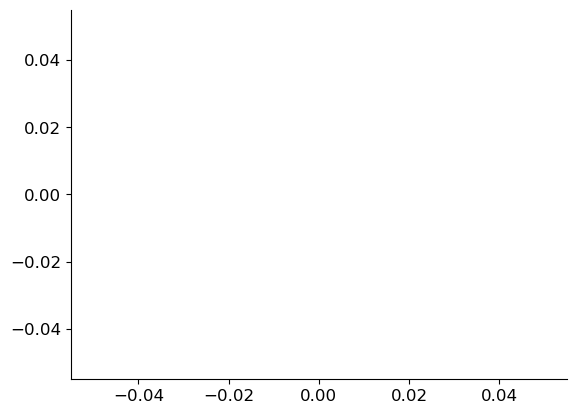

In [230]:
near_field_list = []

for animal in clusters_dict_labelled_field_type_early_SST_trough:
    for cell in clusters_dict_labelled_field_type_early_SST_trough[animal]:
        for i in clusters_dict_labelled_field_type_early_SST_trough[animal][cell]:
            if "noisy_field" in clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i]:
                near_field_list.append(np.mean(clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i]["noisy_field"], axis=0))

print(len(near_field_list))   


for i in near_field_list:
    plt.plot(i)
plt.show()

near_field_array = np.array(near_field_list)

mean_near_field_array = np.mean(near_field_array, axis=0)
sem_near_field_array = sem(near_field_array, axis=0)

plt.plot(mean_near_field_array)
plt.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, alpha=0.2)



In [205]:
def plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="near_field", plot=False):

    near_field_list = []

    for animal in clusters_dict_labelled_field_type_early_SST_trough:
        for cell in clusters_dict_labelled_field_type_early_SST_trough[animal]:
            for i in clusters_dict_labelled_field_type_early_SST_trough[animal][cell]:
                entry = clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i]
                if field_type in entry:
                    arr = entry[field_type]
                    if len(arr) == 0:
                        continue  # skip empty arrays
                
                if field_type in clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i]:
                    means = np.mean(clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i][field_type], axis=0)
                    if means.shape != (50,):
                        continue

                    near_field_list.append(means) 
    
    near_field_array = np.array(near_field_list)
    
    if plot:
    
        for i in near_field_list:
            plt.plot(i, color='gray')
        plt.plot(np.mean(near_field_array, axis=0), color='red')
        plt.show()

        mean_near_field_array = np.mean(near_field_array, axis=0)
        sem_near_field_array = sem(near_field_array, axis=0)

        plt.plot(mean_near_field_array)
        plt.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, alpha=0.2)
    
    return near_field_array


# def plot_and_fill_between(mean_near_field_array, sem_near_field_array, col='r', ax=axs[0,0]):
#     ax.plot(mean_near_field_array, color=col)
#     ax.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, color=col, alpha=0.2)
    
def plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=True, plot=False, cell_type="SST"):
    
    if use_trough:
        near_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="near_field", plot=False)
        before_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="before_field", plot=False)
        after_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="after_field", plot=False)
        noisy_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="noisy_field", plot=False)
        print(f"noisy_field_array_early.shape {noisy_field_array_early.shape}")
        
        near_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="near_field", plot=False)
        before_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="before_field", plot=False)
        after_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="after_field", plot=False)
        noisy_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="noisy_field", plot=False)
        
        print(f"noisy_field_array_late.shape {noisy_field_array_late.shape}")
        
        mean_near_field_array_early = np.mean(near_field_array_early, axis=0)
        sem_near_field_array_early = sem(near_field_array_early, axis=0)

        mean_before_field_array_early = np.mean(before_field_array_early, axis=0)
        sem_before_field_array_early = sem(before_field_array_early, axis=0)

        mean_after_field_array_early = np.mean(after_field_array_early, axis=0)
        sem_after_field_array_early = sem(after_field_array_early, axis=0)
        
        mean_noisy_field_array_early = np.mean(noisy_field_array_early, axis=0)
        sem_noisy_field_array_early = sem(noisy_field_array_early, axis=0)

        mean_near_field_array_late = np.mean(near_field_array_late, axis=0)
        sem_near_field_array_late = sem(near_field_array_late, axis=0)

        mean_before_field_array_late = np.mean(before_field_array_late, axis=0)
        sem_before_field_array_late = sem(before_field_array_late, axis=0)

        mean_after_field_array_late = np.mean(after_field_array_late, axis=0)
        sem_after_field_array_late = sem(after_field_array_late, axis=0)
        
        mean_noisy_field_array_late = np.mean(noisy_field_array_late, axis=0)
        sem_noisy_field_array_late = sem(noisy_field_array_late, axis=0)
        
    else:
        near_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="near_field", plot=False)
        before_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="before_field", plot=False)
        after_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="after_field", plot=False)
        noisy_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="noisy_field", plot=False)
        print(f"noisy_field_array_early.shape {noisy_field_array_early.shape}")
        
        near_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="near_field", plot=False)
        before_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="before_field", plot=False)
        after_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="after_field", plot=False)
        noisy_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="noisy_field", plot=False)
        print(f"noisy_field_array_late.shape {noisy_field_array_late.shape}")
        
        
        mean_near_field_array_early = np.mean(near_field_array_early, axis=0)
        sem_near_field_array_early = sem(near_field_array_early, axis=0)

        mean_before_field_array_early = np.mean(before_field_array_early, axis=0)
        sem_before_field_array_early = sem(before_field_array_early, axis=0)

        mean_after_field_array_early = np.mean(after_field_array_early, axis=0)
        sem_after_field_array_early = sem(after_field_array_early, axis=0)
        
        mean_noisy_field_array_early = np.mean(noisy_field_array_early, axis=0)
        sem_noisy_field_array_early = sem(noisy_field_array_early, axis=0)

        mean_near_field_array_late = np.mean(near_field_array_late, axis=0)
        sem_near_field_array_late = sem(near_field_array_late, axis=0)

        mean_before_field_array_late = np.mean(before_field_array_late, axis=0)
        sem_before_field_array_late = sem(before_field_array_late, axis=0)

        mean_after_field_array_late = np.mean(after_field_array_late, axis=0)
        sem_after_field_array_late = sem(after_field_array_late, axis=0)
        
        mean_noisy_field_array_late = np.mean(noisy_field_array_late, axis=0)
        sem_noisy_field_array_late = sem(noisy_field_array_late, axis=0)

    
    if plot:
        fig, axs = plt.subplots(4,3, figsize=(15,12))
        plt.suptitle(cell_type)
        
        if use_trough:
            axs[0,0].set_title("Before Reward Early Trough")
            axs[0,1].set_title("Near Reward Early Trough")
            axs[0,2].set_title("After Reward Early Trough")
        else:
            axs[0,0].set_title("Before Reward Early Peak")
            axs[0,1].set_title("Near Reward Early Peak")
            axs[0,2].set_title("After Reward Early Peak")

        axs[1,0].imshow(before_field_array_early, aspect='auto')

        axs[1,1].imshow(near_field_array_early, aspect='auto')

        axs[1,2].imshow(after_field_array_early, aspect='auto')

        axs[0,1].plot(mean_near_field_array_early, color='r')
        axs[0,1].fill_between(range(len(mean_near_field_array_early)), mean_near_field_array_early-sem_near_field_array_early, mean_near_field_array_early+sem_near_field_array_early, color='r', alpha=0.2)
        
        axs[0,0].plot(mean_before_field_array_early, color='b')
        axs[0,0].fill_between(range(len(mean_before_field_array_early)), mean_before_field_array_early-sem_before_field_array_early, mean_before_field_array_early+sem_before_field_array_early, color='b', alpha=0.2)

        axs[0,2].plot(mean_after_field_array_early, color='purple')
        axs[0,2].fill_between(range(len(mean_after_field_array_early)), mean_after_field_array_early-sem_after_field_array_early, mean_after_field_array_early+sem_after_field_array_early, color='purple', alpha=0.2)
            
        axs[2,0].plot(mean_before_field_array_late, color='b')
        axs[2,0].fill_between(range(len(mean_before_field_array_late)), mean_before_field_array_late-sem_before_field_array_late, mean_before_field_array_late+sem_before_field_array_late, color='b', alpha=0.2)
    
        axs[2,1].plot(mean_near_field_array_late, color='r')
        axs[2,1].fill_between(range(len(mean_near_field_array_late)), mean_near_field_array_late-sem_near_field_array_late, mean_near_field_array_late+sem_near_field_array_late, color='r', alpha=0.2)
       
        axs[2,2].plot(mean_after_field_array_late, color='purple')
        axs[2,2].fill_between(range(len(mean_after_field_array_late)), mean_after_field_array_late-sem_after_field_array_late, mean_after_field_array_late+sem_after_field_array_late, color='purple', alpha=0.2)
    
        if use_trough:
            axs[2,0].set_title("Before Reward Late Trough")
            axs[2,1].set_title("Near Reward Late Trough")
            axs[2,2].set_title("After Reward Late Trough")
        else:
            axs[2,0].set_title("Before Reward Late Peak")
            axs[2,1].set_title("Near Reward Late Peak")
            axs[2,2].set_title("After Reward Late Peak")


        axs[3,0].imshow(before_field_array_late, aspect='auto')

        axs[3,1].imshow(near_field_array_late, aspect='auto')

        axs[3,2].imshow(after_field_array_late, aspect='auto')

        plt.tight_layout()
        plt.plot()
        
    else:
        return mean_before_field_array_early, mean_near_field_array_early, mean_after_field_array_early, mean_before_field_array_late, mean_near_field_array_late, mean_after_field_array_late, noisy_field_array_early, noisy_field_array_late



noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)
noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)


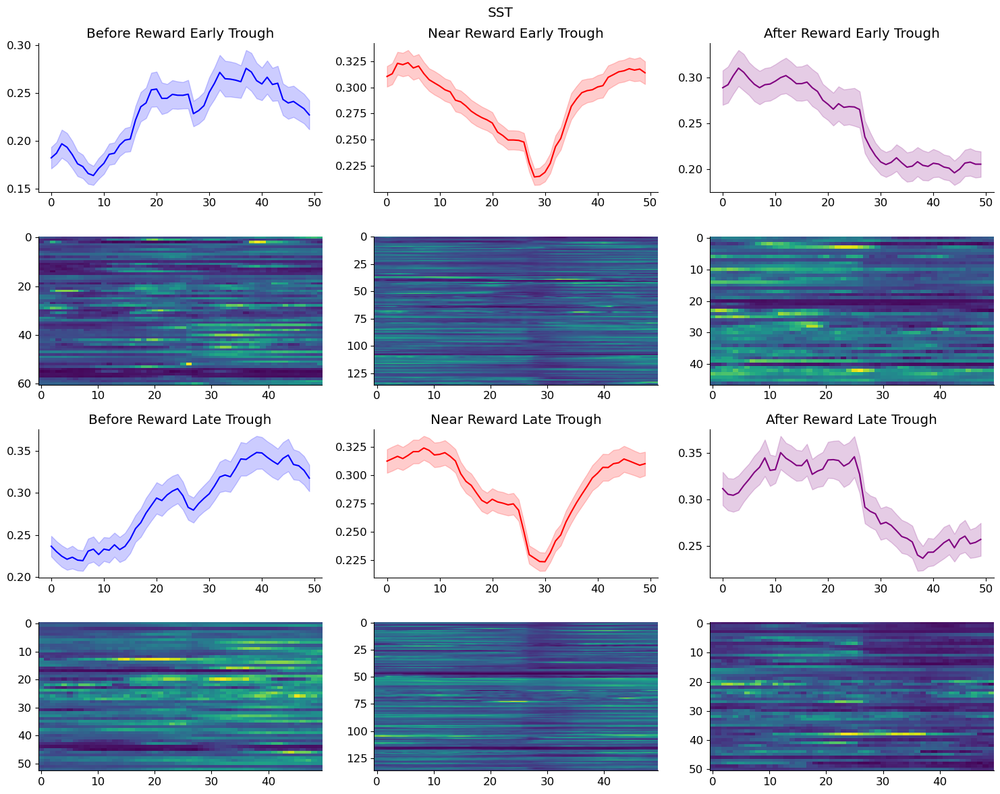

In [329]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=True, plot=True, cell_type="SST")
mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, noisy_field_array_early_trough_SST, noisy_field_array_late_trough_SST = plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, plot=False)


        
    

noisy_field_array_early.shape (10, 50)
noisy_field_array_late.shape (10, 50)
noisy_field_array_early.shape (10, 50)
noisy_field_array_late.shape (10, 50)


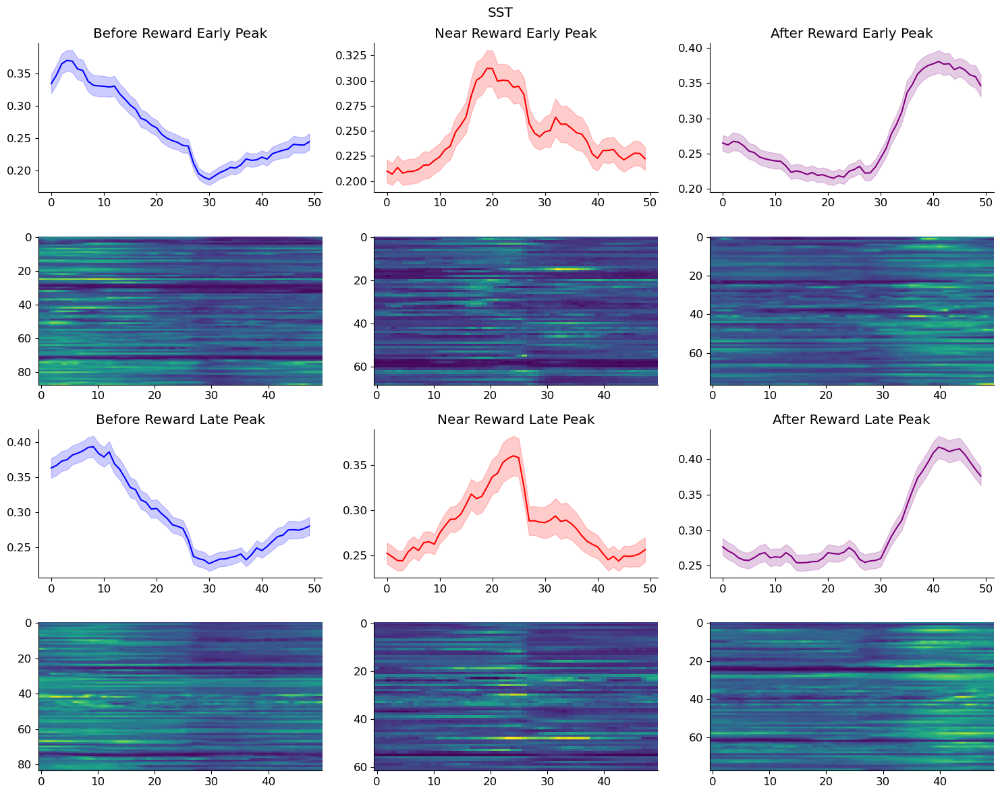

In [235]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=False, plot=True, cell_type="SST")
mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, noisy_field_array_early_peak_SST, noisy_field_array_late_peak_SST = plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, plot=False)
    

noisy_field_array_early.shape (158, 50)
noisy_field_array_late.shape (158, 50)
noisy_field_array_early.shape (158, 50)
noisy_field_array_late.shape (158, 50)


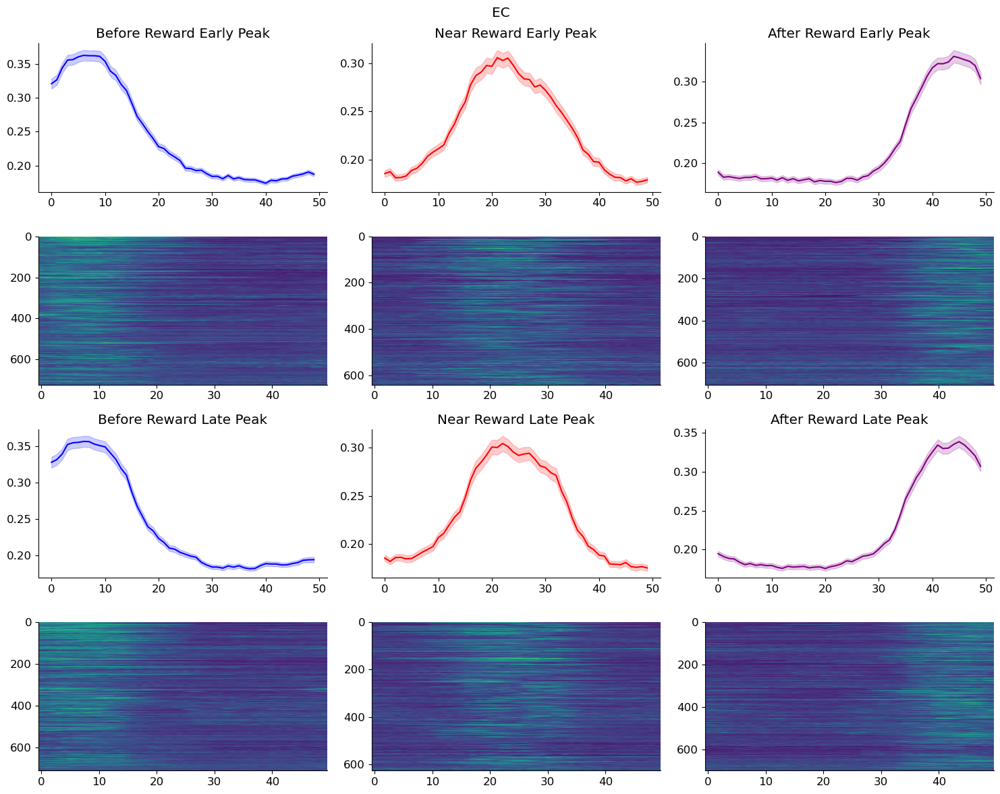

In [237]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, use_trough=False, plot=True, cell_type="EC")
mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC, noisy_field_array_early_peak_EC, noisy_field_array_late_peak_EC = plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, plot=False)
    

noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)
noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)


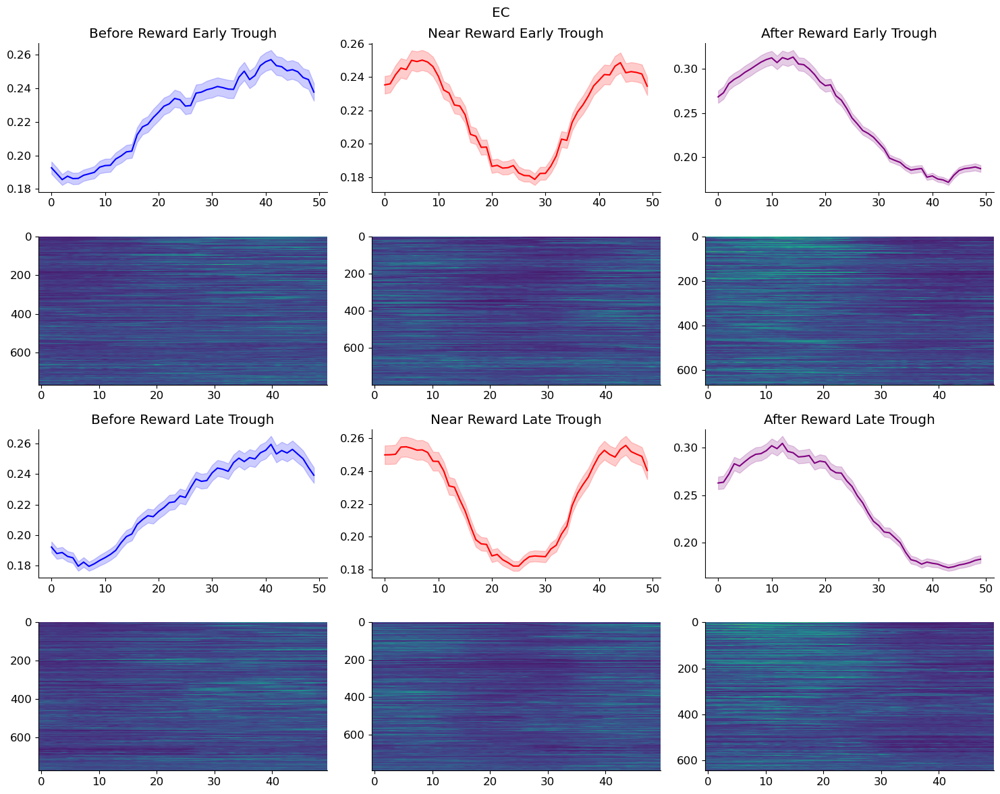

In [238]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, use_trough=True, plot=True, cell_type="EC")
mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC, noisy_field_array_early_trough_EC, noisy_field_array_late_trough_EC = plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, plot=False)
   

noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)
noisy_field_array_early.shape (0,)
noisy_field_array_late.shape (0,)


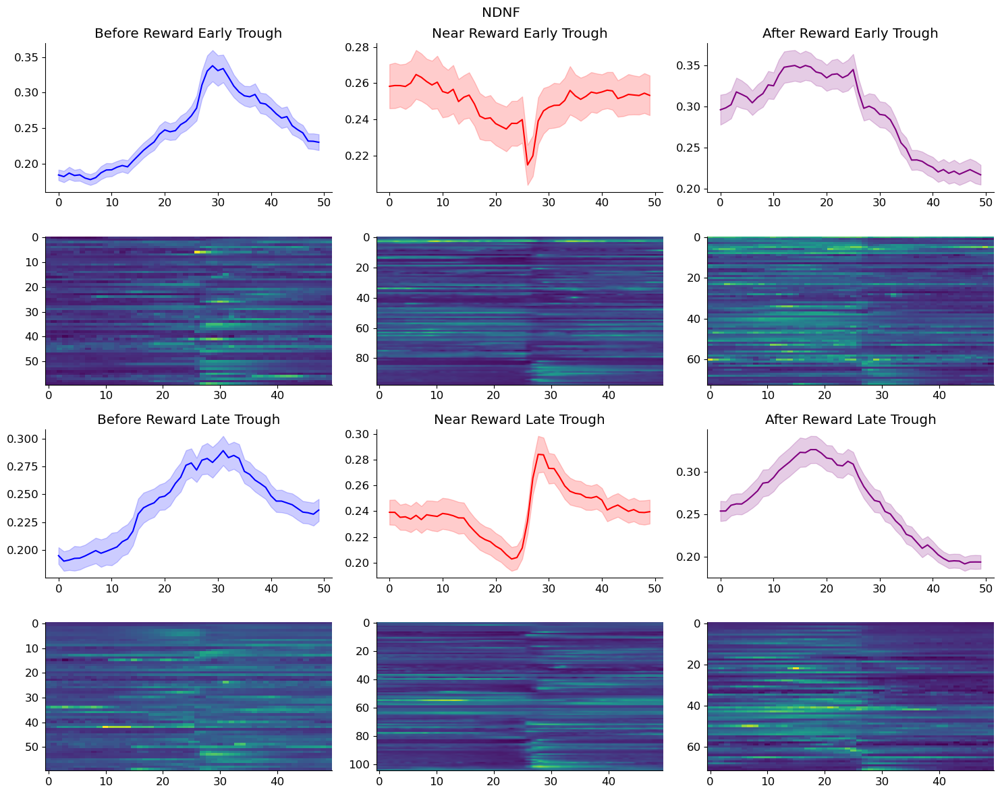

In [239]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, use_trough=True, plot=True, cell_type="NDNF")
mean_before_field_array_early_trough_NDNF, mean_near_field_array_early_trough_NDNF, mean_after_field_array_early_trough_NDNF, mean_before_field_array_late_trough_NDNF, mean_near_field_array_late_trough_NDNF, mean_after_field_array_late_trough_NDNF, noisy_field_array_early_trough_NDNF, noisy_field_array_late_trough_NDNF = plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, plot=False)
   

noisy_field_array_early.shape (14, 50)
noisy_field_array_late.shape (14, 50)
noisy_field_array_early.shape (14, 50)
noisy_field_array_late.shape (14, 50)


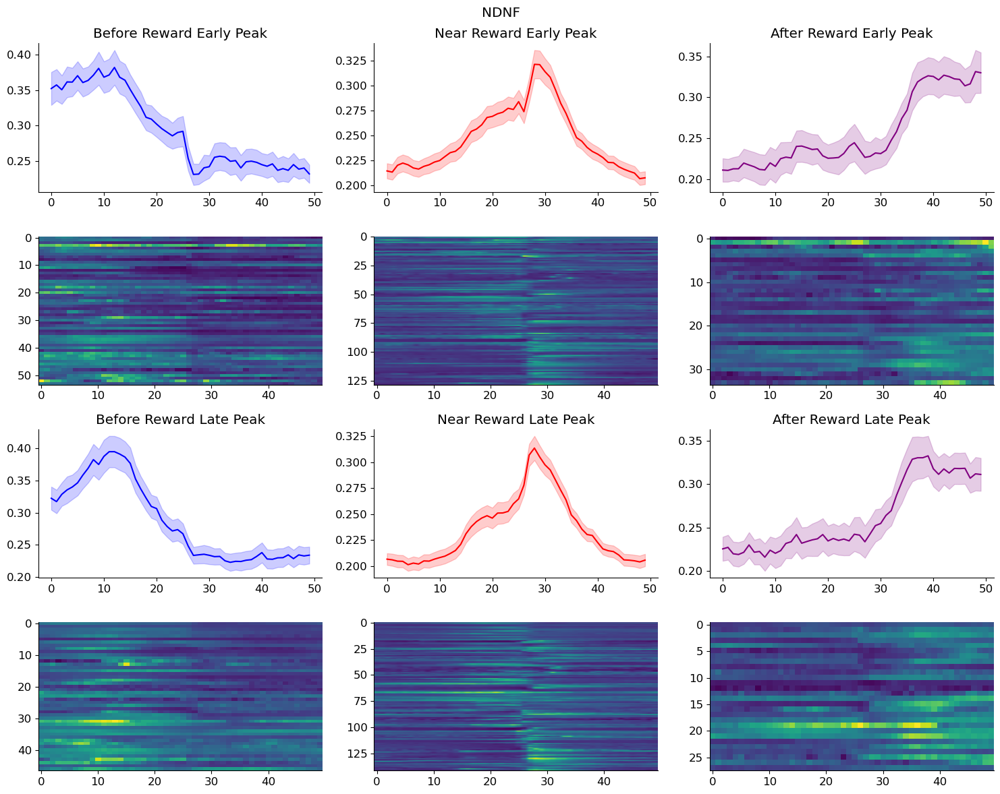

In [240]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, use_trough=False, plot=True, cell_type="NDNF")
mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF, noisy_field_array_early_peak_NDNF, noisy_field_array_late_peak_NDNF = plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, plot=False)
    

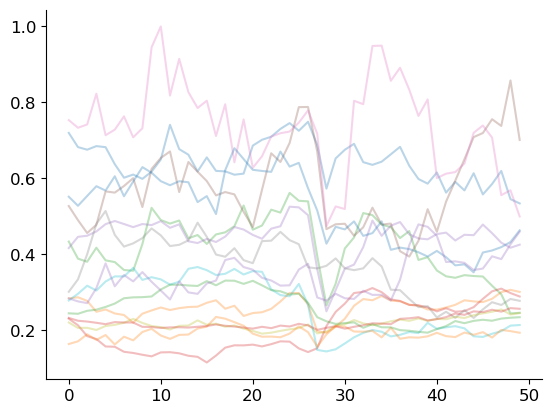

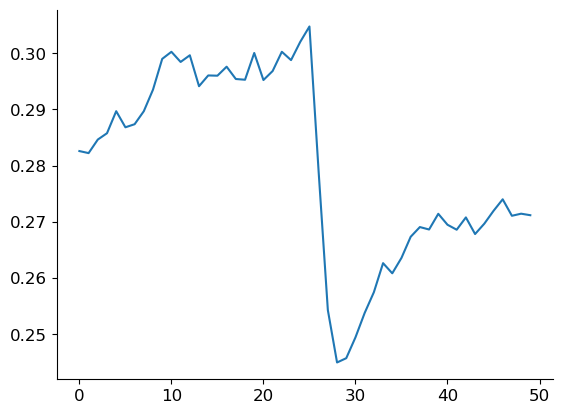

In [184]:
activity_list = []

for animal in clusters_dict_labelled_field_type_early_NDNF_peak:
    for cell in clusters_dict_labelled_field_type_early_NDNF_peak[animal]:
        for i in clusters_dict_labelled_field_type_early_NDNF_peak[animal][cell]:
            if "noisy_field" in clusters_dict_labelled_field_type_early_NDNF_peak[animal][cell][i]:
                cl = clusters_dict_labelled_field_type_early_NDNF_peak[animal][cell][i]["noisy_field"]
                if np.any(cl):
                    activity_list.append(np.mean(cl, axis=0))
                
activity_array = np.array(activity_list) 
            
mean_activity_noise_ndnf = np.mean(activity_array, axis=0)


plt.plot(mean_activity)
plt.show()
    

# for animal in clusters_dict_labelled_field_type_early_NDNF_peak:
#     for cell in clusters_dict_labelled_field_type_early_NDNF_peak[animal]:
        
    
# nf = clusters_dict_labelled_field_type_early_NDNF_peak["animal_10"]["cell_2"][1]["noisy_field"]
# mean = np.mean(nf, axis=0)
# for i in range(nf.shape[0]):
#     plt.plot(nf[i,:])
# plt.plot(mean, color='r', linewidth=5)
# plt.show()

In [298]:
animal_percent_dict_NDNF_early_peak, percent_lists_NDNF_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_NDNF_peak, fixed_NDNF_new_residual_dict)
animal_percent_dict_NDNF_late_peak, percent_lists_NDNF_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_NDNF_peak, fixed_NDNF_new_residual_dict)

animal_percent_dict_NDNF_early_trough, percent_lists_NDNF_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_NDNF_trough, fixed_NDNF_new_residual_dict)
animal_percent_dict_NDNF_late_trough, percent_lists_NDNF_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_NDNF_trough, fixed_NDNF_new_residual_dict)


animal_10 cell_2 → total trials: 390 total labeled: 5
animal_10 cell_3 → total trials: 390 total labeled: 60
animal_10 cell_4 → total trials: 390 total labeled: 20
animal_10 cell_5 → total trials: 390 total labeled: 5
animal_10 cell_6 → total trials: 390 total labeled: 5
animal_10 cell_7 → total trials: 390 total labeled: 5
animal_10 cell_8 → total trials: 390 total labeled: 115
animal_10 cell_9 → total trials: 390 total labeled: 5
animal_10 cell_10 → total trials: 390 total labeled: 25
animal_10 cell_11 → total trials: 390 total labeled: 100
animal_11 cell_2 → total trials: 172 total labeled: 15
animal_11 cell_3 → total trials: 172 total labeled: 30
animal_11 cell_4 → total trials: 172 total labeled: 30
animal_11 cell_5 → total trials: 172 total labeled: 65
animal_11 cell_6 → total trials: 172 total labeled: 45
animal_11 cell_7 → total trials: 172 total labeled: 40
animal_11 cell_8 → total trials: 172 total labeled: 30
animal_11 cell_9 → total trials: 172 total labeled: 30
animal_12 c

In [299]:
animal_percent_dict_EC_early_peak, percent_lists_EC_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_EC_peak, residual_activity_dict_EC)
animal_percent_dict_EC_late_peak, percent_lists_EC_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_EC_peak, residual_activity_dict_EC)

animal_percent_dict_EC_early_trough, percent_lists_EC_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_EC_trough, residual_activity_dict_EC)
animal_percent_dict_EC_late_trough, percent_lists_EC_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_EC_trough, residual_activity_dict_EC)


animal_1 cell_1 → total trials: 78 total labeled: 40
animal_1 cell_2 → total trials: 78 total labeled: 10
animal_1 cell_3 → total trials: 78 total labeled: 20
animal_1 cell_4 → total trials: 78 total labeled: 40
animal_1 cell_5 → total trials: 78 total labeled: 20
animal_1 cell_6 → total trials: 78 total labeled: 35
animal_1 cell_7 → total trials: 78 total labeled: 15
animal_1 cell_8 → total trials: 78 total labeled: 5
animal_1 cell_9 → total trials: 78 total labeled: 50
animal_1 cell_10 → total trials: 78 total labeled: 65
animal_1 cell_11 → total trials: 78 total labeled: 25
animal_1 cell_12 → total trials: 78 total labeled: 35
animal_1 cell_13 → total trials: 78 total labeled: 20
animal_1 cell_14 → total trials: 78 total labeled: 30
animal_1 cell_15 → total trials: 78 total labeled: 30
animal_1 cell_16 → total trials: 78 total labeled: 50
animal_1 cell_17 → total trials: 78 total labeled: 5
animal_1 cell_18 → total trials: 78 total labeled: 10
animal_1 cell_19 → total trials: 78 tot

In [300]:
##### percent lists results in 5 options for trial types and then each of those have 75 cells with the percent of them inside 

In [330]:
animal_percent_dict_SST_early_peak, percent_lists_SST_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_SST_peak, residual_activity_dict_SST)
animal_percent_dict_SST_late_peak, percent_lists_SST_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_SST_peak, residual_activity_dict_SST)

animal_percent_dict_SST_early_trough, percent_lists_SST_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_SST_trough, residual_activity_dict_SST)
animal_percent_dict_SST_late_trough, percent_lists_SST_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_SST_trough, residual_activity_dict_SST)


animal_1 cell_2 → total trials: 212 total labeled: 15
animal_1 cell_3 → total trials: 212 total labeled: 10
animal_1 cell_4 → total trials: 212 total labeled: 35
animal_1 cell_5 → total trials: 212 total labeled: 10
animal_1 cell_6 → total trials: 212 total labeled: 90
animal_2 cell_2 → total trials: 152 total labeled: 35
animal_2 cell_3 → total trials: 152 total labeled: 10
animal_2 cell_4 → total trials: 152 total labeled: 65
animal_2 cell_5 → total trials: 152 total labeled: 35
animal_2 cell_6 → total trials: 152 total labeled: 115
animal_2 cell_7 → total trials: 152 total labeled: 115
animal_2 cell_8 → total trials: 152 total labeled: 25
animal_2 cell_9 → total trials: 152 total labeled: 60
animal_2 cell_10 → total trials: 152 total labeled: 25
animal_2 cell_11 → total trials: 152 total labeled: 40
animal_2 cell_12 → total trials: 152 total labeled: 25
animal_2 cell_13 → total trials: 152 total labeled: 60
animal_2 cell_14 → total trials: 152 total labeled: 45
animal_2 cell_15 → to

In [302]:
### percent of cells is a list of just 5 that tells you out of total number of cells how many there are 

In [331]:
percent_of_cells_list_NDNF_early_peak, percent_of_cells_list_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough = get_cells_percents(animal_percent_dict_NDNF_early_peak, animal_percent_dict_NDNF_late_peak, animal_percent_dict_NDNF_early_trough, animal_percent_dict_NDNF_late_trough)
percent_of_cells_list_SST_early_peak, percent_of_cells_list_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough = get_cells_percents(animal_percent_dict_SST_early_peak, animal_percent_dict_SST_late_peak, animal_percent_dict_SST_early_trough, animal_percent_dict_SST_late_trough)
percent_of_cells_list_EC_early_peak, percent_of_cells_list_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough = get_cells_percents(animal_percent_dict_EC_early_peak, animal_percent_dict_EC_late_peak, animal_percent_dict_EC_early_trough, animal_percent_dict_EC_late_trough)


In [278]:
# quintupled_list = []
# len(percent_lists_EC_early_peak)
# for i in range(len(percent_lists_EC_early_peak)):
#     print(len(percent_lists_EC_early_peak[i]))
#     quint = percent_lists_EC_early_peak[i]*5
#     print(len(quint))
#     quintupled_list.append(quint)

quintupled_list = [arr * 5 for arr in percent_lists_EC_early_peak]


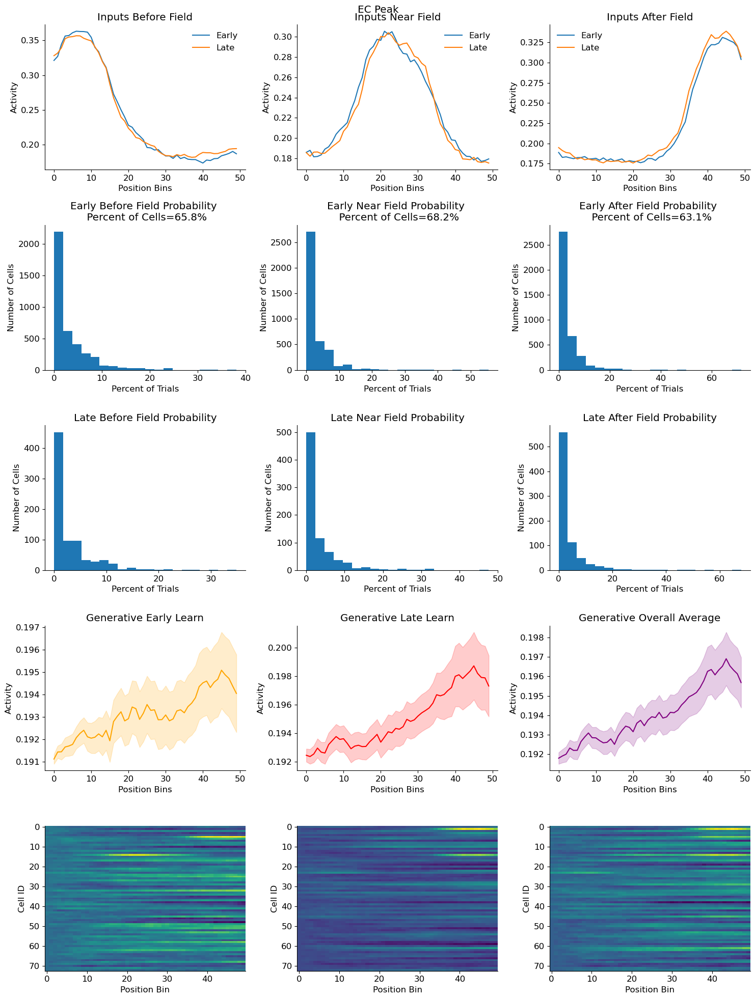

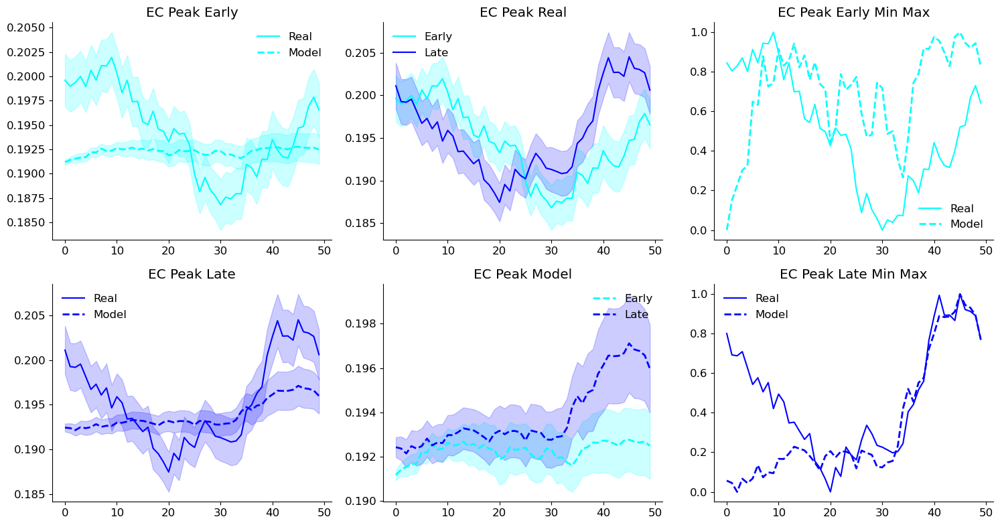

In [281]:
inits=0.19
vol= 0.01

reconstruct_activity_from_clusters(mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC, noisy_field_array_early_peak_EC, noisy_field_array_late_peak_EC, quintupled_list, percent_lists_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC Peak", plot=True)
cell_list_early_EC_peak, cell_list_late_EC_peak, full_activity_list_EC_peak, trial_averaged_cell_array_early_EC_peak, trial_averaged_cell_array_late_EC_peak, full_activity_trial_av_array_EC_peak = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC, noisy_field_array_early_peak_EC, noisy_field_array_late_peak_EC, quintupled_list, percent_lists_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC Peak", plot=False)
compare_within_subtype(cell_EC_model_ranks20_contig_x00, trial_averaged_cell_array_early_EC_peak, trial_averaged_cell_array_late_EC_peak, full_activity_trial_av_array_EC_peak, residual_activity_dict_EC, cell_type="EC Peak")
 


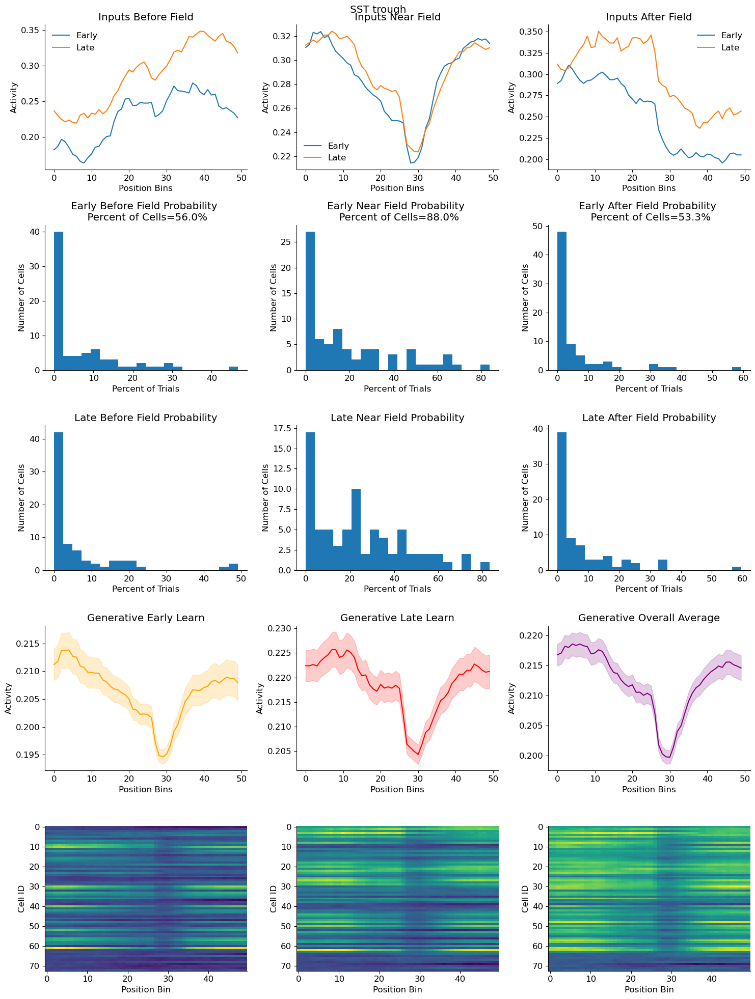

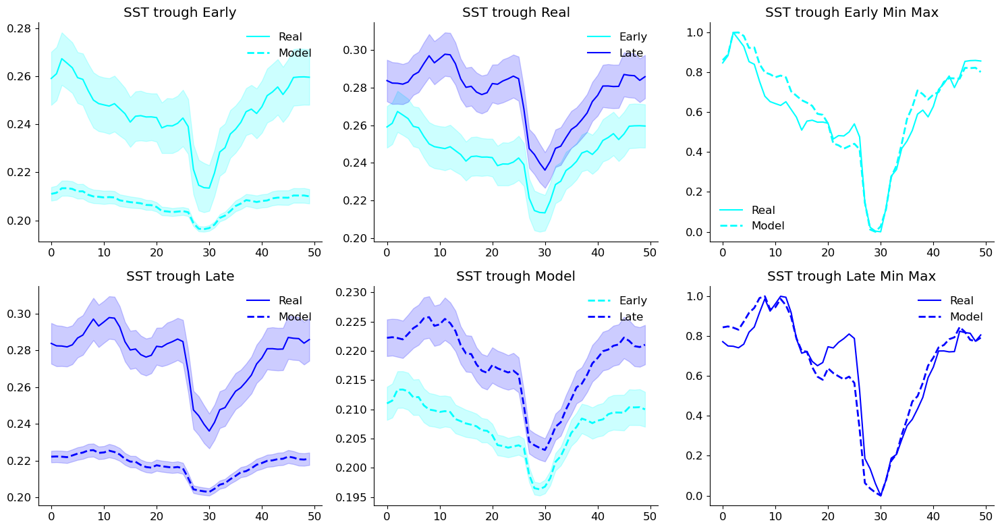

In [332]:
inits=0.19
vol= 0.01

reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, noisy_field_array_early_trough_SST, noisy_field_array_late_trough_SST, percent_lists_SST_early_trough, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST trough", plot=True)
cell_list_early_SST_trough, cell_list_late_SST_trough, full_activity_list_SST_trough, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, noisy_field_array_early_trough_SST, noisy_field_array_late_trough_SST, percent_lists_SST_early_trough, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST trough", plot=False)
compare_within_subtype(cell_SST_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough, residual_activity_dict_SST, cell_type="SST trough")
 


In [346]:
print(len(percent_lists_SST_early_trough[0]))

doubled_percent_list = []
for i in range(len(percent_lists_SST_early_trough)):
    list_cell = []
    for j in range(len(percent_lists_SST_early_trough[i])):
        data = percent_lists_SST_early_trough[i][j]
        if (data*1.5)>100:
            data=(100/1.5)
        list_cell.append(data*1.5)
        
    doubled_percent_list.append(np.array(list_cell))
    

    
# plt.plot(quintupled_list[0])

75


[0.56, 0.88, 0.5333333333333333, 0.02666666666666667, 0.0]


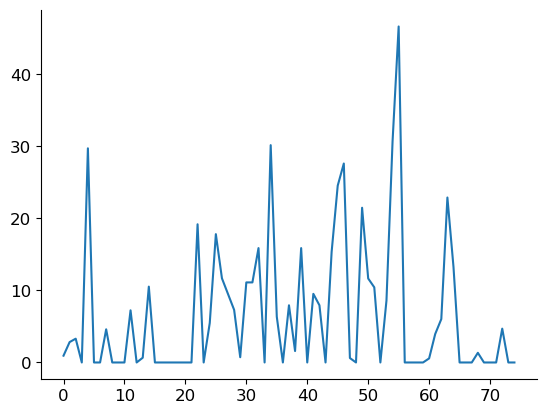

In [333]:
#old
print(percent_of_cells_list_SST_early_trough)
print(plt.plot(percent_lists_SST_early_trough[0]))


[0.56, 0.88, 0.5333333333333333, 0.02666666666666667, 0.0]


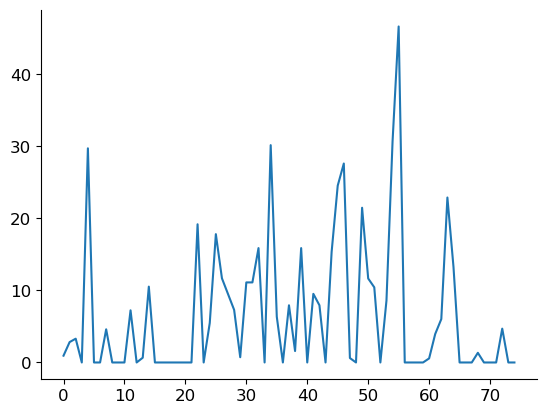

In [317]:
#new 
print(percent_of_cells_list_SST_early_trough)
print(plt.plot(percent_lists_SST_early_trough[0]))


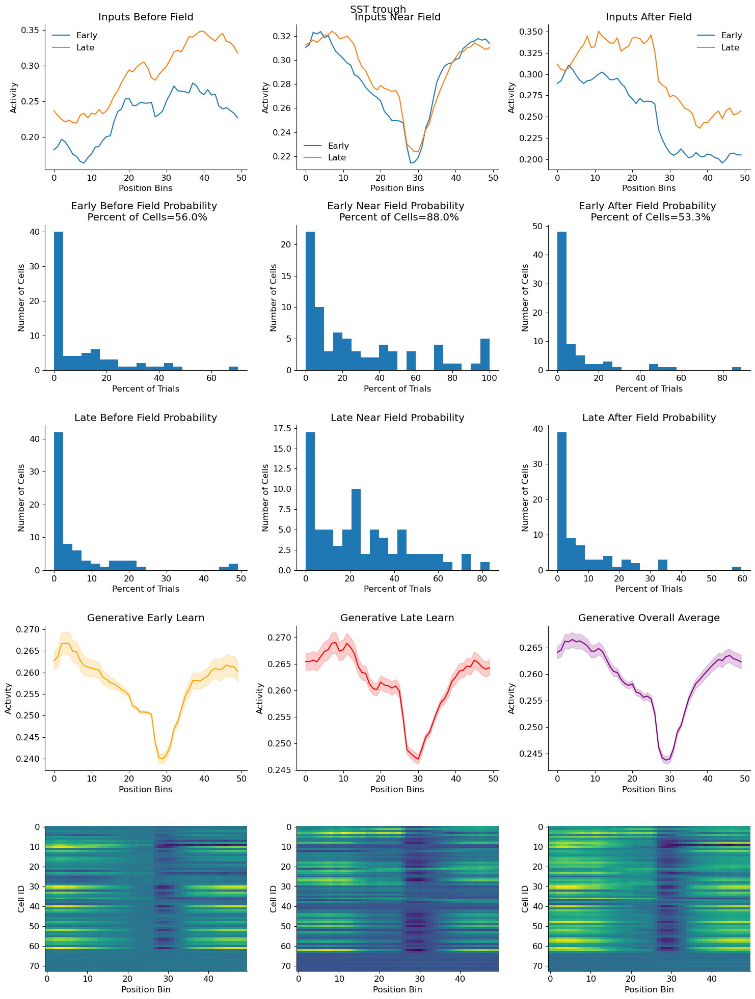

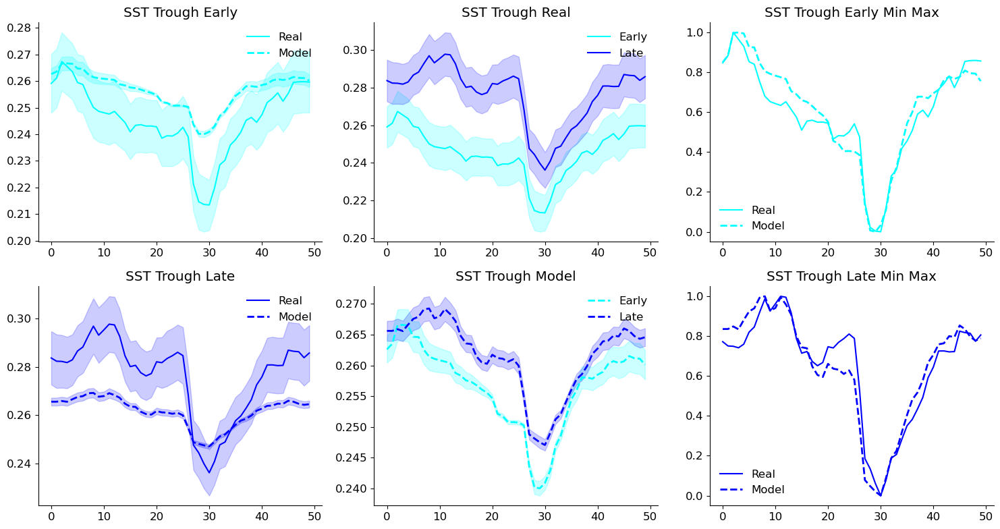

In [347]:
inits=0.25
vol= 0.001

reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, noisy_field_array_early_trough_SST, noisy_field_array_late_trough_SST, doubled_percent_list, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST trough", plot=True)
model_cell_list_SST_trough_early, model_cell_list_SST_trough_late, full_activity_list_SST_trough, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, noisy_field_array_early_trough_SST, noisy_field_array_late_trough_SST, doubled_percent_list, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST Trough", plot=False)
compare_within_subtype(cell_SST_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough, residual_activity_dict_SST, cell_type="SST Trough")
    


In [264]:
percent_lists_NDNF_early_peak

[[0.2564102564102564,
  3.3333333333333335,
  1.5384615384615385,
  0.0,
  0.5128205128205128,
  0.0,
  0.0,
  0.2564102564102564,
  0.0,
  0.0,
  8.13953488372093,
  0.0,
  0.0,
  1.1627906976744187,
  11.046511627906977,
  0.0,
  0.0,
  0.0,
  2.4691358024691357,
  0.0,
  6.790123456790123,
  0.6172839506172839,
  0.0,
  1.8518518518518516,
  1.2345679012345678,
  3.4482758620689653,
  0.8620689655172413,
  0.0,
  0.0,
  18.96551724137931,
  2.586206896551724,
  0.0,
  1.6666666666666667,
  0.0,
  7.222222222222221,
  0.0,
  7.777777777777778,
  0.0,
  4.444444444444445,
  0.0,
  9.01639344262295,
  7.377049180327869,
  6.557377049180328,
  0.0,
  2.459016393442623,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.78125,
  0.0,
  0.78125,
  0.0,
  0.0,
  2.34375,
  0.0,
  0.78125,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 [0.0,
  4.871794871794872,
  0.0,
  0.0,
  0.0,
  0.2564102564102564,
  6.666666666666667,
  0.0,
  1.2820512

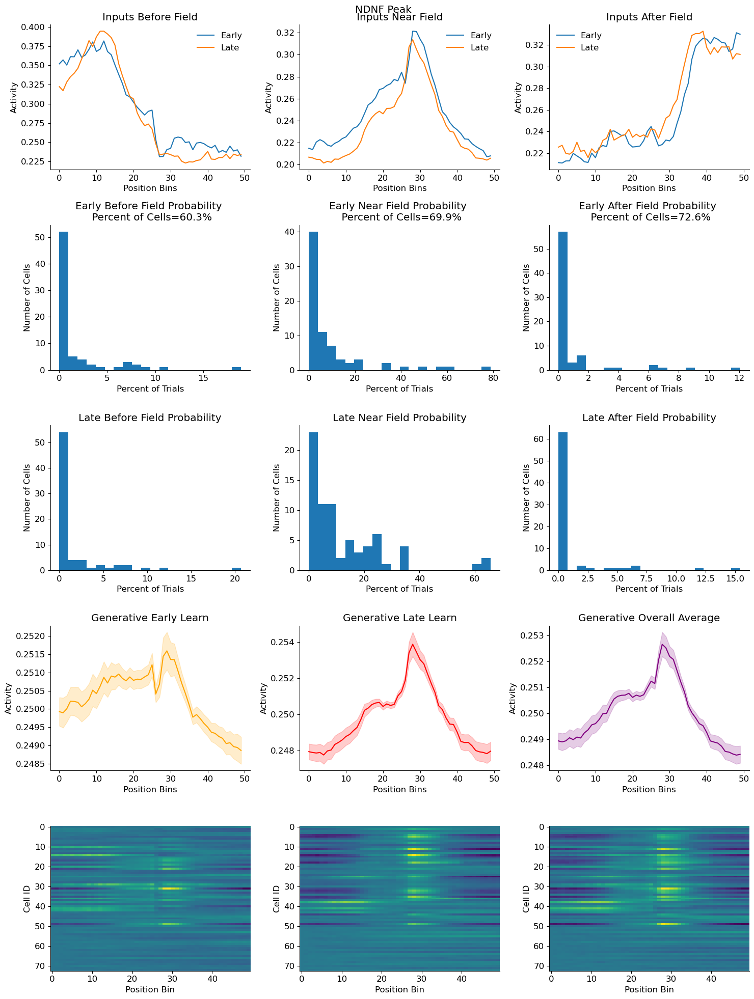

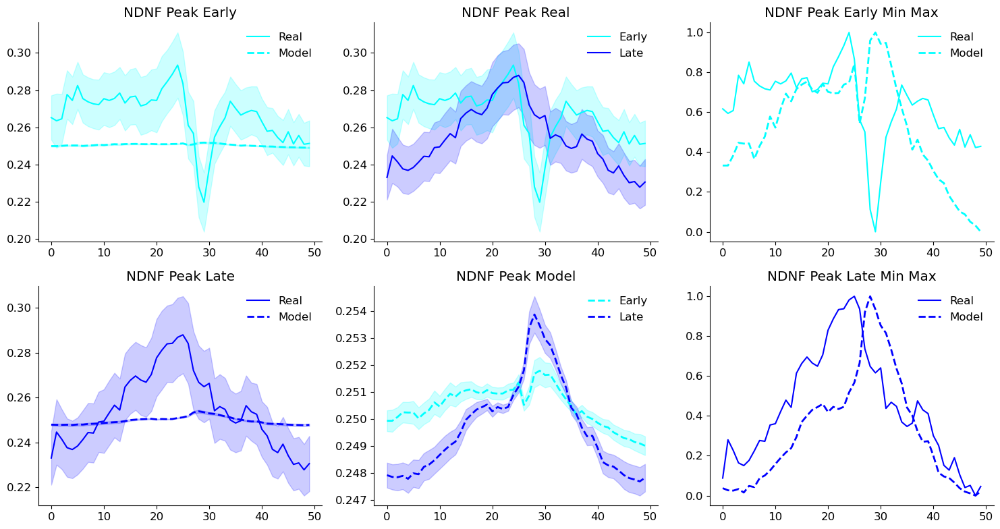

In [263]:
inits=0.25
vol= 0.001

reconstruct_activity_from_clusters(mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF, noisy_field_array_early_peak_NDNF, noisy_field_array_late_peak_NDNF, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough, inits, vol, num_cells=73, cell_type="NDNF Peak", plot=True)
model_cell_list_NDNF_peak_early, model_cell_list_NDNF_peak_late, full_activity_list_NDNF_peak, trial_averaged_cell_array_early_NDNF_peak, trial_averaged_cell_array_late_NDNF_peak, full_activity_trial_av_array_NDNF_peak = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF, noisy_field_array_early_peak_NDNF, noisy_field_array_late_peak_NDNF, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough, inits, vol, num_cells=73, cell_type="NDNF Peak", plot=False)
compare_within_subtype(cell_NDNF_model_ranks20_contig_x00, trial_averaged_cell_array_early_NDNF_peak, trial_averaged_cell_array_late_NDNF_peak, full_activity_trial_av_array_NDNF_peak, fixed_residual_activity_dict_NDNF_new, cell_type="NDNF Peak")



before_percent_array 329.0714158216254 before_percent_array_late 324.1278182496051
near_percent_array 220.37797067817934 before_percent_array_late 190.00008774470592
before_percent_array 279.410226267293 before_percent_array_late 274.6967021335799
overall_early 828.8596127670978 overall_late 788.824608127891
88.0
mean_early 3.683820501187101 mean_late 3.505887147235071
(50, 100)


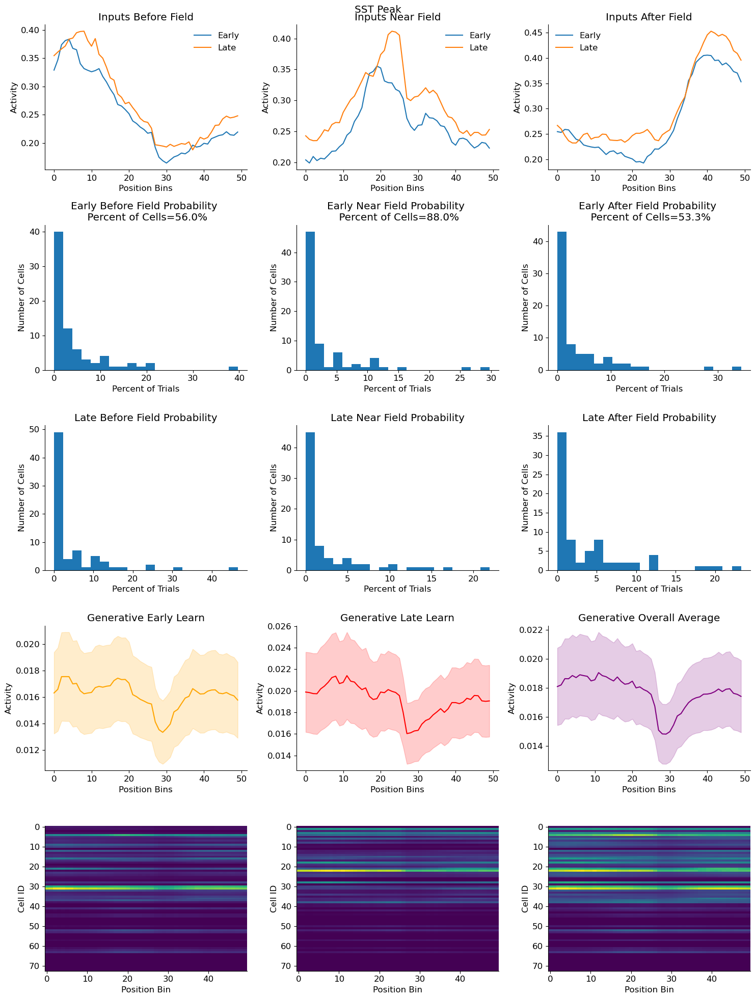

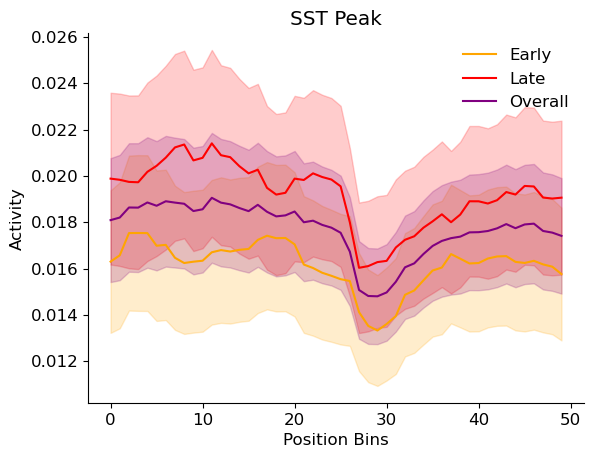

before_percent_array 329.0714158216254 before_percent_array_late 324.1278182496051
near_percent_array 220.37797067817934 before_percent_array_late 190.00008774470592
before_percent_array 279.410226267293 before_percent_array_late 274.6967021335799
overall_early 828.8596127670978 overall_late 788.824608127891
88.0
mean_early 3.683820501187101 mean_late 3.505887147235071
(50, 100)


In [84]:
reconstruct_activity_from_clusters(mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, percent_lists_SST_early_peak, percent_lists_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits=0.25, vol=0.3, num_cells=73, cell_type="SST Peak", plot=True)
model_cell_list_SST_trough_peak, model_cell_list_SST_trough_peak, full_activity_list_SST_peak, trial_averaged_cell_array_early_SST_peak, trial_averaged_cell_array_late_SST_peak, full_activity_trial_av_array_SST_SST_peak = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, percent_lists_SST_early_peak, percent_lists_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits=0.25, vol=0.01, num_cells=73, cell_type="SST Peak", plot=False)



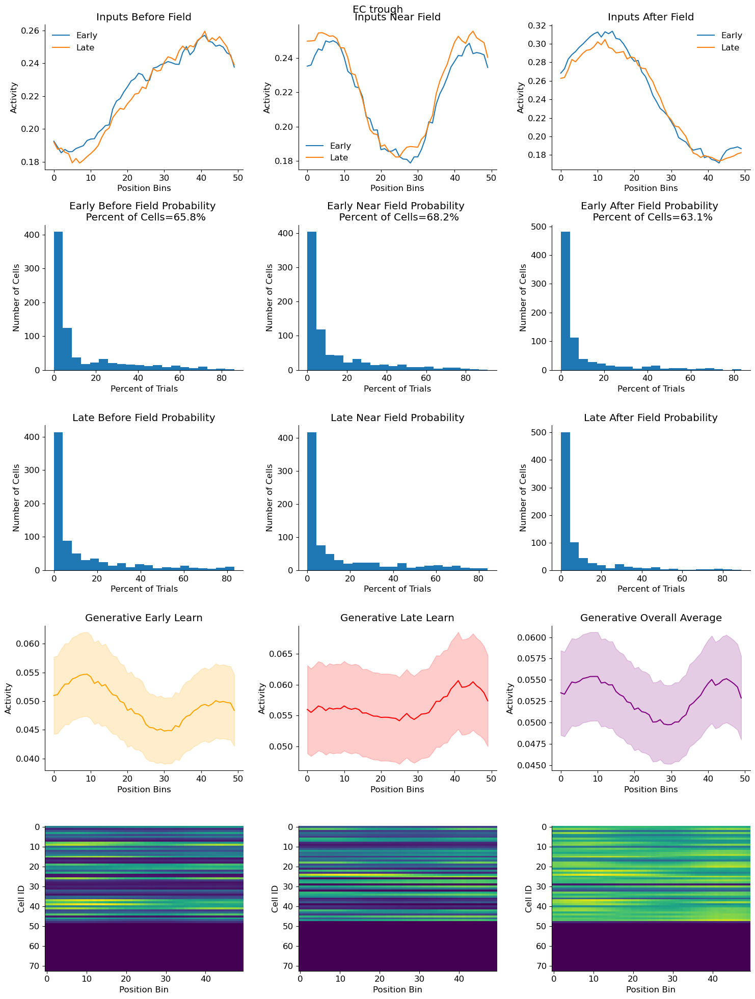

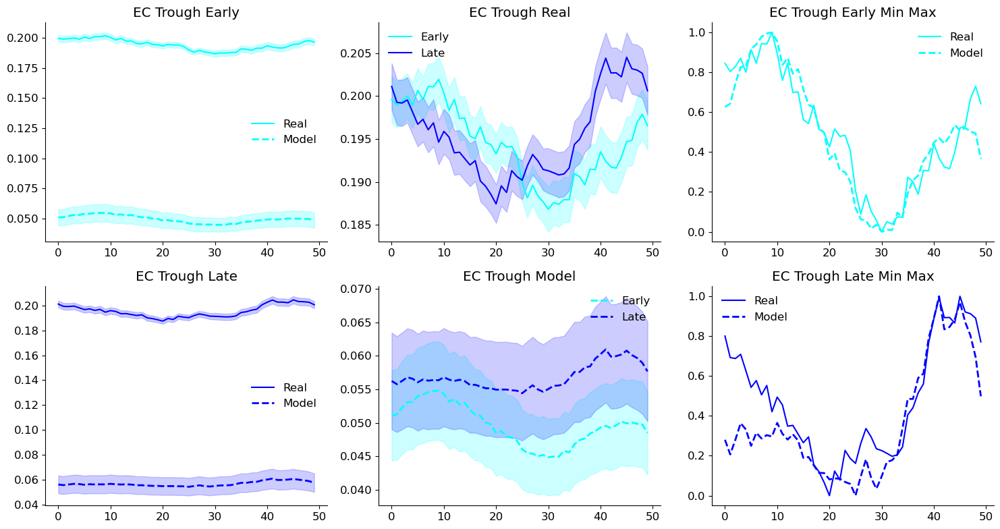

In [155]:
inits=0.00000001
vol= 0.00000001

reconstruct_activity_from_clusters(mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC, percent_lists_EC_early_trough, percent_lists_EC_late_trough, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC trough", plot=True)
cell_list_early_EC_trough, cell_list_late_EC_trough, full_activity_list_EC_trough, trial_averaged_cell_array_early_EC_trough, trial_averaged_cell_array_late_EC_trough, full_activity_trial_av_array_EC_trough = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC, percent_lists_EC_early_trough, percent_lists_EC_late_trough, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC Trough", plot=False)
compare_within_subtype(cell_EC_model_ranks20_contig_x00, trial_averaged_cell_array_early_EC_trough, trial_averaged_cell_array_late_EC_trough, full_activity_trial_av_array_EC_trough, residual_activity_dict_EC, cell_type="EC Trough")
 


In [271]:
inits=0.00000001
vol= 0.00000001

reconstruct_activity_from_clusters(mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC, percent_lists_EC_early_trough, percent_lists_EC_late_trough, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC trough", plot=True)
cell_list_early_EC_trough, cell_list_late_EC_trough, full_activity_list_EC_trough, trial_averaged_cell_array_early_EC_trough, trial_averaged_cell_array_late_EC_trough, full_activity_trial_av_array_EC_trough = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC, percent_lists_EC_early_trough, percent_lists_EC_late_trough, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, inits, vol, num_cells=73, cell_type="EC Trough", plot=False)
compare_within_subtype(cell_EC_model_ranks20_contig_x00, trial_averaged_cell_array_early_EC_trough, trial_averaged_cell_array_late_EC_trough, full_activity_trial_av_array_EC_trough, residual_activity_dict_EC, cell_type="EC Trough")
 


TypeError: reconstruct_activity_from_clusters() missing 2 required positional arguments: 'inits' and 'vol'

In [269]:
quintupled_list = []
len(percent_lists_NDNF_early_trough)
for i in percent_lists_NDNF_early_trough:
    quintupled_list.append(i*5)
    

In [270]:
reconstruct_activity_from_clusters(mean_before_field_array_early_trough_NDNF, mean_near_field_array_early_trough_NDNF, mean_after_field_array_early_trough_NDNF, mean_before_field_array_late_trough_NDNF, mean_near_field_array_late_trough_NDNF, mean_after_field_array_late_trough_NDNF, percent_lists_NDNF_early_trough, percent_lists_NDNF_late_trough, quintupled_list, percent_of_cells_list_NDNF_late_trough, num_cells=73, cell_type="NDNF trough", plot=True)
trial_averaged_cell_array_early_NDNF_trough, trial_averaged_cell_array_late_NDNF_trough, full_activity_trial_av_array_NDNF_trough = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_NDNF, mean_near_field_array_early_trough_NDNF, mean_after_field_array_early_trough_NDNF, mean_before_field_array_late_trough_NDNF, mean_near_field_array_late_trough_NDNF, mean_after_field_array_late_trough_NDNF, quintupled_list, percent_lists_NDNF_late_trough, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough, num_cells=73, cell_type="NDNF Trough", plot=False)



TypeError: reconstruct_activity_from_clusters() missing 4 required positional arguments: 'percent_of_cells_list_SST_early_trough', 'percent_of_cells_list_SST_late_trough', 'inits', and 'vol'

In [97]:
fixed_residual_activity_dict_NDNF_new

{'animal_10': {'cell_2': array([[ 5.97397691, 11.34364604,  5.68611862, ..., -0.41768103,
           0.17005541, -0.34664431],
         [ 6.11617851, 10.35319206,  5.06202826, ..., -0.42595959,
          -0.27112659,  0.09498553],
         [ 7.28735122,  8.52137116,  5.45462618, ..., -0.29073907,
           0.23824132, -0.24620189],
         ...,
         [ 9.85919764,  5.43915035,  3.76192876, ...,  0.44762874,
          -0.07538333, -0.35675517],
         [ 8.77032256,  4.58291113,  2.78408256, ...,  0.40800735,
           0.14265122, -0.47443685],
         [ 8.56141001,  4.59970385,  2.53433959, ...,  0.23870329,
          -0.72334974, -0.36347809]]),
  'cell_3': array([[ 0.27938629,  0.53413653,  2.21053792, ...,  0.95790978,
          -1.07207619, -0.26665444],
         [ 0.77111949,  0.65253739,  1.78657019, ...,  1.45833606,
          -0.91270588, -0.58726055],
         [ 1.3277826 ,  0.95487677,  2.89319303, ...,  2.61185489,
          -1.05222452, -0.32193607],
         ...,
 

In [95]:
def get_min_max_raw_data(residual_activity_dict_EC):
    data_list = []

    for animal in residual_activity_dict_EC:
        for cell in residual_activity_dict_EC[animal]:
            data = residual_activity_dict_EC[animal][cell]
            data_norm = (data - np.min(data)) / (np.max(data) - np.min(data))
            data_list.append(np.mean(data_norm, axis=1))

    data_array = np.array(data_list)
    return data_array


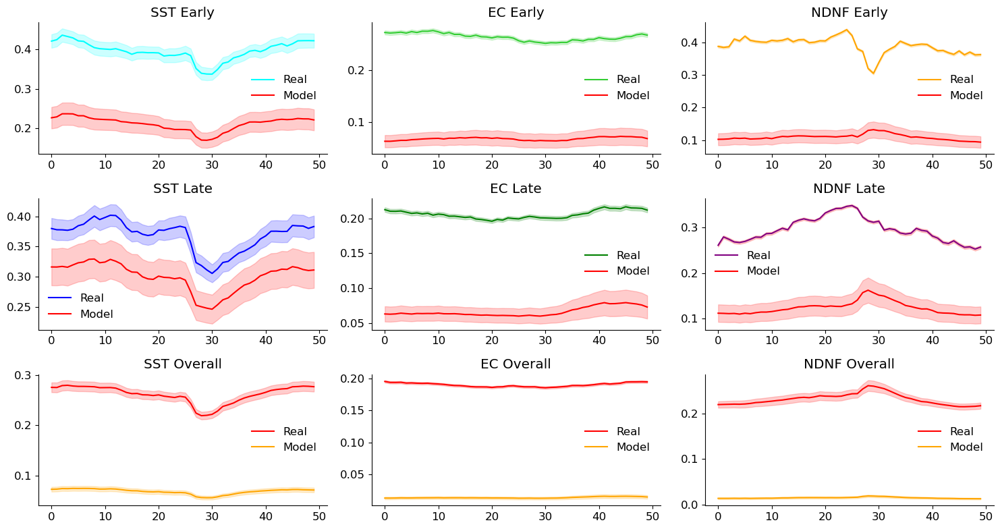

In [102]:
def min_max_my_data(array_data):
    norm_data = (array_data - np.min(array_data)) / (np.max(array_data) - np.min(array_data))
    return norm_data

def apply_activity_vs_model(cell_SST_model_ranks20_contig_x00, cell_EC_model_ranks20_contig_x00, cell_NDNF_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, trial_averaged_cell_array_early_NDNF_peak, trial_averaged_cell_array_late_NDNF_peak, trial_averaged_cell_array_early_EC_peak, trial_averaged_cell_array_late_EC_peak, full_activity_trial_av_array_EC_peak, full_activity_trial_av_array_NDNF_peak, full_activity_trial_av_array_SST_trough, residual_activity_dict_EC, residual_activity_dict_SST, fixed_residual_activity_dict_NDNF_new, min_max=True):
    early_array_SST, late_array_SST = get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00)
    early_array_EC, late_array_EC = get_early_vs_late_activity(cell_EC_model_ranks20_contig_x00)
    early_array_NDNF, late_array_NDNF = get_early_vs_late_activity(cell_NDNF_model_ranks20_contig_x00)

    fig, axs = plt.subplots(3,3, figsize=(15,8))
    
    
    if min_max:
        early_array_SST = min_max_my_data(early_array_SST)
        late_array_SST = min_max_my_data(late_array_SST)
        
        early_array_EC = min_max_my_data(early_array_EC)
        late_array_EC = min_max_my_data(late_array_EC)
        
        early_array_NDNF = min_max_my_data(early_array_NDNF)
        late_array_NDNF = min_max_my_data(late_array_NDNF)
        
        trial_averaged_cell_array_early_SST_trough = min_max_my_data(trial_averaged_cell_array_early_SST_trough)
        trial_averaged_cell_array_late_SST_trough = min_max_my_data(trial_averaged_cell_array_late_SST_trough)
        
        trial_averaged_cell_array_early_EC_peak = min_max_my_data(trial_averaged_cell_array_early_EC_peak)
        trial_averaged_cell_array_late_EC_peak = min_max_my_data(trial_averaged_cell_array_late_EC_peak)
        
        trial_averaged_cell_array_early_NDNF_peak = min_max_my_data(trial_averaged_cell_array_early_NDNF_peak)
        trial_averaged_cell_array_late_NDNF_peak = min_max_my_data(trial_averaged_cell_array_late_NDNF_peak)
        

    mean_early_array_SST = np.mean(early_array_SST, axis=0)
    sem_early_array_SST = sem(early_array_SST, axis=0)
    mean_late_array_SST = np.mean(late_array_SST, axis=0)
    sem_early_array_SST = sem(late_array_SST, axis=0)

    mean_SST_early_model = np.mean(trial_averaged_cell_array_early_SST_trough, axis=0)
    sem_SST_early = sem(trial_averaged_cell_array_early_SST_trough, axis=0)
    mean_SST_late_model = np.mean(trial_averaged_cell_array_late_SST_trough, axis=0)
    sem_SST_late = sem(trial_averaged_cell_array_late_SST_trough, axis=0)


    axs[0,0].plot(mean_early_array_SST, color='cyan', label="Real")
    axs[0,0].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')
    axs[0,0].plot(mean_SST_early_model, label="Model", color='r')
    axs[0,0].fill_between(range(len(mean_SST_early_model)), mean_SST_early_model+sem_SST_early, mean_SST_early_model-sem_SST_early, alpha=0.2, color='r')
    axs[0,0].set_title("SST Early")
    axs[0,0].legend()

    axs[1,0].plot(mean_late_array_SST, color='b', label="Real")
    axs[1,0].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
    axs[1,0].plot(mean_SST_late_model, label="Model", color='r')
    axs[1,0].fill_between(range(len(mean_SST_late_model)), mean_SST_late_model+sem_SST_late, mean_SST_late_model-sem_SST_late, alpha=0.2, color='r')
    axs[1,0].set_title("SST Late")
    axs[1,0].legend()


    mean_early_array_EC = np.mean(early_array_EC, axis=0)
    sem_early_array_EC = sem(early_array_EC, axis=0)
    mean_late_array_EC = np.mean(late_array_EC, axis=0)
    sem_late_array_EC = sem(late_array_EC, axis=0)

    mean_EC_early_model = np.mean(trial_averaged_cell_array_early_EC_peak, axis=0)
    sem_EC_early = sem(trial_averaged_cell_array_early_EC_peak, axis=0)
    mean_EC_late_model = np.mean(trial_averaged_cell_array_late_EC_peak, axis=0)
    sem_EC_late = sem(trial_averaged_cell_array_late_EC_peak, axis=0)


    axs[0,1].plot(mean_early_array_EC, color='limegreen', label='Real')
    axs[0,1].fill_between(range(len(mean_early_array_EC)), mean_early_array_EC+sem_early_array_EC, mean_early_array_EC-sem_early_array_EC, alpha=0.2, color='limegreen')
    axs[0,1].plot(mean_EC_early_model, label="Model", color='r')
    axs[0,1].fill_between(range(len(mean_EC_early_model)), mean_EC_early_model+sem_EC_early, mean_EC_early_model-sem_EC_early, alpha=0.2, color='r')
    axs[0,1].set_title("EC Early")
    axs[0,1].legend()

    axs[1,1].plot(mean_late_array_EC, color='green', label="Real")
    axs[1,1].fill_between(range(len(mean_late_array_EC)), mean_late_array_EC+sem_late_array_EC, mean_late_array_EC-sem_late_array_EC, alpha=0.2, color='green')
    axs[1,1].plot(mean_EC_late_model, label="Model", color='r')
    axs[1,1].fill_between(range(len(mean_EC_late_model)), mean_EC_late_model+sem_EC_late, mean_EC_late_model-sem_EC_late, alpha=0.2, color='r')
    axs[1,1].set_title("EC Late")
    axs[1,1].legend()


    mean_early_array_NDNF = np.mean(early_array_NDNF, axis=0)
    sem_early_array_NDNF = sem(early_array_NDNF, axis=0)
    mean_late_array_NDNF = np.mean(late_array_NDNF, axis=0)
    sem_late_array_NDNF = sem(late_array_NDNF, axis=0)

    mean_NDNF_early_model = np.mean(trial_averaged_cell_array_early_NDNF_peak, axis=0)
    sem_NDNF_early = sem(trial_averaged_cell_array_early_NDNF_peak, axis=0)
    mean_NDNF_late_model = np.mean(trial_averaged_cell_array_late_NDNF_peak, axis=0)
    sem_NDNF_late = sem(trial_averaged_cell_array_late_NDNF_peak, axis=0)


    axs[0,2].plot(mean_early_array_NDNF, label="Real", color='orange')
    axs[0,2].fill_between(range(len(mean_early_array_NDNF)), mean_early_array_NDNF+sem_early_array_EC, mean_early_array_NDNF-sem_early_array_EC, alpha=0.2, color='orange')
    axs[0,2].plot(mean_NDNF_early_model, label="Model", color='r')
    axs[0,2].fill_between(range(len(mean_NDNF_early_model)), mean_NDNF_early_model+sem_NDNF_early, mean_NDNF_early_model-sem_NDNF_early, alpha=0.2, color='r')
    axs[0,2].set_title("NDNF Early")
    axs[0,2].legend()

    axs[1,2].plot(mean_late_array_NDNF, label="Real", color='purple')
    axs[1,2].fill_between(range(len(mean_late_array_NDNF)), mean_late_array_NDNF+sem_late_array_EC, mean_late_array_NDNF-sem_late_array_EC, alpha=0.2, color='r')
    axs[1,2].plot(mean_NDNF_late_model, label="Model", color='r')
    axs[1,2].fill_between(range(len(mean_NDNF_late_model)), mean_NDNF_late_model+sem_NDNF_late, mean_NDNF_late_model-sem_NDNF_late, alpha=0.2, color='r')
    axs[1,2].set_title("NDNF Late")
    axs[1,2].legend()



    mean_model_overall_EC = np.mean(full_activity_trial_av_array_EC_peak, axis=0)
    sem_model_overall_EC = sem(full_activity_trial_av_array_EC_peak, axis=0)
    mean_model_overall_SST = np.mean(full_activity_trial_av_array_SST_trough, axis=0)
    sem_model_overall_SST = sem(full_activity_trial_av_array_SST_trough, axis=0)
    mean_model_overall_NDNF = np.mean(full_activity_trial_av_array_NDNF_peak, axis=0)
    sem_model_overall_NDNF = sem(full_activity_trial_av_array_NDNF_peak, axis=0)

    real_overall_EC_array = get_min_max_raw_data(residual_activity_dict_EC)
    mean_real_overall_EC_array = np.mean(real_overall_EC_array, axis=0)
    sem_real_overall_EC_array = sem(real_overall_EC_array, axis=0)

    real_overall_SST_array = get_min_max_raw_data(residual_activity_dict_SST)
    mean_real_overall_SST_array = np.mean(real_overall_SST_array, axis=0)
    sem_real_overall_SST_array = sem(real_overall_SST_array, axis=0)

    real_overall_NDNF_array = get_min_max_raw_data(fixed_residual_activity_dict_NDNF_new)
    mean_real_overall_NDNF_array = np.mean(real_overall_NDNF_array, axis=0)
    sem_real_overall_NDNF_array = sem(real_overall_NDNF_array, axis=0)

    axs[2,0].plot(mean_real_overall_SST_array, label="Real", color='r')
    axs[2,0].fill_between(range(len(mean_real_overall_SST_array)), mean_real_overall_SST_array+sem_real_overall_SST_array, mean_real_overall_SST_array-sem_real_overall_SST_array, alpha=0.2, color='r')
    axs[2,0].plot(mean_model_overall_SST, label="Model", color='orange')
    axs[2,0].fill_between(range(len(mean_model_overall_SST)), mean_model_overall_SST+sem_model_overall_SST, mean_model_overall_SST-sem_model_overall_SST, alpha=0.2, color='orange')
    axs[2,0].set_title("SST Overall")
    axs[2,0].legend()

    axs[2,1].plot(mean_real_overall_EC_array, label="Real", color='r')
    axs[2,1].fill_between(range(len(mean_real_overall_EC_array)), mean_real_overall_EC_array+sem_real_overall_EC_array, mean_real_overall_EC_array-sem_real_overall_EC_array, alpha=0.2, color='r')
    axs[2,1].plot(mean_model_overall_EC, label="Model", color='orange')
    axs[2,1].fill_between(range(len(mean_model_overall_EC)), mean_model_overall_EC+sem_model_overall_EC, mean_model_overall_EC-sem_model_overall_EC, alpha=0.2, color='orange')
    axs[2,1].set_title("EC Overall")
    axs[2,1].legend()

    axs[2,2].plot(mean_real_overall_NDNF_array, label="Real", color='r')
    axs[2,2].fill_between(range(len(mean_real_overall_NDNF_array)), mean_real_overall_NDNF_array+sem_real_overall_NDNF_array, mean_real_overall_NDNF_array-sem_real_overall_NDNF_array, alpha=0.2, color='r')
    axs[2,2].plot(mean_model_overall_NDNF, label="Model", color='orange')
    axs[2,2].fill_between(range(len(mean_model_overall_NDNF)), mean_model_overall_NDNF+sem_model_overall_NDNF, mean_model_overall_NDNF-sem_model_overall_NDNF, alpha=0.2, color='orange')
    axs[2,2].set_title("NDNF Overall")
    axs[2,2].legend()


    plt.tight_layout()
    plt.show()

apply_activity_vs_model(cell_SST_model_ranks20_contig_x00, cell_EC_model_ranks20_contig_x00, cell_NDNF_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, trial_averaged_cell_array_early_NDNF_peak, trial_averaged_cell_array_late_NDNF_peak, trial_averaged_cell_array_early_EC_peak, trial_averaged_cell_array_late_EC_peak, full_activity_trial_av_array_EC_peak, full_activity_trial_av_array_NDNF_peak, full_activity_trial_av_array_SST_trough, residual_activity_dict_EC, residual_activity_dict_SST, fixed_residual_activity_dict_NDNF_new, min_max=True)
    

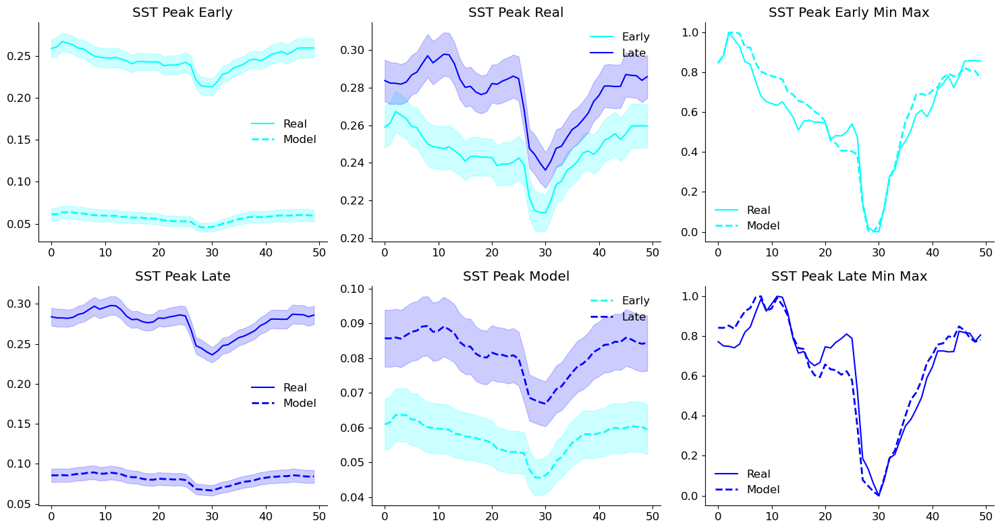

In [141]:
def min_max_my_data(array_data):
    norm_data = (array_data - np.min(array_data)) / (np.max(array_data) - np.min(array_data))
    return norm_data

def compare_within_subtype(cell_SST_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough, residual_activity_dict_SST, cell_type="SST Peak"):
    early_array_SST, late_array_SST = get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00)
   
    fig, axs = plt.subplots(2,3, figsize=(15,8))
    
    
    
    early_array_SST_min_max = min_max_my_data(early_array_SST)
    late_array_SST_min_max = min_max_my_data(late_array_SST)

        
    trial_averaged_cell_array_early_SST_trough_min_max = min_max_my_data(trial_averaged_cell_array_early_SST_trough)
    trial_averaged_cell_array_late_SST_trough_min_max = min_max_my_data(trial_averaged_cell_array_late_SST_trough)
        
    mean_early_array_SST = np.mean(early_array_SST, axis=0)
    sem_early_array_SST = sem(early_array_SST, axis=0)
    mean_late_array_SST = np.mean(late_array_SST, axis=0)
    sem_early_array_SST = sem(late_array_SST, axis=0)
    
#     mean_early_array_SST_min_max = np.mean(early_array_SST_min_max, axis=0)
#     sem_early_array_SST_min_max = sem(early_array_SST_min_max, axis=0)
#     mean_late_array_SST_min_max = np.mean(late_array_SST_min_max, axis=0)
#     sem_late_array_SST_min_max = sem(late_array_SST_min_max, axis=0)
    
    mean_early_array_SST_min_max = min_max_my_data(mean_early_array_SST)
    sem_early_array_SST_min_max = min_max_my_data(sem_early_array_SST)
    mean_late_array_SST_min_max = min_max_my_data(mean_late_array_SST)
    sem_late_array_SST_min_max = min_max_my_data(sem_early_array_SST)

    mean_SST_early_model = np.mean(trial_averaged_cell_array_early_SST_trough, axis=0)
    sem_SST_early_model = sem(trial_averaged_cell_array_early_SST_trough, axis=0)
    mean_SST_late_model = np.mean(trial_averaged_cell_array_late_SST_trough, axis=0)
    sem_SST_late_model = sem(trial_averaged_cell_array_late_SST_trough, axis=0)
    
#     mean_SST_early_model_min_max = np.mean(trial_averaged_cell_array_early_SST_trough_min_max, axis=0)
#     sem_SST_early_model_min_max = sem(trial_averaged_cell_array_early_SST_trough_min_max, axis=0)
#     mean_SST_late_model_min_max = np.mean(trial_averaged_cell_array_late_SST_trough_min_max, axis=0)
#     sem_SST_late_model_min_max = sem(trial_averaged_cell_array_late_SST_trough_min_max, axis=0)
    
    mean_SST_early_model_min_max = min_max_my_data(mean_SST_early_model)
    sem_SST_early_model_min_max = min_max_my_data(sem_SST_early_model)
    mean_SST_late_model_min_max = min_max_my_data(mean_SST_late_model)
    sem_SST_late_model_min_max = min_max_my_data(sem_SST_late_model)


    axs[0,0].plot(mean_early_array_SST, color='cyan', label="Real")
    axs[0,0].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')
    axs[0,0].plot(mean_SST_early_model, label="Model", color='cyan', linestyle="--", linewidth=2)
    axs[0,0].fill_between(range(len(mean_SST_early_model)), mean_SST_early_model+sem_SST_early_model, mean_SST_early_model-sem_SST_early_model, alpha=0.2, color='cyan')
    axs[0,0].set_title(f"{cell_type} Early")
    axs[0,0].legend()

    axs[1,0].plot(mean_late_array_SST, color='b', label="Real")
    axs[1,0].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
    axs[1,0].plot(mean_SST_late_model, label="Model", color='b', linestyle="--", linewidth=2)
    axs[1,0].fill_between(range(len(mean_SST_late_model)), mean_SST_late_model+sem_SST_late_model, mean_SST_late_model-sem_SST_late_model, alpha=0.2, color='b')
    axs[1,0].set_title(f"{cell_type} Late")
    axs[1,0].legend()
    
    axs[0,1].plot(mean_early_array_SST, color='cyan', label="Early")
    axs[0,1].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')
    axs[0,1].plot(mean_late_array_SST, color='b', label="Late")
    axs[0,1].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
    axs[0,1].set_title(f"{cell_type} Real")
    axs[0,1].legend()

    axs[1,1].plot(mean_SST_early_model, label="Early", color='cyan', linestyle="--", linewidth=2)
    axs[1,1].fill_between(range(len(mean_SST_early_model)), mean_SST_early_model+sem_SST_early_model, mean_SST_early_model-sem_SST_early_model, alpha=0.2, color='cyan')
    axs[1,1].plot(mean_SST_late_model, label="Late", color='b', linestyle="--", linewidth=2)
    axs[1,1].fill_between(range(len(mean_SST_late_model)), mean_SST_late_model+sem_SST_late_model, mean_SST_late_model-sem_SST_late_model, alpha=0.2, color='b')
    axs[1,1].set_title(f"{cell_type} Model")
    axs[1,1].legend()
    
    axs[0,2].plot(mean_early_array_SST_min_max, color='cyan', label="Real")
#     axs[0,2].fill_between(range(len(mean_early_array_SST_min_max)), mean_early_array_SST_min_max+sem_early_array_SST_min_max, mean_early_array_SST_min_max-sem_early_array_SST_min_max, alpha=0.2, color='cyan')
    axs[0,2].plot(mean_SST_early_model_min_max, label="Model", color='cyan', linestyle='--', linewidth=2)
#     axs[0,2].fill_between(range(len(mean_SST_early_model_min_max)), mean_SST_early_model_min_max+sem_SST_early_model_min_max, mean_SST_early_model_min_max-sem_SST_early_model_min_max, alpha=0.2, color='cyan')
    axs[0,2].set_title(f"{cell_type} Early Min Max")
    axs[0,2].legend()
    
    axs[1,2].plot(mean_late_array_SST_min_max, color='b', label="Real")
#     axs[1,2].fill_between(range(len(mean_late_array_SST_min_max)), mean_late_array_SST_min_max+sem_late_array_SST_min_max, mean_late_array_SST_min_max-sem_late_array_SST_min_max, alpha=0.2, color='b')
    axs[1,2].plot(mean_SST_late_model_min_max, label="Model", color='b', linestyle='--', linewidth=2)
#     axs[1,2].fill_between(range(len(mean_SST_late_model_min_max)), mean_SST_late_model_min_max+sem_SST_late_model_min_max, mean_SST_late_model_min_max-sem_SST_late_model_min_max, alpha=0.2, color='b')
    axs[1,2].set_title(f"{cell_type} Late Min Max")
    axs[1,2].legend()
    
    plt.tight_layout()
    plt.show()
    
compare_within_subtype(cell_SST_model_ranks20_contig_x00, trial_averaged_cell_array_early_SST_trough, trial_averaged_cell_array_late_SST_trough, full_activity_trial_av_array_SST_trough, residual_activity_dict_SST, cell_type="SST Peak")
    


In [ ]:
axs[2,0].plot(mean_real_overall_SST_array, label="Real", color='r')
axs[2,0].fill_between(range(len(mean_real_overall_SST_array)), mean_real_overall_SST_array+sem_real_overall_SST_array, mean_real_overall_SST_array-sem_real_overall_SST_array, alpha=0.2, color='r')
axs[2,0].plot(mean_model_overall_SST, label="Model", color='orange')
axs[2,0].fill_between(range(len(mean_model_overall_SST)), mean_model_overall_SST+sem_model_overall_SST, mean_model_overall_SST-sem_model_overall_SST, alpha=0.2, color='orange')
axs[2,0].set_title("SST Overall")
axs[2,0].legend()

In [78]:
compare_model_overall(residual_activity_dict_EC, full_activity_trial_av_array_EC_peak, "EC Peak")

NameError: name 'full_activity_trial_av_array_EC_peak' is not defined

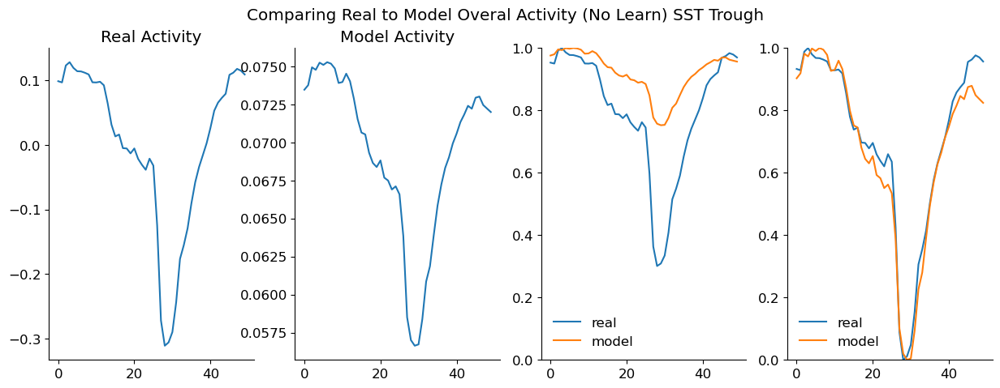

In [84]:
compare_model_overall(residual_activity_dict_SST, full_activity_trial_av_array_SST_trough, "SST Trough")

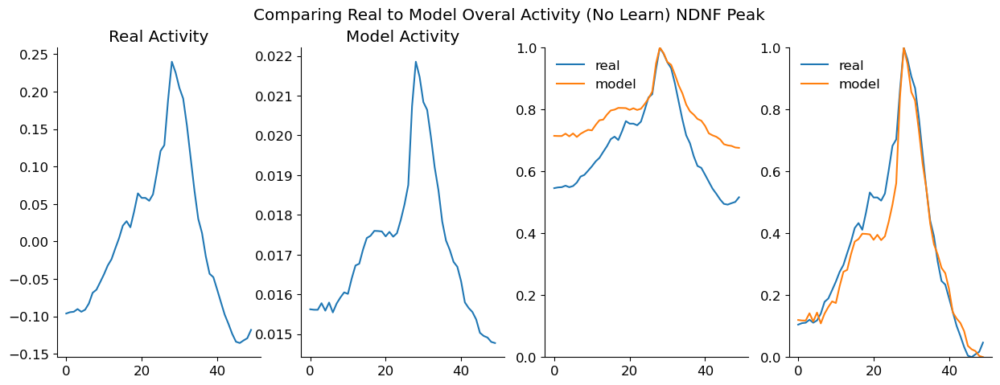

In [85]:
compare_model_overall(fixed_residual_activity_dict_NDNF_new, full_activity_trial_av_array_NDNF_peak, "NDNF Peak")

In [76]:
compare_model_overall(fixed_residual_activity_dict_EC_new, full_activity_trial_av_array_EC_trough, "EC Trough")

NameError: name 'compare_model_overall' is not defined

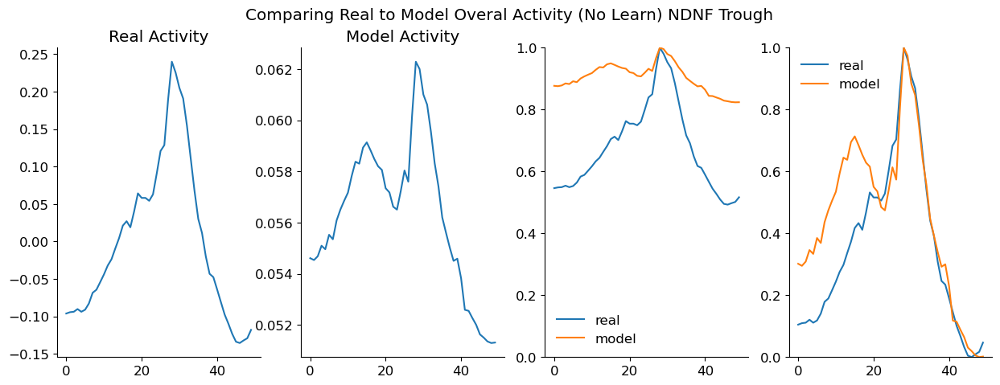

In [89]:
compare_model_overall(fixed_residual_activity_dict_NDNF_new, full_activity_trial_av_array_NDNF_trough, "NDNF Trough")

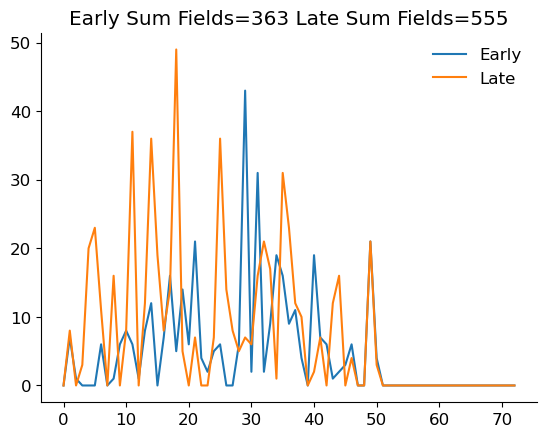

In [116]:
#PLOT THE FULL CELL 

# for i in range(10):
#     plt.imshow(full_activity_list_SST_trough[i].T, aspect='auto')
#     plt.title(f"Cell {i}")
#     plt.ylabel("Trials")
#     plt.xlabel("Position Bins")
#     plt.show()
    
#PLOT THE INDIVIDUAL TRIAL TRACES

counter_list_early= []
for i in range(len(model_cell_list_NDNF_peak_early)): 
    per_cell_count = 0
    for j in range(model_cell_list_NDNF_peak_early[i].shape[1]):
        data = model_cell_list_NDNF_peak_early[i][:,j]
        if np.any(data):
            per_cell_count +=1
            
    counter_list_early.append(per_cell_count)
    
    
counter_list_late= []
for i in range(len(model_cell_list_NDNF_peak_late)): 
    per_cell_count = 0
    for j in range(model_cell_list_NDNF_peak_late[i].shape[1]):
        data = model_cell_list_NDNF_peak_late[i][:,j]
        if np.any(data):
            per_cell_count +=1
            
    counter_list_late.append(per_cell_count)
    
plt.plot(counter_list_early, label='Early')
plt.plot(counter_list_late, label='Late')
plt.legend()
plt.title(f"Early Sum Fields={np.sum(counter_list_early)} Late Sum Fields={np.sum(counter_list_late)}")
plt.show()
    

#PLOT THE AVERAGE OF THE TRACES 


# early_trials = full_activity_list_SST_trough[2][:,:99]
# late_trials = full_activity_list_SST_trough[2][:,100:] 
     
# mean_early = np.mean(early_trials, axis=1)
# mean_late  = np.mean(late_trials, axis=1)
        
# plt.plot(mean_early, label='early')
# plt.plot(mean_late, label='late')
# plt.legend()
# plt.show()


In [87]:
def get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00):

    data_early_list = []
    data_late_list = []

    for animal in cell_SST_model_ranks20_contig_x00[20]:
        for cell in cell_SST_model_ranks20_contig_x00[20][animal]:
            data_early = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f'cell_{cell}']["cluster_trial_mean_dict"]["clusters_chosen_3"][0]
            data_early_list.append(data_early)
            data_late = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f'cell_{cell}']["cluster_trial_mean_dict"]["clusters_chosen_3"][2]
            data_late_list.append(data_late)

    data_early_array = np.array(data_early_list)
    data_late_array = np.array(data_late_list)
    
    return data_early_array, data_late_array

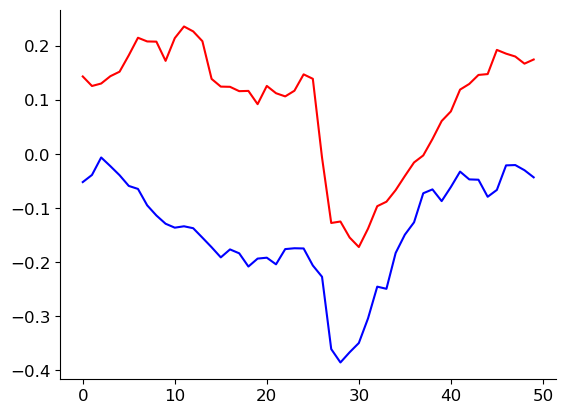

In [479]:
listy_early = []
listy_late = []

for animal in residual_activity_dict_SST:
    for cell in residual_activity_dict_SST[animal]:
        data = residual_activity_dict_SST[animal][cell]  # (bins, trials)
        num_trials = data.shape[1]
        quintile = num_trials // 5

        data_early = data[:, :quintile]       # first 20%
        data_late  = data[:, -quintile:]      # last 20%

        listy_early.append(np.mean(data_early, axis=1))  # mean across trials
        listy_late.append(np.mean(data_late, axis=1))

array_early = np.array(listy_early)  # shape (cells, bins)
array_late  = np.array(listy_late)

mean_early = np.mean(array_early, axis=0)
mean_late  = np.mean(array_late, axis=0)

plt.plot(mean_early, color='b')
plt.plot(mean_late, color='r')
plt.show()

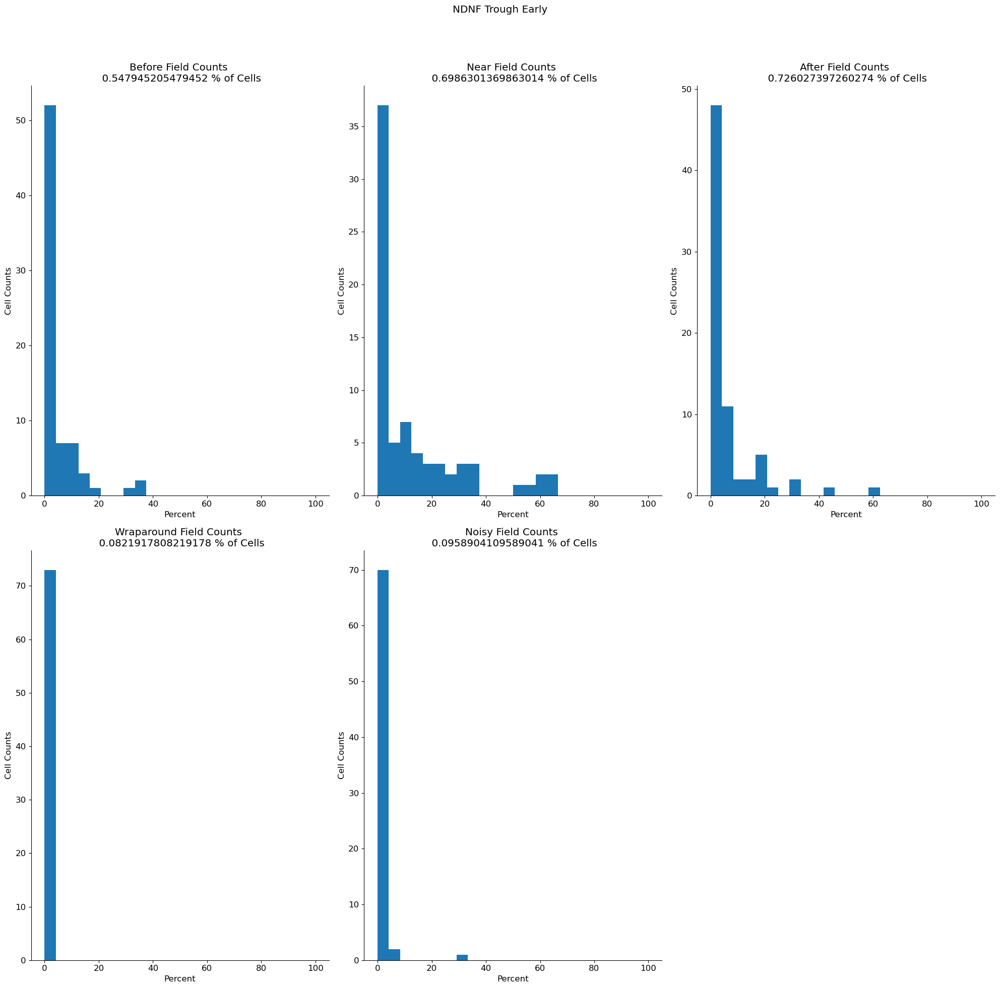

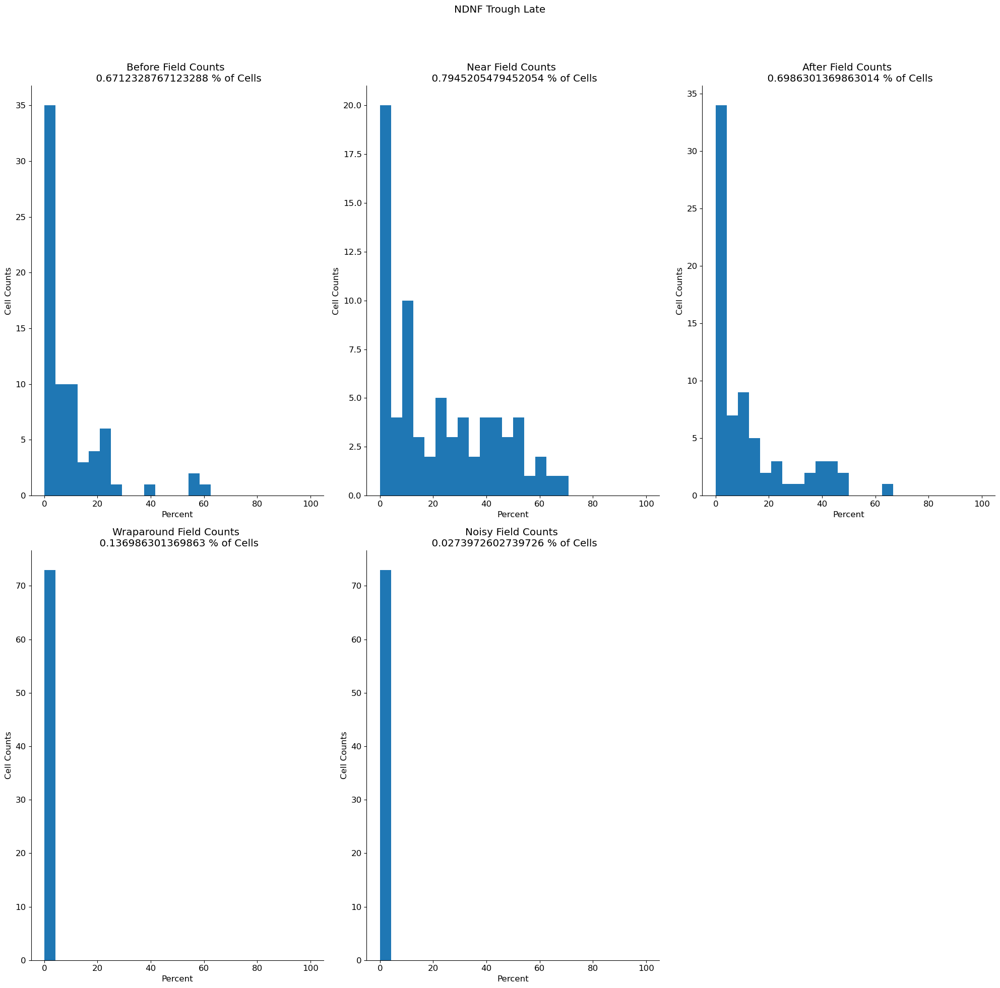

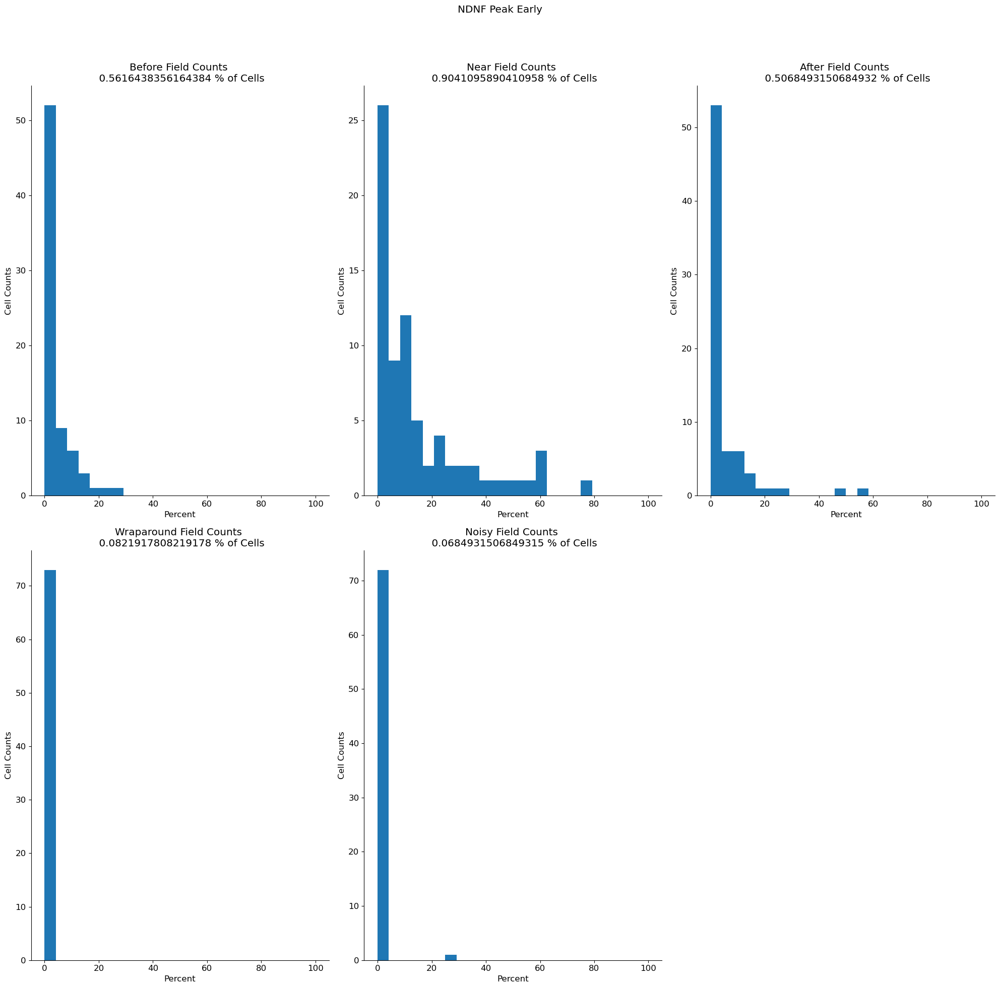

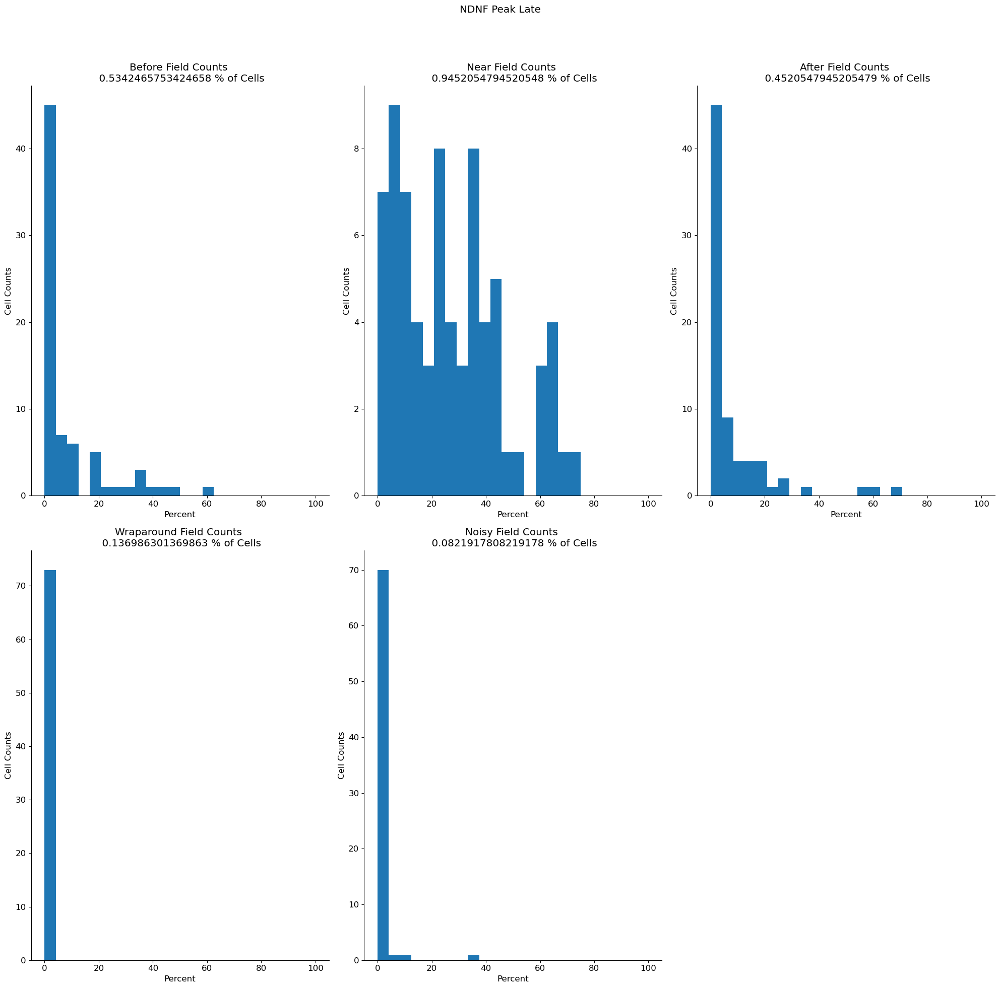

In [280]:
def plot_percent_peak_trough(percent_lists_SST_early_trough, overall_animal_cluster_trial_averages_EC_peak, percent_of_cells, suptitle="SST Trough Early"):
    fig, axs = plt.subplots(2, 3, figsize = (20, 20))
    plt.suptitle(suptitle)
    bins = np.linspace(0, 100, 25)
    
#     percent_of_cells = get_cluster_expresion_percent_of_cells(overall_animal_cluster_trial_averages_EC_peak)

    before_percent_array = np.array(percent_lists_SST_early_trough[0])
    axs[0, 0].hist(before_percent_array, bins=bins)
    axs[0, 0].set_title(f"Before Field Counts \n {percent_of_cells[0]} % of Cells")
    axs[0, 0].set_ylabel("Cell Counts")
    axs[0, 0].set_xlabel("Percent")

    near_percent_array = np.array(percent_lists_SST_early_trough[1])
    axs[0, 1].hist(near_percent_array, bins=bins)
    axs[0, 1].set_title(f"Near Field Counts \n {percent_of_cells[1]} % of Cells")
    axs[0, 1].set_ylabel("Cell Counts")
    axs[0, 1].set_xlabel("Percent")

    after_percent_array = np.array(percent_lists_SST_early_trough[2])
    axs[0, 2].hist(after_percent_array, bins=bins)
    axs[0, 2].set_title(f"After Field Counts \n {percent_of_cells[2]} % of Cells")
    axs[0, 2].set_ylabel("Cell Counts")
    axs[0, 2].set_xlabel("Percent")


    wraparound_percent_array = np.array(percent_lists_SST_early_trough[3])
    axs[1, 0].hist(wraparound_percent_array, bins=bins)
    axs[1, 0].set_title(f"Wraparound Field Counts \n {percent_of_cells[3]} % of Cells")
    axs[1, 0].set_ylabel("Cell Counts")
    axs[1, 0].set_xlabel("Percent")

    bins = np.linspace(0, 100, 25)
    noisy_percent_array = np.array(percent_lists_SST_early_trough[4])
    axs[1, 1].hist(noisy_percent_array, bins=bins)
    axs[1, 1].set_title(f"Noisy Field Counts \n {percent_of_cells[4]} % of Cells")
    axs[1, 1].set_ylabel("Cell Counts")
    axs[1, 1].set_xlabel("Percent")

    axs[1, 2].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # [left, bottom, right, top]
    plt.show()
    
plot_percent_peak_trough(percent_lists_NDNF_early_trough, overall_animal_cluster_trial_averages_NDNF_overall_early, percent_of_cells_list_NDNF_early_trough, suptitle="NDNF Trough Early")
plot_percent_peak_trough(percent_lists_NDNF_late_trough, overall_animal_cluster_trial_averages_NDNF_overall_late, percent_of_cells_list_NDNF_late_trough, suptitle="NDNF Trough Late")

plot_percent_peak_trough(percent_lists_NDNF_early_peak, overall_animal_cluster_trial_averages_NDNF_overall_early, percent_of_cells_list_NDNF_early_peak, suptitle="NDNF Peak Early")
plot_percent_peak_trough(percent_lists_NDNF_late_peak, overall_animal_cluster_trial_averages_NDNF_overall_late, percent_of_cells_list_NDNF_late_peak, suptitle="NDNF Peak Late")

In [52]:
import numpy as np

def generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0):
    """
    Generate a Gaussian array of given length, peaking at `peak_position`.

    Parameters:
    - length: total number of bins (default 50)
    - peak_position: where the Gaussian peaks (can be float)
    - std: standard deviation of the Gaussian
    - amplitude: height of the peak

    Returns:
    - 1D numpy array of shape (length,)
    """
    x = np.arange(length)
    gaussian = amplitude * np.exp(-0.5 * ((x - peak_position) / std) ** 2)
    return gaussian


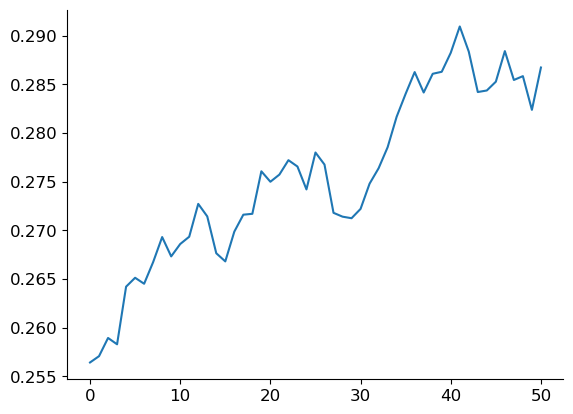

In [64]:
import random

def random_timeseries(initial_value: float, volatility: float, count: int):
    time_series = [initial_value, ]
    for _ in range(count):
        time_series.append(time_series[-1] + initial_value * random.gauss(0, 1) * volatility)
    return time_series


t = random_timeseries(initial_value=0.2564102564102564, volatility=0.01, count=50)
    
plt.plot(t)
plt.show()

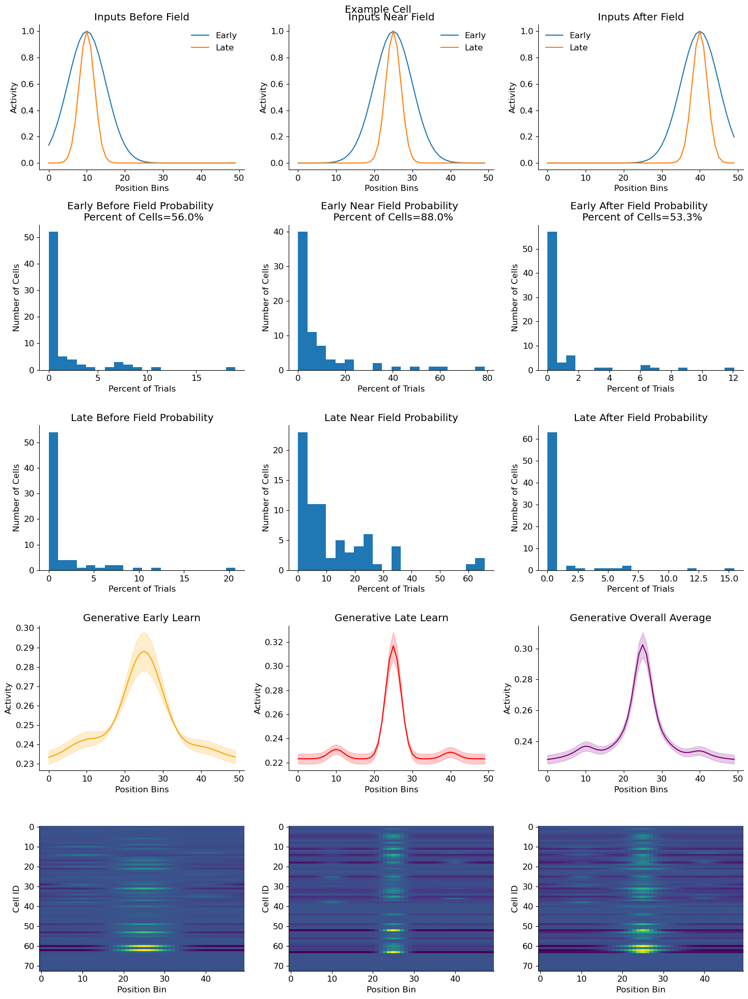

In [119]:



def reconstruct_activity_from_clusters(example_before_field_early, example_near_field_early, example_after_field_early, example_before_field_late, example_near_field_late, example_after_field_late, noisy_field_array_early, noisy_field_array_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST Trough", plot=False):
    
    example_noisy_field_array_early = np.mean(noisy_field_array_early)
    example_noisy_field_array_late = np.mean(noisy_field_array_late)
    
    
    before_percent_array = np.array(percent_lists_NDNF_early_peak[0])
    sum_before = np.sum(before_percent_array)
    near_percent_array = np.array(percent_lists_NDNF_early_peak[1])
    sum_near = np.sum(near_percent_array)
    after_percent_array = np.array(percent_lists_NDNF_early_peak[2])
    sum_after = np.sum(after_percent_array)
    noisy_percent_array = np.array(percent_lists_NDNF_early_peak[4])
    sum_after = np.sum(after_percent_array)

    before_percent_array_late = np.array(percent_lists_NDNF_late_peak[0])
    sum_before_late = np.sum(before_percent_array_late)
    near_percent_array_late = np.array(percent_lists_NDNF_late_peak[1])
    sum_near_late = np.sum(near_percent_array_late)
    after_percent_array_late = np.array(percent_lists_NDNF_late_peak[2])
    sum_after_late = np.sum(after_percent_array_late)
    noisy_percent_array = np.array(percent_lists_NDNF_early_peak[4])
    sum_after = np.sum(after_percent_array)
    
#     print(f"before_percent_array {sum_before} before_percent_array_late {sum_before_late}")
#     print(f"near_percent_array {sum_near} before_percent_array_late {sum_near_late}")
#     print(f"before_percent_array {sum_after} before_percent_array_late {sum_after_late}")
#     print(f"overall_early {np.sum([sum_before, sum_near, sum_after])} overall_late {np.sum([sum_before_late, sum_near_late, sum_after_late])}")


    trial_averaged_cell_list_early = []
    trial_averaged_cell_list_late = []

    cell_list_early = []
    cell_list_late = []
    
    available_trials_before_early = percent_of_cells_list_SST_early_trough[0]*100
    available_trials_near_early = percent_of_cells_list_SST_early_trough[1]*100
    available_trials_after_early = percent_of_cells_list_SST_early_trough[2]*100

    available_trials_before_late = percent_of_cells_list_SST_late_trough[0]*100
    available_trials_near_late = percent_of_cells_list_SST_late_trough[1]*100
    available_trials_after_late = percent_of_cells_list_SST_late_trough[2]*100

    
    total_early = np.vstack([before_percent_array, near_percent_array, after_percent_array])
    mean_early = np.mean(total_early)
    total_late = np.vstack([before_percent_array_late, near_percent_array_late, after_percent_array_late])
    mean_late = np.mean(total_late)
    
    total_overall = np.vstack([before_percent_array, near_percent_array, after_percent_array, before_percent_array_late, near_percent_array_late, after_percent_array_late])
    mean_overall = np.mean(total_overall)
    
    for i in range(num_cells):
        rt_early = np.array(random_timeseries(initial_value=inits, volatility=vol, count=49))
        rt_late = np.array(random_timeseries(initial_value=inits, volatility=vol, count=49))
#         cell_array = np.zeros((50,100))
#         cell_array_late = np.zeros((50,100))
        cell_array = np.tile(rt_early[:, np.newaxis], (1,100))
        cell_array_late = np.tile(rt_late[:, np.newaxis], (1,100))
    

        # Only assign fields if this cell is allowed to express that field
        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before = np.random.choice(100, int(before_percent_array[i]), replace=False)
            for t in trial_indices_before:
                cell_array[:, t] = example_before_field_early

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near = np.random.choice(100, int(near_percent_array[i]), replace=False)
            for t in trial_indices_near:
                cell_array[:, t] = example_near_field_early

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after = np.random.choice(100, int(after_percent_array[i]), replace=False)
            for t in trial_indices_after:
                cell_array[:, t] = example_after_field_early

        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before_late = np.random.choice(100, int(before_percent_array_late[i]), replace=False)
            for t in trial_indices_before_late:
                cell_array_late[:, t] = example_before_field_late

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near_late = np.random.choice(100, int(near_percent_array_late[i]), replace=False)
            for t in trial_indices_near_late:
                cell_array_late[:, t] = example_near_field_late

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after_late = np.random.choice(100, int(after_percent_array_late[i]), replace=False)
            for t in trial_indices_after_late:
                cell_array_late[:, t] = example_after_field_late
                
        cell_list_early.append(cell_array)
        cell_list_late.append(cell_array_late)
        trial_averaged_cell_list_early.append(np.mean(cell_array, axis=1))
        trial_averaged_cell_list_late.append(np.mean(cell_array_late, axis=1))


    full_activity_list = []
    full_activity_trial_av_list = []

    for i in range(len(cell_list_early)):
        early_component = cell_list_early[i]
        late_component = cell_list_late[i]

        full_actiivty = np.concatenate([early_component, late_component], axis=1)

        full_activity_list.append(full_actiivty)

        full_activity_trial_av_list.append(np.mean(full_actiivty, axis=1))

    
    full_activity_trial_av_array = np.array(full_activity_trial_av_list)
    
    trial_averaged_cell_array_early = np.array(trial_averaged_cell_list_early)
    
    trial_averaged_cell_array_late = np.array(trial_averaged_cell_list_late)
    
    if plot: 
        fig, axs = plt.subplots(5, 3, figsize=(15,20))
        plt.suptitle(cell_type)


        axs[0,0].plot(example_before_field_early, label="Early")
        axs[0,0].plot(example_before_field_late, label="Late")
        axs[0,0].legend()
        axs[0,0].set_title("Inputs Before Field")
        axs[0,0].set_ylabel("Activity")
        axs[0,0].set_xlabel("Position Bins")
        axs[0,0].legend()


        axs[0,1].plot(example_near_field_early, label="Early")
        axs[0,1].plot(example_near_field_late, label="Late")
        axs[0,1].legend()
        axs[0,1].set_title("Inputs Near Field")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_xlabel("Position Bins")
        axs[0,1].legend()


        axs[0,2].plot(example_after_field_early, label="Early")
        axs[0,2].plot(example_after_field_late, label="Late")
        axs[0,2].legend()
        axs[0,2].set_title("Inputs After Field")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_xlabel("Position Bins")
        axs[0,2].legend()

        
        axs[1,0].hist(before_percent_array, bins=20)
        axs[1,0].set_title(f"Early Before Field Probability \n Percent of Cells={available_trials_before_early:.1f}%")
        axs[1,0].set_ylabel("Number of Cells")
        axs[1,0].set_xlabel("Percent of Trials")

        axs[1,1].hist(near_percent_array, bins=20)
        axs[1,1].set_title(f"Early Near Field Probability \n Percent of Cells={available_trials_near_early:.1f}%")
        axs[1,1].set_ylabel("Number of Cells")
        axs[1,1].set_xlabel("Percent of Trials")

        axs[1,2].hist(after_percent_array, bins=20)
        axs[1,2].set_title(f"Early After Field Probability \n Percent of Cells={available_trials_after_early:.1f}%")
        axs[1,2].set_ylabel("Number of Cells")
        axs[1,2].set_xlabel("Percent of Trials")

        axs[2,0].hist(before_percent_array_late, bins=20)
#         axs[2,0].set_title(f"Late Before Field Probability \n Percent of Cells={available_trials_before_late:.1f}%")
        axs[2,0].set_title("Late Before Field Probability")
        axs[2,0].set_ylabel("Number of Cells")
        axs[2,0].set_xlabel("Percent of Trials")

        axs[2,1].hist(near_percent_array_late, bins=20)
#         axs[2,1].set_title(f"Late Near Field Probability \n Percent of Cells={available_trials_near_late:.1f}%")
        axs[2,1].set_title("Late Near Field Probability")
        axs[2,1].set_ylabel("Number of Cells")
        axs[2,1].set_xlabel("Percent of Trials")

        axs[2,2].hist(after_percent_array_late, bins=20)
#         axs[2,2].set_title(f"Late After Field Probability \n Percent of Cells={available_trials_after_late:.1f}%")
        axs[2,2].set_title("Late After Field Probability")
        axs[2,2].set_ylabel("Number of Cells")
        axs[2,2].set_xlabel("Percent of Trials")

        axs[4,0].imshow(trial_averaged_cell_array_early, aspect='auto')
        axs[4,0].set_ylabel("Cell ID")
        axs[4,0].set_xlabel("Position Bin")

        means_early = np.mean(trial_averaged_cell_array_early, axis=0)
        sems_early = sem(trial_averaged_cell_array_early, axis=0)
        axs[3,0].plot(means_early, color='orange')
        axs[3,0].fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        axs[3,0].set_xlabel("Position Bins")
        axs[3,0].set_ylabel("Activity")
        axs[3,0].set_title("Generative Early Learn")

        axs[4,1].imshow(trial_averaged_cell_array_late, aspect='auto')
        axs[4,1].set_ylabel("Cell ID")
        axs[4,1].set_xlabel("Position Bin")

        means_late = np.mean(trial_averaged_cell_array_late, axis=0)
        sems_late = sem(trial_averaged_cell_array_late, axis=0)
        axs[3,1].plot(means_late, color='r')
        axs[3,1].fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        axs[3,1].set_xlabel("Position Bins")
        axs[3,1].set_ylabel("Activity")
        axs[3,1].set_title("Generative Late Learn")

        axs[4,2].imshow(full_activity_trial_av_array, aspect='auto')
        axs[4,2].set_ylabel("Cell ID")
        axs[4,2].set_xlabel("Position Bin")


        means_overall= np.mean(full_activity_trial_av_list, axis=0)
        sems_overall= sem(full_activity_trial_av_list, axis=0)
        axs[3,2].plot(means_overall, color='purple')
        axs[3,2].fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        axs[3,2].set_xlabel("Position Bins")
        axs[3,2].set_ylabel("Activity")
        axs[3,2].set_title("Generative Overall Average")

        plt.tight_layout()
        plt.show()


#         plt.plot(means_early, color='orange', label='Early')
#         plt.fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
#         plt.plot(means_late, color='r', label="Late")
#         plt.fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
#         plt.plot(means_overall, color='purple', label='Overall')
#         plt.fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
#         plt.ylabel("Activity")
#         plt.xlabel("Position Bins")
#         plt.title(cell_type)
#         plt.legend()
#         plt.show()
        
        
    else:
        return cell_list_early, cell_list_late, full_activity_list, trial_averaged_cell_array_early, trial_averaged_cell_array_late, full_activity_trial_av_array

    
example_before_field = generate_gaussian(length=50, peak_position=10, std=5, amplitude=1.0)
example_near_field = generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0)
example_after_field = generate_gaussian(length=50, peak_position=40, std=5, amplitude=1.0)


example_before_field_late = generate_gaussian(length=50, peak_position=10, std=2, amplitude=1.0)
example_near_field_late = generate_gaussian(length=50, peak_position=25, std=2, amplitude=1.0)
example_after_field_late = generate_gaussian(length=50, peak_position=40, std=2, amplitude=1.0)

    
reconstruct_activity_from_clusters(example_before_field, example_near_field, example_after_field, example_before_field_late, example_near_field_late, example_after_field_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits = 0.25, vol=0.001, num_cells=73, cell_type="Example Cell", plot=True)


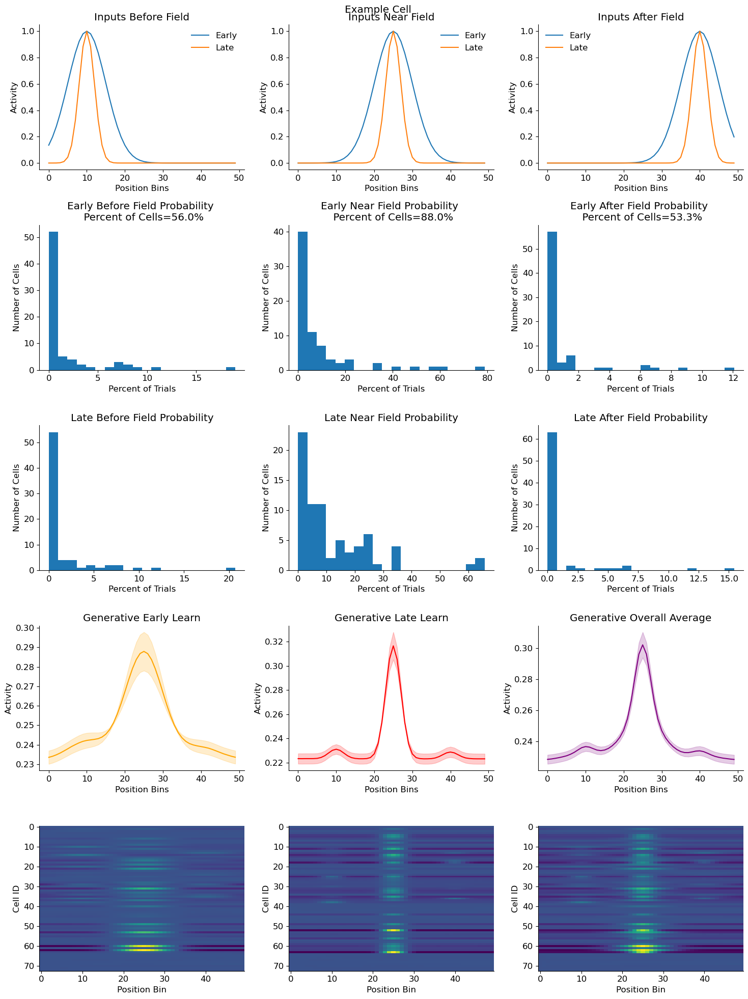

In [280]:



def reconstruct_activity_from_clusters(example_before_field_early, example_near_field_early, example_after_field_early, example_before_field_late, example_near_field_late, example_after_field_late, noisy_field_array_early, noisy_field_array_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits, vol, num_cells=73, cell_type="SST Trough", plot=False):
    
    example_noisy_field_array_early = np.mean(noisy_field_array_early, axis=0)
    example_noisy_field_array_late = np.mean(noisy_field_array_late, axis=0)
    
    
    before_percent_array = np.array(percent_lists_NDNF_early_peak[0])
    sum_before = np.sum(before_percent_array)
    near_percent_array = np.array(percent_lists_NDNF_early_peak[1])
    sum_near = np.sum(near_percent_array)
    after_percent_array = np.array(percent_lists_NDNF_early_peak[2])
    sum_after = np.sum(after_percent_array)
    noisy_percent_array = np.array(percent_lists_NDNF_early_peak[4])
    sum_after = np.sum(after_percent_array)

    before_percent_array_late = np.array(percent_lists_NDNF_late_peak[0])
    sum_before_late = np.sum(before_percent_array_late)
    near_percent_array_late = np.array(percent_lists_NDNF_late_peak[1])
    sum_near_late = np.sum(near_percent_array_late)
    after_percent_array_late = np.array(percent_lists_NDNF_late_peak[2])
    sum_after_late = np.sum(after_percent_array_late)
    noisy_percent_array = np.array(percent_lists_NDNF_early_peak[4])
    sum_after = np.sum(after_percent_array)
    
#     print(f"before_percent_array {sum_before} before_percent_array_late {sum_before_late}")
#     print(f"near_percent_array {sum_near} before_percent_array_late {sum_near_late}")
#     print(f"before_percent_array {sum_after} before_percent_array_late {sum_after_late}")
#     print(f"overall_early {np.sum([sum_before, sum_near, sum_after])} overall_late {np.sum([sum_before_late, sum_near_late, sum_after_late])}")


    trial_averaged_cell_list_early = []
    trial_averaged_cell_list_late = []

    cell_list_early = []
    cell_list_late = []
    
    available_trials_before_early = percent_of_cells_list_SST_early_trough[0]*100
    available_trials_near_early = percent_of_cells_list_SST_early_trough[1]*100
    available_trials_after_early = percent_of_cells_list_SST_early_trough[2]*100

    available_trials_before_late = percent_of_cells_list_SST_late_trough[0]*100
    available_trials_near_late = percent_of_cells_list_SST_late_trough[1]*100
    available_trials_after_late = percent_of_cells_list_SST_late_trough[2]*100

    
#     total_early = np.vstack([before_percent_array, near_percent_array, after_percent_array])
#     mean_early = np.mean(total_early)
#     total_late = np.vstack([before_percent_array_late, near_percent_array_late, after_percent_array_late])
#     mean_late = np.mean(total_late)
    
#     total_overall = np.vstack([before_percent_array, near_percent_array, after_percent_array, before_percent_array_late, near_percent_array_late, after_percent_array_late])
#     mean_overall = np.mean(total_overall)
    
    for i in range(num_cells):
        rt_early = np.array(random_timeseries(initial_value=inits, volatility=vol, count=49))
        rt_late = np.array(random_timeseries(initial_value=inits, volatility=vol, count=49))
#         cell_array = np.zeros((50,100))
#         cell_array_late = np.zeros((50,100))

#         cell_array = np.tile(example_noisy_field_array_early[:, np.newaxis], (1,100))
#         cell_array_late = np.tile(example_noisy_field_array_late[:, np.newaxis], (1,100))
    
    
        cell_array = np.tile(rt_early[:, np.newaxis], (1,100))
        cell_array_late = np.tile(rt_late[:, np.newaxis], (1,100))
    

        # Only assign fields if this cell is allowed to express that field
        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before = np.random.choice(100, int(before_percent_array[i]), replace=False)
            for t in trial_indices_before:
                cell_array[:, t] = example_before_field_early

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near = np.random.choice(100, int(near_percent_array[i]), replace=False)
            for t in trial_indices_near:
                cell_array[:, t] = example_near_field_early

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after = np.random.choice(100, int(after_percent_array[i]), replace=False)
            for t in trial_indices_after:
                cell_array[:, t] = example_after_field_early

        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before_late = np.random.choice(100, int(before_percent_array_late[i]), replace=False)
            for t in trial_indices_before_late:
                cell_array_late[:, t] = example_before_field_late

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near_late = np.random.choice(100, int(near_percent_array_late[i]), replace=False)
            for t in trial_indices_near_late:
                cell_array_late[:, t] = example_near_field_late

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after_late = np.random.choice(100, int(after_percent_array_late[i]), replace=False)
            for t in trial_indices_after_late:
                cell_array_late[:, t] = example_after_field_late
                
        cell_list_early.append(cell_array)
        cell_list_late.append(cell_array_late)
        trial_averaged_cell_list_early.append(np.mean(cell_array, axis=1))
        trial_averaged_cell_list_late.append(np.mean(cell_array_late, axis=1))


    full_activity_list = []
    full_activity_trial_av_list = []

    for i in range(len(cell_list_early)):
        early_component = cell_list_early[i]
        late_component = cell_list_late[i]

        full_actiivty = np.concatenate([early_component, late_component], axis=1)

        full_activity_list.append(full_actiivty)

        full_activity_trial_av_list.append(np.mean(full_actiivty, axis=1))

    
    full_activity_trial_av_array = np.array(full_activity_trial_av_list)
    
    trial_averaged_cell_array_early = np.array(trial_averaged_cell_list_early)
    
    trial_averaged_cell_array_late = np.array(trial_averaged_cell_list_late)
    
    if plot: 
        fig, axs = plt.subplots(5, 3, figsize=(15,20))
        plt.suptitle(cell_type)


        axs[0,0].plot(example_before_field_early, label="Early")
        axs[0,0].plot(example_before_field_late, label="Late")
        axs[0,0].legend()
        axs[0,0].set_title("Inputs Before Field")
        axs[0,0].set_ylabel("Activity")
        axs[0,0].set_xlabel("Position Bins")
        axs[0,0].legend()


        axs[0,1].plot(example_near_field_early, label="Early")
        axs[0,1].plot(example_near_field_late, label="Late")
        axs[0,1].legend()
        axs[0,1].set_title("Inputs Near Field")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_xlabel("Position Bins")
        axs[0,1].legend()


        axs[0,2].plot(example_after_field_early, label="Early")
        axs[0,2].plot(example_after_field_late, label="Late")
        axs[0,2].legend()
        axs[0,2].set_title("Inputs After Field")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_xlabel("Position Bins")
        axs[0,2].legend()

        
        axs[1,0].hist(before_percent_array, bins=20)
        axs[1,0].set_title(f"Early Before Field Probability \n Percent of Cells={available_trials_before_early:.1f}%")
        axs[1,0].set_ylabel("Number of Cells")
        axs[1,0].set_xlabel("Percent of Trials")

        axs[1,1].hist(near_percent_array, bins=20)
        axs[1,1].set_title(f"Early Near Field Probability \n Percent of Cells={available_trials_near_early:.1f}%")
        axs[1,1].set_ylabel("Number of Cells")
        axs[1,1].set_xlabel("Percent of Trials")

        axs[1,2].hist(after_percent_array, bins=20)
        axs[1,2].set_title(f"Early After Field Probability \n Percent of Cells={available_trials_after_early:.1f}%")
        axs[1,2].set_ylabel("Number of Cells")
        axs[1,2].set_xlabel("Percent of Trials")

        axs[2,0].hist(before_percent_array_late, bins=20)
#         axs[2,0].set_title(f"Late Before Field Probability \n Percent of Cells={available_trials_before_late:.1f}%")
        axs[2,0].set_title("Late Before Field Probability")
        axs[2,0].set_ylabel("Number of Cells")
        axs[2,0].set_xlabel("Percent of Trials")

        axs[2,1].hist(near_percent_array_late, bins=20)
#         axs[2,1].set_title(f"Late Near Field Probability \n Percent of Cells={available_trials_near_late:.1f}%")
        axs[2,1].set_title("Late Near Field Probability")
        axs[2,1].set_ylabel("Number of Cells")
        axs[2,1].set_xlabel("Percent of Trials")

        axs[2,2].hist(after_percent_array_late, bins=20)
#         axs[2,2].set_title(f"Late After Field Probability \n Percent of Cells={available_trials_after_late:.1f}%")
        axs[2,2].set_title("Late After Field Probability")
        axs[2,2].set_ylabel("Number of Cells")
        axs[2,2].set_xlabel("Percent of Trials")

        axs[4,0].imshow(trial_averaged_cell_array_early, aspect='auto')
        axs[4,0].set_ylabel("Cell ID")
        axs[4,0].set_xlabel("Position Bin")

        means_early = np.mean(trial_averaged_cell_array_early, axis=0)
        sems_early = sem(trial_averaged_cell_array_early, axis=0)
        axs[3,0].plot(means_early, color='orange')
        axs[3,0].fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        axs[3,0].set_xlabel("Position Bins")
        axs[3,0].set_ylabel("Activity")
        axs[3,0].set_title("Generative Early Learn")

        axs[4,1].imshow(trial_averaged_cell_array_late, aspect='auto')
        axs[4,1].set_ylabel("Cell ID")
        axs[4,1].set_xlabel("Position Bin")

        means_late = np.mean(trial_averaged_cell_array_late, axis=0)
        sems_late = sem(trial_averaged_cell_array_late, axis=0)
        axs[3,1].plot(means_late, color='r')
        axs[3,1].fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        axs[3,1].set_xlabel("Position Bins")
        axs[3,1].set_ylabel("Activity")
        axs[3,1].set_title("Generative Late Learn")

        axs[4,2].imshow(full_activity_trial_av_array, aspect='auto')
        axs[4,2].set_ylabel("Cell ID")
        axs[4,2].set_xlabel("Position Bin")


        means_overall= np.mean(full_activity_trial_av_list, axis=0)
        sems_overall= sem(full_activity_trial_av_list, axis=0)
        axs[3,2].plot(means_overall, color='purple')
        axs[3,2].fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        axs[3,2].set_xlabel("Position Bins")
        axs[3,2].set_ylabel("Activity")
        axs[3,2].set_title("Generative Overall Average")

        plt.tight_layout()
        plt.show()


#         plt.plot(means_early, color='orange', label='Early')
#         plt.fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
#         plt.plot(means_late, color='r', label="Late")
#         plt.fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
#         plt.plot(means_overall, color='purple', label='Overall')
#         plt.fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
#         plt.ylabel("Activity")
#         plt.xlabel("Position Bins")
#         plt.title(cell_type)
#         plt.legend()
#         plt.show()
        
        
    else:
        return cell_list_early, cell_list_late, full_activity_list, trial_averaged_cell_array_early, trial_averaged_cell_array_late, full_activity_trial_av_array

    
example_before_field = generate_gaussian(length=50, peak_position=10, std=5, amplitude=1.0)
example_near_field = generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0)
example_after_field = generate_gaussian(length=50, peak_position=40, std=5, amplitude=1.0)


example_before_field_late = generate_gaussian(length=50, peak_position=10, std=2, amplitude=1.0)
example_near_field_late = generate_gaussian(length=50, peak_position=25, std=2, amplitude=1.0)
example_after_field_late = generate_gaussian(length=50, peak_position=40, std=2, amplitude=1.0)

    
reconstruct_activity_from_clusters(example_before_field, example_near_field, example_after_field, example_before_field_late, example_near_field_late, example_after_field_late, noisy_field_array_early_peak_EC, noisy_field_array_late_peak_EC, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, inits = 0.25, vol=0.001, num_cells=73, cell_type="Example Cell", plot=True)


In [120]:
import random

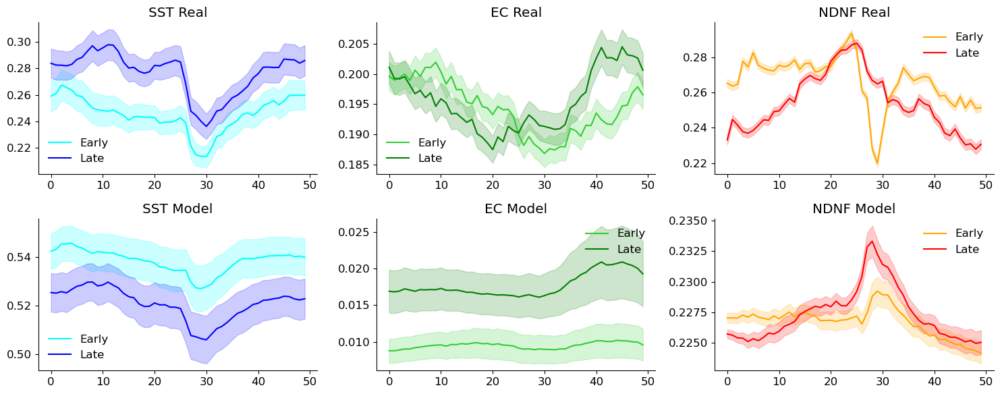

In [196]:
early_array_SST, late_array_SST = get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00)
early_array_EC, late_array_EC = get_early_vs_late_activity(cell_EC_model_ranks20_contig_x00)
early_array_NDNF, late_array_NDNF = get_early_vs_late_activity(cell_NDNF_model_ranks20_contig_x00)

fig, axs = plt.subplots(2,3, figsize=(15,6))

mean_early_array_SST = np.mean(early_array_SST, axis=0)
sem_early_array_SST = sem(early_array_SST, axis=0)

axs[0,0].plot(mean_early_array_SST, color='cyan', label="Early")
axs[0,0].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')

mean_late_array_SST = np.mean(late_array_SST, axis=0)
sem_early_array_SST = sem(late_array_SST, axis=0)

axs[0,0].plot(mean_late_array_SST, color='b', label="Late")
axs[0,0].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
axs[0,0].set_title("SST Real")
axs[0,0].legend()



mean_SST_early_model = np.mean(trial_averaged_cell_array_early_SST_trough, axis=0)
sem_SST_early = sem(trial_averaged_cell_array_early_SST_trough, axis=0)
mean_SST_late_model = np.mean(trial_averaged_cell_array_late_SST_trough, axis=0)
sem_SST_late = sem(trial_averaged_cell_array_late_SST_trough, axis=0)


axs[1,0].plot(mean_SST_early_model, label="Early", color='cyan')
axs[1,0].fill_between(range(len(mean_SST_early_model)), mean_SST_early_model+sem_SST_early, mean_SST_early_model-sem_SST_early, alpha=0.2, color='cyan')
axs[1,0].plot(mean_SST_late_model, label="Late", color='blue')
axs[1,0].fill_between(range(len(mean_SST_late_model)), mean_SST_late_model+sem_SST_late, mean_SST_late_model-sem_SST_late, alpha=0.2, color='blue')
axs[1,0].set_title("SST Model")
axs[1,0].legend()


mean_early_array_EC = np.mean(early_array_EC, axis=0)
sem_early_array_EC = sem(early_array_EC, axis=0)

axs[0,1].plot(mean_early_array_EC, color='limegreen', label='Early')
axs[0,1].fill_between(range(len(mean_early_array_EC)), mean_early_array_EC+sem_early_array_EC, mean_early_array_EC-sem_early_array_EC, alpha=0.2, color='limegreen')

mean_late_array_EC = np.mean(late_array_EC, axis=0)
sem_late_array_EC = sem(late_array_EC, axis=0)

axs[0,1].plot(mean_late_array_EC, color='green', label="Late")
axs[0,1].fill_between(range(len(mean_late_array_EC)), mean_late_array_EC+sem_late_array_EC, mean_late_array_EC-sem_late_array_EC, alpha=0.2, color='green')
axs[0,1].set_title("EC Real")
axs[0,1].legend()


mean_EC_early_model = np.mean(trial_averaged_cell_array_early_EC_peak, axis=0)
sem_EC_early = sem(trial_averaged_cell_array_early_EC_peak, axis=0)
mean_EC_late_model = np.mean(trial_averaged_cell_array_late_EC_peak, axis=0)
sem_EC_late = sem(trial_averaged_cell_array_late_EC_peak, axis=0)


axs[1,1].plot(mean_EC_early_model, label="Early", color='limegreen')
axs[1,1].fill_between(range(len(mean_EC_early_model)), mean_EC_early_model+sem_EC_early, mean_EC_early_model-sem_EC_early, alpha=0.2, color='limegreen')
axs[1,1].plot(mean_EC_late_model, label="Late", color='green')
axs[1,1].fill_between(range(len(mean_EC_late_model)), mean_EC_late_model+sem_EC_late, mean_EC_late_model-sem_EC_late, alpha=0.2, color='green')
axs[1,1].set_title("EC Model")
axs[1,1].legend()



mean_early_array_NDNF = np.mean(early_array_NDNF, axis=0)
sem_early_array_NDNF = sem(early_array_NDNF, axis=0)
mean_late_array_NDNF = np.mean(late_array_NDNF, axis=0)
sem_late_array_NDNF = sem(late_array_NDNF, axis=0)

axs[0,2].plot(mean_early_array_NDNF, label="Early", color='orange')
axs[0,2].fill_between(range(len(mean_early_array_NDNF)), mean_early_array_NDNF+sem_early_array_EC, mean_early_array_NDNF-sem_early_array_EC, alpha=0.2, color='orange')
axs[0,2].plot(mean_late_array_NDNF, label="Late", color='r')
axs[0,2].fill_between(range(len(mean_late_array_NDNF)), mean_late_array_NDNF+sem_late_array_EC, mean_late_array_NDNF-sem_late_array_EC, alpha=0.2, color='r')
axs[0,2].set_title("NDNF Real")
axs[0,2].legend()


mean_NDNF_early_model = np.mean(trial_averaged_cell_array_early_NDNF_peak, axis=0)
sem_NDNF_early = sem(trial_averaged_cell_array_early_NDNF_peak, axis=0)
mean_NDNF_late_model = np.mean(trial_averaged_cell_array_late_NDNF_peak, axis=0)
sem_NDNF_late = sem(trial_averaged_cell_array_late_NDNF_peak, axis=0)


axs[1,2].plot(mean_NDNF_early_model, label="Early", color='orange')
axs[1,2].fill_between(range(len(mean_NDNF_early_model)), mean_NDNF_early_model+sem_NDNF_early, mean_NDNF_early_model-sem_NDNF_early, alpha=0.2, color='orange')
axs[1,2].plot(mean_NDNF_late_model, label="Late", color='r')
axs[1,2].fill_between(range(len(mean_NDNF_late_model)), mean_NDNF_late_model+sem_NDNF_late, mean_NDNF_late_model-sem_NDNF_late, alpha=0.2, color='r')
axs[1,2].set_title("NDNF Model")
axs[1,2].legend()


plt.tight_layout()
plt.show()


In [ ]:
def loss_fn(params):
    ndnf_sf, sst_sf = params
    summed = EC - (ndnf_sf * NDNF + sst_sf * SST)
    
    # Main loss: how well EC is canceled
    main_loss = np.mean(np.abs(summed))  # or try np.mean(summed**2)

    # Penalty for unequal scale factors
    equal_scaling_penalty = np.abs(ndnf_sf - sst_sf)

    # Total loss = main loss + lambda * penalty
    return main_loss + 50 * equal_scaling_penalty  # adjust 0.1 if needed

In [231]:
trial_averaged_cell_array_early_NDNF_peak.shape

(73, 50)

In [236]:
def loss_fn(params, mean_early_array_NDNF, mean_late_array_NDNF):
    vol, inits = params  # unpack optimization parameters

    model_cell_list_NDNF_peak_early, model_cell_list_NDNF_peak_late, full_activity_list_NDNF_peak, trial_averaged_cell_array_early_NDNF_peak, trial_averaged_cell_array_late_NDNF_peak, full_activity_trial_av_array_NDNF_peak = reconstruct_activity_from_clusters(
        mean_before_field_array_early_peak_NDNF,
        mean_near_field_array_early_peak_NDNF,
        mean_after_field_array_early_peak_NDNF,
        mean_before_field_array_late_peak_NDNF,
        mean_near_field_array_late_peak_NDNF,
        mean_after_field_array_late_peak_NDNF,
        percent_lists_NDNF_early_peak,
        percent_lists_NDNF_late_peak,
        percent_of_cells_list_NDNF_early_trough,
        percent_of_cells_list_NDNF_late_trough,
        num_cells=73,
        cell_type="NDNF Peak",
        plot=False,
        vol=vol,
        inits=inits,
    )

    mean_NDNF_early_model = np.mean(trial_averaged_cell_array_early_NDNF_peak, axis=0)
    mean_NDNF_late_model = np.mean(trial_averaged_cell_array_late_NDNF_peak, axis=0)

    mse_early = np.mean((mean_NDNF_early_model - mean_early_array_NDNF)**2)
    mse_late = np.mean((mean_NDNF_late_model - mean_late_array_NDNF)**2)

    return mse_early + mse_late

from scipy.optimize import minimize

initial_guess = [0.01, 0.5]  # vol, inits
bounds = [(0, 1), (0, 1)]

result = minimize(loss_fn, initial_guess, args=(mean_early_array_NDNF, mean_late_array_NDNF), bounds=bounds)

print("Best vol:", result.x[0])
print("Best inits:", result.x[1])


before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before

(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733

(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
69.86301369863014
mean_early 3.8516908174210664 mean_late 4.852268038837603
(50, 100)
before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733

example_early_average (3, 50)


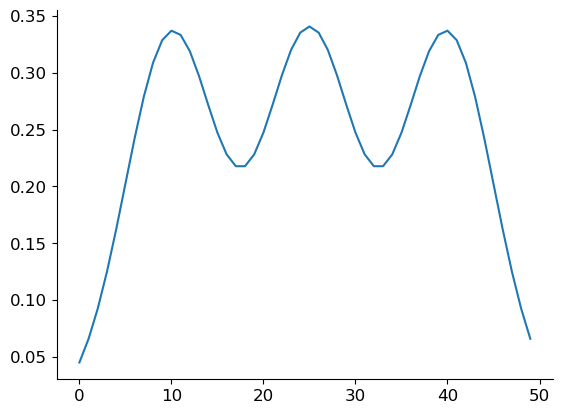

before_percent_array 116.2797522119033 before_percent_array_late 107.16897028160659
near_percent_array 667.38958002598 before_percent_array_late 894.1981697269256
before_percent_array 59.85095677733023 before_percent_array_late 61.27956049690275
overall_early 843.5202890152135 overall_late 1062.6467005054349
88.0
(50, 100)


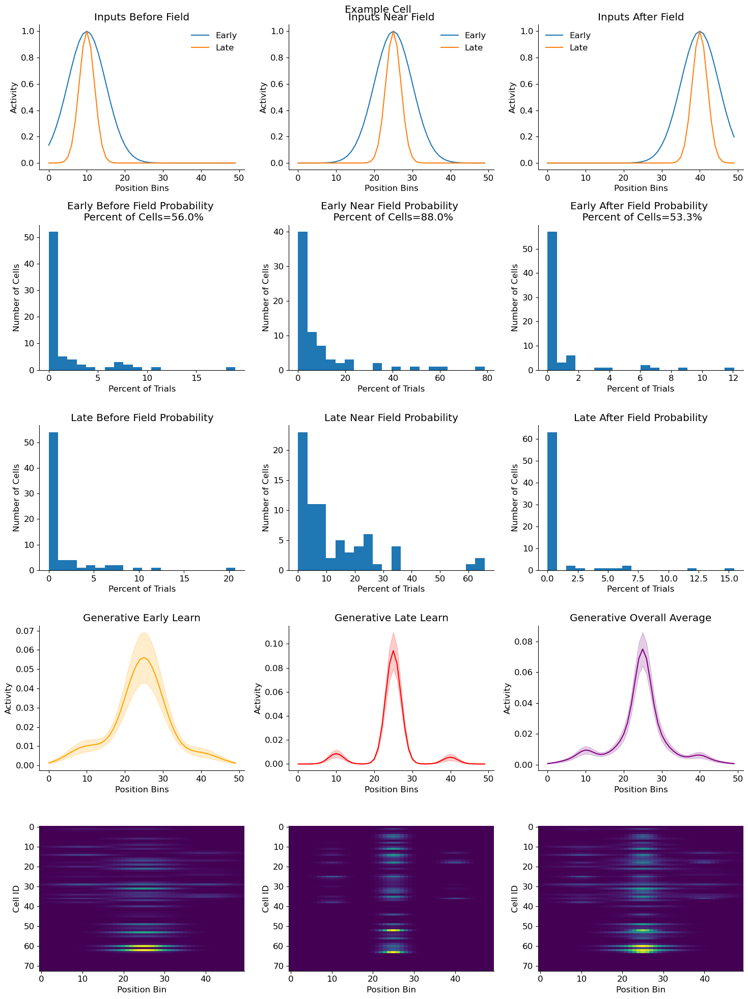

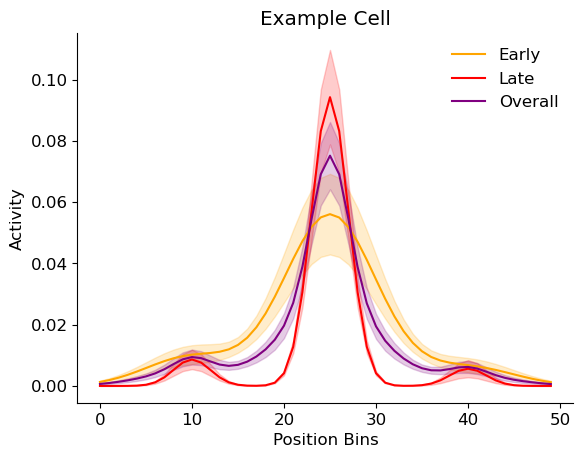

In [126]:



def reconstruct_activity_from_clusters(example_before_field_early, example_near_field_early, example_after_field_early, example_before_field_late, example_near_field_late, example_after_field_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST Trough", plot=False):

    before_percent_array = np.array(percent_lists_NDNF_early_peak[0])
    sum_before = np.sum(before_percent_array)
    near_percent_array = np.array(percent_lists_NDNF_early_peak[1])
    sum_near = np.sum(near_percent_array)
    after_percent_array = np.array(percent_lists_NDNF_early_peak[2])
    sum_after = np.sum(after_percent_array)

    before_percent_array_late = np.array(percent_lists_NDNF_late_peak[0])
    sum_before_late = np.sum(before_percent_array_late)
    near_percent_array_late = np.array(percent_lists_NDNF_late_peak[1])
    sum_near_late = np.sum(near_percent_array_late)
    after_percent_array_late = np.array(percent_lists_NDNF_late_peak[2])
    sum_after_late = np.sum(after_percent_array_late)
    
    print(f"before_percent_array {sum_before} before_percent_array_late {sum_before_late}")
    print(f"near_percent_array {sum_near} before_percent_array_late {sum_near_late}")
    print(f"before_percent_array {sum_after} before_percent_array_late {sum_after_late}")
    print(f"overall_early {np.sum([sum_before, sum_near, sum_after])} overall_late {np.sum([sum_before_late, sum_near_late, sum_after_late])}")


    trial_averaged_cell_list_early = []
    trial_averaged_cell_list_late = []

    cell_list_early = []
    cell_list_late = []
    
    available_trials_before_early = percent_of_cells_list_SST_early_trough[0]*100
    available_trials_near_early = percent_of_cells_list_SST_early_trough[1]*100
    print(available_trials_near_early)
    available_trials_after_early = percent_of_cells_list_SST_early_trough[2]*100

    available_trials_before_late = percent_of_cells_list_SST_late_trough[0]*100
    available_trials_near_late = percent_of_cells_list_SST_late_trough[1]*100
    available_trials_after_late = percent_of_cells_list_SST_late_trough[2]*100


    for i in range(num_cells):
        cell_array = np.zeros((50,100))
        cell_array_late = np.zeros((50,100))

        # Only assign fields if this cell is allowed to express that field
        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before = np.random.choice(100, int(before_percent_array[i]), replace=False)
            for t in trial_indices_before:
                cell_array[:, t] = example_before_field_early

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near = np.random.choice(100, int(near_percent_array[i]), replace=False)
            for t in trial_indices_near:
                cell_array[:, t] = example_near_field_early

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after = np.random.choice(100, int(after_percent_array[i]), replace=False)
            for t in trial_indices_after:
                cell_array[:, t] = example_after_field_early

        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before_late = np.random.choice(100, int(before_percent_array_late[i]), replace=False)
            for t in trial_indices_before_late:
                cell_array_late[:, t] = example_before_field_late

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near_late = np.random.choice(100, int(near_percent_array_late[i]), replace=False)
            for t in trial_indices_near_late:
                cell_array_late[:, t] = example_near_field_late

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after_late = np.random.choice(100, int(after_percent_array_late[i]), replace=False)
            for t in trial_indices_after_late:
                cell_array_late[:, t] = example_after_field_late

        cell_list_early.append(cell_array)
        cell_list_late.append(cell_array_late)
        trial_averaged_cell_list_early.append(np.mean(cell_array, axis=1))
        trial_averaged_cell_list_late.append(np.mean(cell_array_late, axis=1))


    full_activity_list = []
    full_activity_trial_av_list = []

    for i in range(len(cell_list_early)):
        early_component = cell_list_early[i]
        late_component = cell_list_late[i]

        full_actiivty = np.concatenate([early_component, late_component], axis=1)

        full_activity_list.append(full_actiivty)

        full_activity_trial_av_list.append(np.mean(full_actiivty, axis=1))

    
    full_activity_trial_av_array = np.array(full_activity_trial_av_list)
    
    trial_averaged_cell_array_early = np.array(trial_averaged_cell_list_early)
    print(cell_list_early[0].shape)
    trial_averaged_cell_array_late = np.array(trial_averaged_cell_list_late)
    
    if plot: 
        fig, axs = plt.subplots(5, 3, figsize=(15,20))
        plt.suptitle(cell_type)


        axs[0,0].plot(example_before_field_early, label="Early")
        axs[0,0].plot(example_before_field_late, label="Late")
        axs[0,0].legend()
        axs[0,0].set_title("Inputs Before Field")
        axs[0,0].set_ylabel("Activity")
        axs[0,0].set_xlabel("Position Bins")
        axs[0,0].legend()


        axs[0,1].plot(example_near_field_early, label="Early")
        axs[0,1].plot(example_near_field_late, label="Late")
        axs[0,1].legend()
        axs[0,1].set_title("Inputs Near Field")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_xlabel("Position Bins")
        axs[0,1].legend()


        axs[0,2].plot(example_after_field_early, label="Early")
        axs[0,2].plot(example_after_field_late, label="Late")
        axs[0,2].legend()
        axs[0,2].set_title("Inputs After Field")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_xlabel("Position Bins")
        axs[0,2].legend()

        
        axs[1,0].hist(before_percent_array, bins=20)
        axs[1,0].set_title(f"Early Before Field Probability \n Percent of Cells={available_trials_before_early:.1f}%")
        axs[1,0].set_ylabel("Number of Cells")
        axs[1,0].set_xlabel("Percent of Trials")

        axs[1,1].hist(near_percent_array, bins=20)
        axs[1,1].set_title(f"Early Near Field Probability \n Percent of Cells={available_trials_near_early:.1f}%")
        axs[1,1].set_ylabel("Number of Cells")
        axs[1,1].set_xlabel("Percent of Trials")

        axs[1,2].hist(after_percent_array, bins=20)
        axs[1,2].set_title(f"Early After Field Probability \n Percent of Cells={available_trials_after_early:.1f}%")
        axs[1,2].set_ylabel("Number of Cells")
        axs[1,2].set_xlabel("Percent of Trials")

        axs[2,0].hist(before_percent_array_late, bins=20)
#         axs[2,0].set_title(f"Late Before Field Probability \n Percent of Cells={available_trials_before_late:.1f}%")
        axs[2,0].set_title("Late Before Field Probability")
        axs[2,0].set_ylabel("Number of Cells")
        axs[2,0].set_xlabel("Percent of Trials")

        axs[2,1].hist(near_percent_array_late, bins=20)
#         axs[2,1].set_title(f"Late Near Field Probability \n Percent of Cells={available_trials_near_late:.1f}%")
        axs[2,1].set_title("Late Near Field Probability")
        axs[2,1].set_ylabel("Number of Cells")
        axs[2,1].set_xlabel("Percent of Trials")

        axs[2,2].hist(after_percent_array_late, bins=20)
#         axs[2,2].set_title(f"Late After Field Probability \n Percent of Cells={available_trials_after_late:.1f}%")
        axs[2,2].set_title("Late After Field Probability")
        axs[2,2].set_ylabel("Number of Cells")
        axs[2,2].set_xlabel("Percent of Trials")

        axs[4,0].imshow(trial_averaged_cell_array_early, aspect='auto')
        axs[4,0].set_ylabel("Cell ID")
        axs[4,0].set_xlabel("Position Bin")

        means_early = np.mean(trial_averaged_cell_array_early, axis=0)
        sems_early = sem(trial_averaged_cell_array_early, axis=0)
        axs[3,0].plot(means_early, color='orange')
        axs[3,0].fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        axs[3,0].set_xlabel("Position Bins")
        axs[3,0].set_ylabel("Activity")
        axs[3,0].set_title("Generative Early Learn")

        axs[4,1].imshow(trial_averaged_cell_array_late, aspect='auto')
        axs[4,1].set_ylabel("Cell ID")
        axs[4,1].set_xlabel("Position Bin")

        means_late = np.mean(trial_averaged_cell_array_late, axis=0)
        sems_late = sem(trial_averaged_cell_array_late, axis=0)
        axs[3,1].plot(means_late, color='r')
        axs[3,1].fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        axs[3,1].set_xlabel("Position Bins")
        axs[3,1].set_ylabel("Activity")
        axs[3,1].set_title("Generative Late Learn")

        axs[4,2].imshow(full_activity_trial_av_array, aspect='auto')
        axs[4,2].set_ylabel("Cell ID")
        axs[4,2].set_xlabel("Position Bin")


        means_overall= np.mean(full_activity_trial_av_list, axis=0)
        sems_overall= sem(full_activity_trial_av_list, axis=0)
        axs[3,2].plot(means_overall, color='purple')
        axs[3,2].fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        axs[3,2].set_xlabel("Position Bins")
        axs[3,2].set_ylabel("Activity")
        axs[3,2].set_title("Generative Overall Average")

        plt.tight_layout()
        plt.show()


        plt.plot(means_early, color='orange', label='Early')
        plt.fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        plt.plot(means_late, color='r', label="Late")
        plt.fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        plt.plot(means_overall, color='purple', label='Overall')
        plt.fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        plt.ylabel("Activity")
        plt.xlabel("Position Bins")
        plt.title(cell_type)
        plt.legend()
        plt.show()
    else:
        return cell_list_early, cell_list_late, full_activity_list, trial_averaged_cell_array_early, trial_averaged_cell_array_late, full_activity_trial_av_array

    
example_before_field = generate_gaussian(length=50, peak_position=10, std=5, amplitude=1.0)
example_near_field = generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0)
example_after_field = generate_gaussian(length=50, peak_position=40, std=5, amplitude=1.0)

example_early_average = np.vstack([example_before_field, example_near_field, example_after_field])
print(f"example_early_average {example_early_average.shape}")
plt.plot(np.mean(example_early_average, axis=0))
plt.show()

example_before_field_late = generate_gaussian(length=50, peak_position=10, std=2, amplitude=1.0)
example_near_field_late = generate_gaussian(length=50, peak_position=25, std=2, amplitude=1.0)
example_after_field_late = generate_gaussian(length=50, peak_position=40, std=2, amplitude=1.0)

    
reconstruct_activity_from_clusters(example_before_field, example_near_field, example_after_field, example_before_field_late, example_near_field_late, example_after_field_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="Example Cell", plot=True)


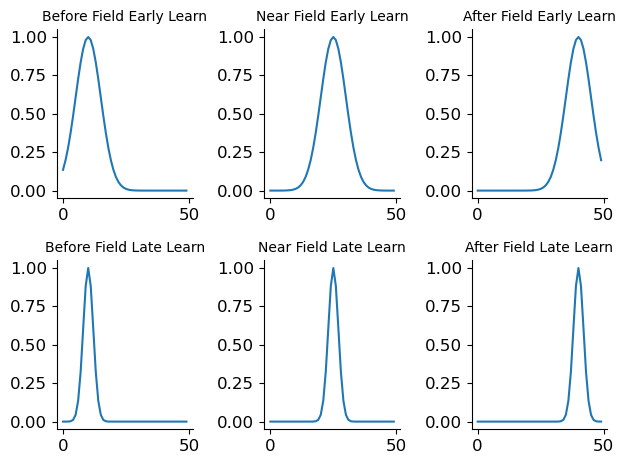

In [19]:
fig, axs = plt.subplots(2,3)

axs[0,0].plot(example_before_field)
axs[0,0].set_title("Before Field Early Learn", fontsize=10)

axs[0,1].plot(example_near_field)
axs[0,1].set_title("Near Field Early Learn", fontsize=10)

axs[0,2].plot(example_after_field)
axs[0,2].set_title("After Field Early Learn", fontsize=10)

 
axs[1,0].plot(example_before_field_late)
axs[1,0].set_title("Before Field Late Learn", fontsize=10)

axs[1,1].plot(example_near_field_late)
axs[1,1].set_title("Near Field Late Learn", fontsize=10)


axs[1,2].plot(example_after_field_late)
axs[1,2].set_title("After Field Late Learn", fontsize=10)

plt.tight_layout()
plt.show()

 
 
 


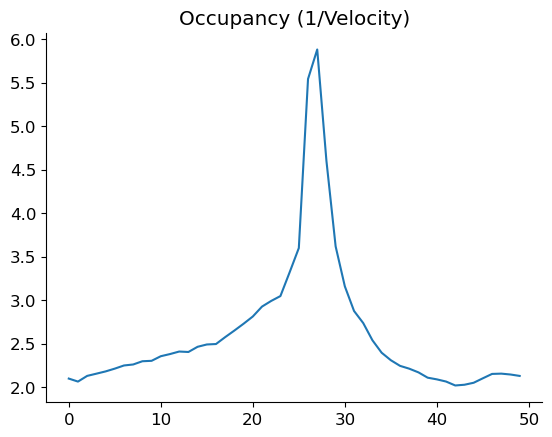

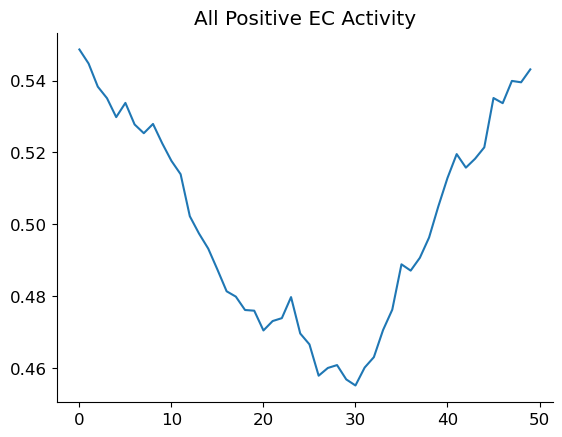

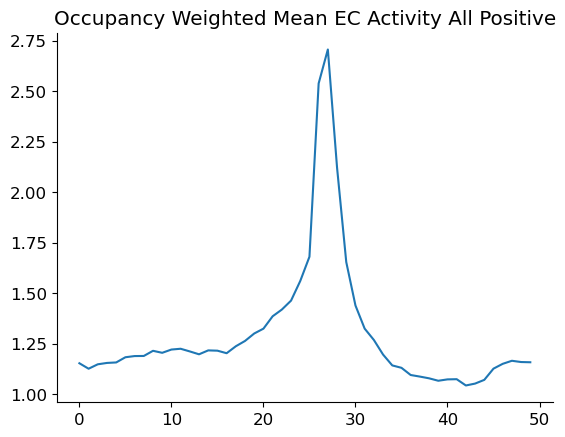

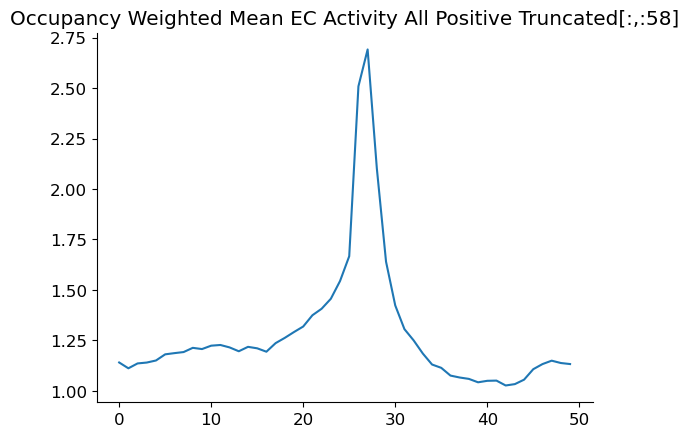

In [46]:
occupancy = 1/mean_new_average_vel_array
plt.plot(occupancy)
plt.title("Occupancy (1/Velocity)")
plt.show()

EC_list = []
EC_list_trunc = []

for animal in activity_dict_EC:
    for cell in activity_dict_EC[animal]:
        EC_list.append(np.mean(activity_dict_EC[animal][cell], axis=1))
        EC_list_trunc.append(np.mean(activity_dict_EC[animal][cell][:,:58], axis=1))
        
EC_array = np.array(EC_list)
mean_EC_array = np.mean(EC_array, axis=0) + 0.5

plt.plot(mean_EC_array)
plt.title("All Positive EC Activity")
plt.show()

mean_EC_array_occupancy_weighted = mean_EC_array * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity All Positive")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()





EC_array_trunc = np.array(EC_list_trunc)
mean_EC_array_trunc = np.mean(EC_array_trunc, axis=0) + 0.5
mean_EC_array_occupancy_weighted = mean_EC_array_trunc * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity All Positive Truncated[:,:58]")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()

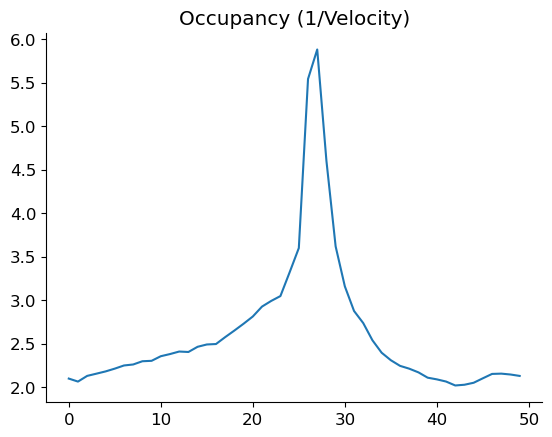

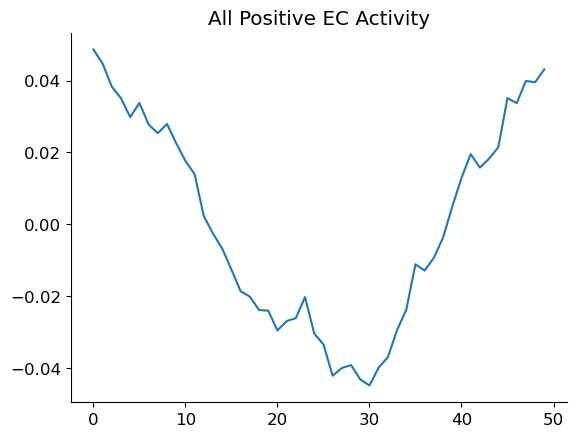

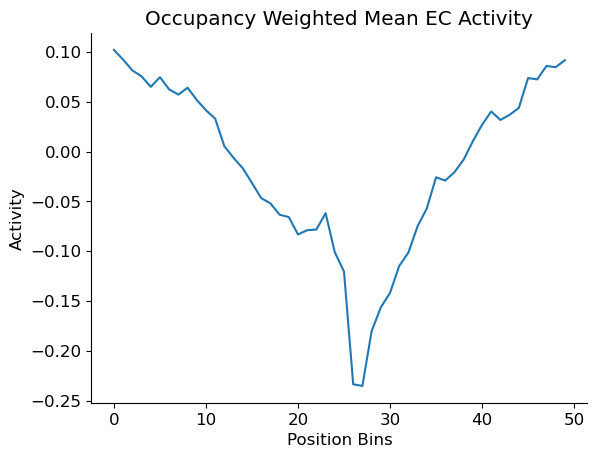

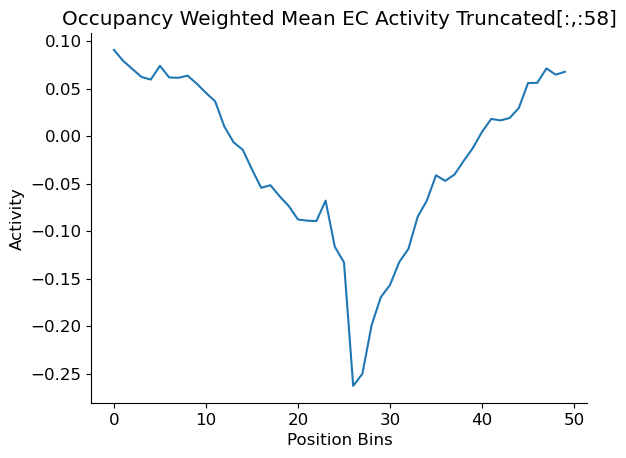

In [47]:
occupancy = 1/mean_new_average_vel_array
plt.plot(occupancy)
plt.title("Occupancy (1/Velocity)")
plt.show()

EC_list = []
EC_list_trunc = []

for animal in activity_dict_EC:
    for cell in activity_dict_EC[animal]:
        EC_list.append(np.mean(activity_dict_EC[animal][cell], axis=1))
        EC_list_trunc.append(np.mean(activity_dict_EC[animal][cell][:,:58], axis=1))
        
EC_array = np.array(EC_list)
mean_EC_array = np.mean(EC_array, axis=0)

plt.plot(mean_EC_array)
plt.title("All Positive EC Activity")
plt.show()

mean_EC_array_occupancy_weighted = mean_EC_array * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()





EC_array_trunc = np.array(EC_list_trunc)
mean_EC_array_trunc = np.mean(EC_array_trunc, axis=0) 
mean_EC_array_occupancy_weighted = mean_EC_array_trunc * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity Truncated[:,:58]")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()

(4717,)
(50,)
(50,)


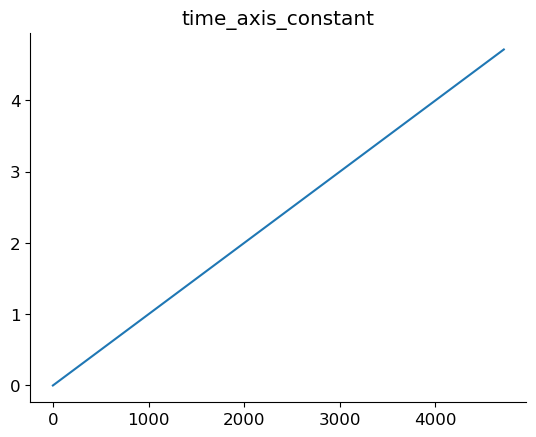

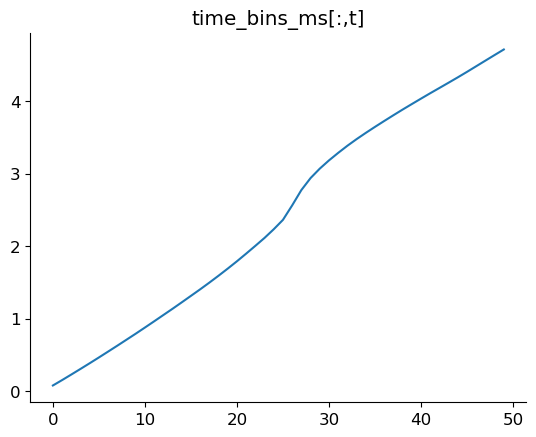

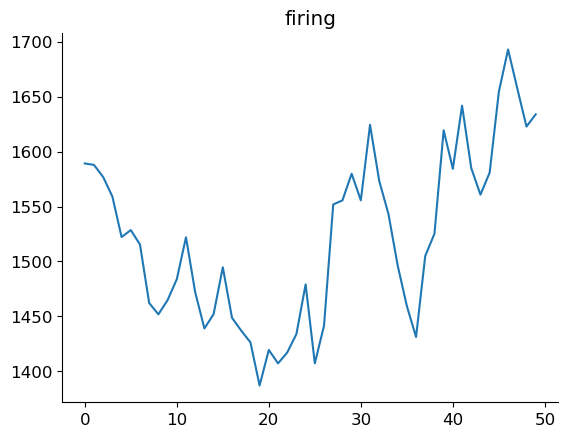

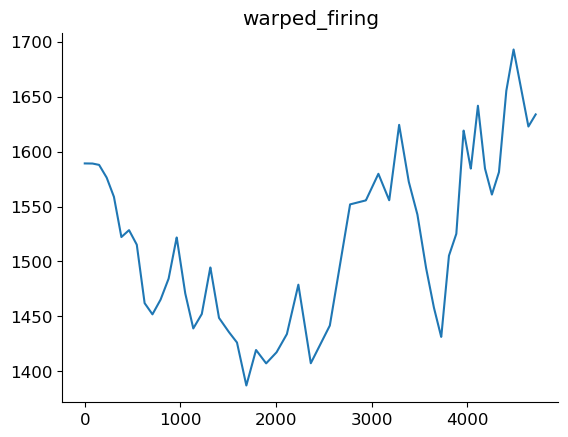

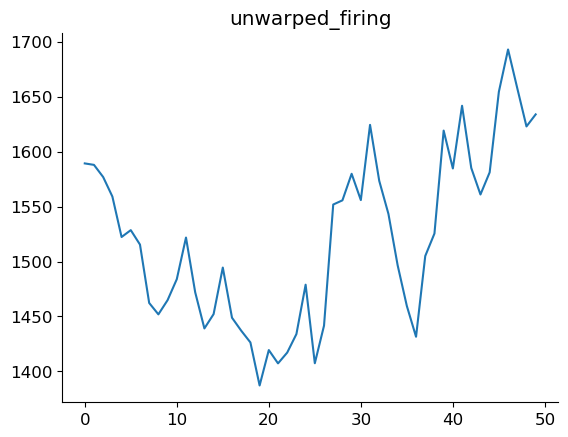

In [177]:
warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

print(time_axis_constant.shape)
print(firing.shape)
print(time_bins_ms[:,t].shape)

plt.plot(time_axis_constant)
plt.title("time_axis_constant")
plt.show()

plt.plot(time_bins_ms[:,t])
plt.title("time_bins_ms[:,t]")
plt.show()

plt.plot(firing)
plt.title("firing")
plt.show()

plt.plot(warped_firing)
plt.title("warped_firing")
plt.show()



unwarped_firing = np.interp(time_bins_ms[:,t], time_axis_constant, warped_firing)
                            
plt.plot(unwarped_firing)
plt.title("unwarped_firing")
plt.show()